# Automatic BSPF Trigger Plots

Creates automatic event plots based on catalog 

In [59]:
import os, pprint
import obspy as obs
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from andbro__savefig import __savefig
from tqdm.notebook import tqdm
from functions.request_data import __request_data


In [40]:
if os.uname().nodename == 'lighthouse':
    root_path = '/home/andbro/'
    data_path = '/home/andbro/kilauea-data/'
    archive_path = '/home/andbro/freenas/'
elif os.uname().nodename == 'kilauea':
    root_path = '/home/brotzer/'
    data_path = '/import/kilauea-data/'
    archive_path = '/import/freenas-ffb-01-data/'

In [41]:
# def __request_data(seed, tbeg, tend):

#     from obspy.clients.fdsn import Client

#     client = Client("IRIS")

#     net, sta, loc, cha = seed.split(".")

#     try:
#         inventory = client.get_stations(network=net, 
#                                          station=sta,
#                                          starttime=tbeg,
#                                          endtime=tend,
#                                          level="response",
#                                          )
#     except:
#         print(" -> Failed to load inventory!")
#         inventory = None
        
#     try:
#         waveform = client.get_waveforms(network=net,
#                                        station=sta,
#                                        location=loc,
#                                        channel=cha, 
#                                        starttime=tbeg-60,
#                                        endtime=tend+60,
#                                        )

#     except:
#         print(" -> Failed to load waveforms!")
#         waveform = None
    
#     return waveform, inventory

In [42]:
def __add_distances_and_backazimuth(config, df):

    from obspy.geodetics.base import gps2dist_azimuth

    dist = np.zeros(len(df))
    baz = np.zeros(len(df))

    
    for ii, ev in enumerate(df.index):
        try:
            dist[ii], az, baz[ii] = gps2dist_azimuth(config['BSPF_lat'], config['BSPF_lon'],
                                                     df.latitude[ii], df.longitude[ii],
                                                     a=6378137.0, f=0.0033528106647474805
                                                     )
        except:
            print(" -> failed to compute!")
            
    df['backazimuth'] = baz
    df['distances_km'] = dist/1000

    return df

In [43]:
# def __process_bspf(config, st, inv):

#     py_bspf = st.copy()

#     ## merge traces that might be split due to data gaps or overlaps
# #     py_bspf.merge(fill_value="interpolate")

#     ## cut to event
# #     py_bspf.trim(config['tbeg'], config['tend'])

#     ## renove sensitivity
# #     py_bspf.remove_sensitivity(inv)

#     ## remove mean
#     py_bspf.detrend("demean")

#     ## apply taper
#     py_bspf.taper(0.1)

#     ## bandpass filter
#     py_bspf = py_bspf.filter("bandpass", freqmin=config['fmin'], freqmax=config['fmax'], corners=4, zerophase=True)

#     ## adjust channel names
#     for tr in py_bspf:
#         if tr.stats.channel[-1] == "1":
#             tr.stats.channel = str(tr.stats.channel).replace("1","E")
#         if tr.stats.channel[-1] == "2":
#             tr.stats.channel = str(tr.stats.channel).replace("2","N")        
#         if tr.stats.channel[-1] == "3":
#             tr.stats.channel = str(tr.stats.channel).replace("3","Z")

#     ## show all traces in data stream
# #     print(py_bspf)
    
#     return py_bspf

In [44]:
def __process_xpfo(config, st, inv):

    ii_pfo = st.copy()

#     pre_filt = [0.005, 0.01, 19, 20]

    ## cut properly
#     ii_pfo.trim(config['tbeg'], config['tend'])

    ## demean
    ii_pfo.detrend("demean")

    ## remove response
#     ii_pfo.remove_response(inventory=inv, 
#     #                        pre_filt=pre_filt, 
#                            output="VEL",
#     #                        water_level=60, 
#                            plot=False)

    ## taper 
    ii_pfo.taper(0.1)

    ## bandpass
    ii_filter = ii_pfo.filter("bandpass", freqmin=config['fmin'], freqmax=config['fmax'], corners=4, zerophase=True)

    ## adjust channel names
    for tr in ii_pfo:
        if tr.stats.channel[-1] == "1":
            tr.stats.channel = str(tr.stats.channel).replace("1","N")
        if tr.stats.channel[-1] == "2":
            tr.stats.channel = str(tr.stats.channel).replace("2","E")
    
    return ii_pfo

In [45]:
def __makeplot(config, st):

    
    st_in = st.copy()
    
    fig, ax = plt.subplots(6,1, figsize=(15,10), sharex=True)

    font = 14

    time_scaling, time_unit = 1, "sec"
    rot_scaling = 1e9
    trans_scaling = 1e6
    
    for i, tr in enumerate(st_in):
        
        if i in [0,1,2]:
            ax[i].set_ylabel(r"$\omega$ (nrad/s)", fontsize=font)
            ax[i].plot(tr.times()/time_scaling, tr.data*rot_scaling, 'k', label=tr.stats.station+"."+tr.stats.channel)

        elif i in [3,4,5]:
            ax[i].set_ylabel(r"u ($\mu$m/s)", fontsize=font)
            ax[i].plot(tr.times()/time_scaling, tr.data*trans_scaling, 'k', label=tr.stats.station+"."+tr.stats.channel)
            
        ax[i].legend(loc=1)
        
    ax[5].set_xlabel(f"Time ({time_unit}) from {st[0].stats.starttime.date} {str(st[0].stats.starttime.time).split('.')[0]} UTC", fontsize=font)
    ax[0].set_title(config['title']+f" | {config['fmin']} - {config['fmax']} Hz", fontsize=font, pad=10)
    
    plt.show();
    del st_in
    return fig

In [46]:
def __makeplotStreamSpectra2(st, config, fscale=None):

    from scipy import fftpack
    from andbro__fft import __fft
    import matplotlib.pyplot as plt

    st_in = st.copy()
    
    NN = len(st_in)
    rot_scaling, rot_unit = 1e9, r"nrad/s"
    trans_scaling, trans_unit = 1e6, r"$\mu$m/s"
        
    fig, axes = plt.subplots(NN,2,figsize=(15,int(NN*2)), sharex='col')

    font = 14
    
    plt.subplots_adjust(hspace=0.3)

    ## _______________________________________________

    st.sort(keys=['channel'], reverse=True)
    
    for i, tr in enumerate(st_in):

#         comp_fft = abs(fftpack.fft(tr.data))
#         ff       = fftpack.fftfreq(comp_fft.size, d=1/tr.stats.sampling_rate)
#         comp_fft = fftpack.fftshift(comp_fft)
#         ff, spec = ff[1:len(ff)//2], abs(fftpack.fft(tr.data)[1:len(ff)//2])

        if tr.stats.channel[-2] == "J":
            scaling = rot_scaling
        elif tr.stats.channel[-2] == "H":
            scaling = trans_scaling

        spec, ff, ph = __fft(tr.data*scaling, tr.stats.delta, window=None, normalize=None)
    
    
        ## _________________________________________________________________
        if tr.stats.channel[-2] == "J":
            axes[i,0].plot(
                        tr.times(),
                        tr.data*rot_scaling,
                        color='black',
                        label='{} {}'.format(tr.stats.station, tr.stats.channel),
                        lw=1.0,
                        )

        elif tr.stats.channel[-2] == "H":
            axes[i,0].plot(
                        tr.times(),
                        tr.data*trans_scaling,
                        color='black',
                        label='{} {}'.format(tr.stats.station, tr.stats.channel),
                        lw=1.0,
                        )
        ## _________________________________________________________________
        if fscale == "loglog":
            axes[i,1].loglog(ff, spec, color='black', lw=1.0)
        elif fscale == "loglin":
            axes[i,1].semilogx(ff, spec, color='black', lw=1.0)
        elif fscale == "linlog":
            axes[i,1].semilogy(ff, spec, color='black', lw=1.0)
        else:
            axes[i,1].plot(ff, spec, color='black', lw=1.0)         
        
        
        if tr.stats.channel[1] == "J":
            sym, unit = r"$\Omega$", rot_unit
        elif tr.stats.channel[1] == "H":
            sym, unit = "v", trans_unit
        else:
            unit = "Amplitude", "a.u."
            
        axes[i,0].set_ylabel(f'{sym} ({unit})',fontsize=font)    
        axes[i,1].set_ylabel(f'ASD \n({unit}/Hz)',fontsize=font)        
        axes[i,0].legend(loc='upper left',bbox_to_anchor=(0.8, 1.10), framealpha=1.0)
        
#         axes[i,0].ticklabel_format(axis='y', style='sci', scilimits=(0,0))
#         axes[i,1].ticklabel_format(axis='y', style='sci', scilimits=(0,0))

    if "fmin" in config.keys() and "fmax" in config.keys():
        axes[i,1].set_xlim(config['fmin'],config['fmax'])

    axes[NN-1,0].set_xlabel(f"Time from {tr.stats.starttime.date} {str(tr.stats.starttime.time)[:8]} (s)",fontsize=font)     
    axes[NN-1,1].set_xlabel(f"Frequency (Hz)",fontsize=font)     

    del st_in
    return fig

## Configurations

In [47]:
config = {}

In [48]:
## location of BSPF
config['BSPF_lon'] = -116.455439
config['BSPF_lat'] = 33.610643

## path for figures to store
config['outpath_figs'] = data_path+"BSPF/figures/triggered2/"

config['path_trigger'] = data_path+"BSPF/trigger2/"

## blueSeis sensor
config['seed_blueseis'] = "PY.BSPF..HJ*"

## Trillium 240 next to BlueSeis on Pier
config['seed_seismometer'] = "II.PFO.10.BH*" 
# config['seed_seismometer'] = "PY.BSPF..HH*" 

## Event Info

In [49]:
def __read_pickle(path, filename):
    
    import pickle

    with open(path+filename, 'rb') as f:
        triggerfile = pickle.load(f)
        
    return triggerfile

In [50]:
trigger_events = __read_pickle(config['path_trigger'], "trigger_all.pkl")

In [51]:
trigger_events_df = pd.DataFrame()

trigger_events_df['origin'] = [trig['time'] for trig in trigger_events]
trigger_events_df['duration'] = [trig['duration'] for trig in trigger_events]

events = trigger_events_df

## RUN LOOP

  0%|          | 0/73 [00:00<?, ?it/s]

 -> 0 2022-10-02T03:25:19.344538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-02T03:24:19.346400Z - 2022-10-02T03:27:20.371400Z | 40.0 Hz, 7242 samples
PY.BSPF..HJN | 2022-10-02T03:24:19.346400Z - 2022-10-02T03:27:20.371400Z | 40.0 Hz, 7242 samples
PY.BSPF..HJZ | 2022-10-02T03:24:19.346400Z - 2022-10-02T03:27:20.371400Z | 40.0 Hz, 7242 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-02T03:24:19.346400Z - 2022-10-02T03:27:20.371400Z | 40.0 Hz, 7242 samples
PY.BSPF..HJN  | 2022-10-02T03:24:19.346400Z - 2022-10-02T03:27:20.371400Z | 40.0 Hz, 7242 samples
PY.BSPF..HJZ  | 2022-10-02T03:24:19.346400Z - 2022-10-02T03:27:20.371400Z | 40.0 Hz, 7242 samples
II.PFO.10.BHN | 2022-10-02T03:24:19.344538Z - 2022-10-02T03:27:20.394538Z | 40.0 Hz, 7243 samples
II.PFO.10.BHE | 2022-10-02T03:24:19.344538Z - 2022-10-02T03:27:20.394538Z | 40.0 Hz, 7243 samples
II.PFO.10.BHZ | 2022-10-02T03:24:19.344538Z - 2022-10-02T03:27:20.394538Z | 40.0 Hz, 7243 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-02T03:24:19.346400Z - 2022-10-02T03:27:20.371400Z | 40.0 Hz, 7242 samples
PY.BSPF..HJN  | 2022-10-02T03:24:19.346400Z - 2022-10-02T03:27:20.371400Z | 40.0 Hz, 7242 samples
PY.BSPF..HJZ  | 2022-10-02T03:24:19.346400Z - 2022-10-02T03:27:20.371400Z | 40.0 Hz, 7242 samples
II.PFO.10.BHN | 2022-10-02T03:24:19.344538Z - 2022-10-02T03:27:20.394538Z | 40.0 Hz, 7243 samples
II.PFO.10.BHE | 2022-10-02T03:24:19.344538Z - 2022-10-02T03:27:20.394538Z | 40.0 Hz, 7243 samples
II.PFO.10.BHZ | 2022-10-02T03:24:19.344538Z - 2022-10-02T03:27:20.394538Z | 40.0 Hz, 7243 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-02T03:24:19.346400Z - 2022-10-02T03:27:20.371400Z | 40.0 Hz, 7242 samples
PY.BSPF..HJN  | 2022-10-02T03:24:19.346400Z - 2022-10-02T03:27:20.371400Z | 40.0 Hz, 7242 samples
PY.BSPF..HJZ  | 2022-10-02T03:24:19.346400Z - 2022-10-02T03:27:20.371400Z | 40.0 Hz, 7242 samples
II.PFO.10.BHN | 2022-10-02T03:24:19.344538Z - 2022-10-02T03:27:20.394538Z | 40.0 Hz, 7243 samples
II.PFO.10.BHE | 2022-10-02T03:24:19.344538Z - 2022-10-02T03:27:20.394538Z | 40.0 Hz, 7243 samples
II.PFO.10.BHZ | 2022-10-02T03:24:19.344538Z - 2022-10-02T03:27:20.394538Z | 40.0 Hz, 7243 samples

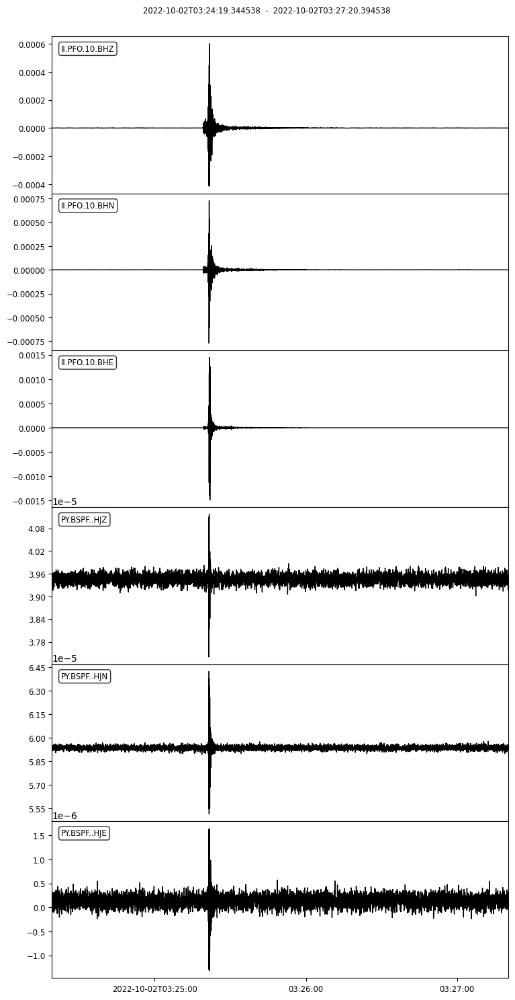


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221002T032519_raw.png ...

   -> Done

 -> 1 2022-10-03T16:08:19.219538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJN | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJZ | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJN  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJZ  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
II.PFO.10.BHN | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples
II.PFO.10.BHE | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples
II.PFO.10.BHZ | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJN  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJZ  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
II.PFO.10.BHN | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples
II.PFO.10.BHE | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples
II.PFO.10.BHZ | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJN  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJZ  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
II.PFO.10.BHN | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples
II.PFO.10.BHE | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples
II.PFO.10.BHZ | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples

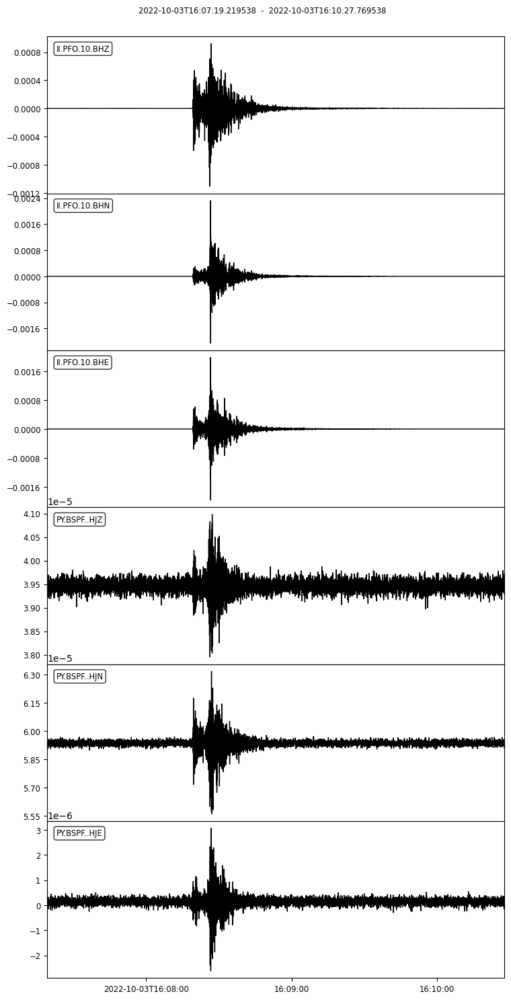


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221003T160819_raw.png ...

   -> Done

 -> 2 2022-10-03T16:08:19.219538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJN | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJZ | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJN  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJZ  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
II.PFO.10.BHN | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples
II.PFO.10.BHE | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples
II.PFO.10.BHZ | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJN  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJZ  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
II.PFO.10.BHN | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples
II.PFO.10.BHE | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples
II.PFO.10.BHZ | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJN  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
PY.BSPF..HJZ  | 2022-10-03T16:07:19.222300Z - 2022-10-03T16:10:27.747300Z | 40.0 Hz, 7542 samples
II.PFO.10.BHN | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples
II.PFO.10.BHE | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples
II.PFO.10.BHZ | 2022-10-03T16:07:19.219538Z - 2022-10-03T16:10:27.769538Z | 40.0 Hz, 7543 samples

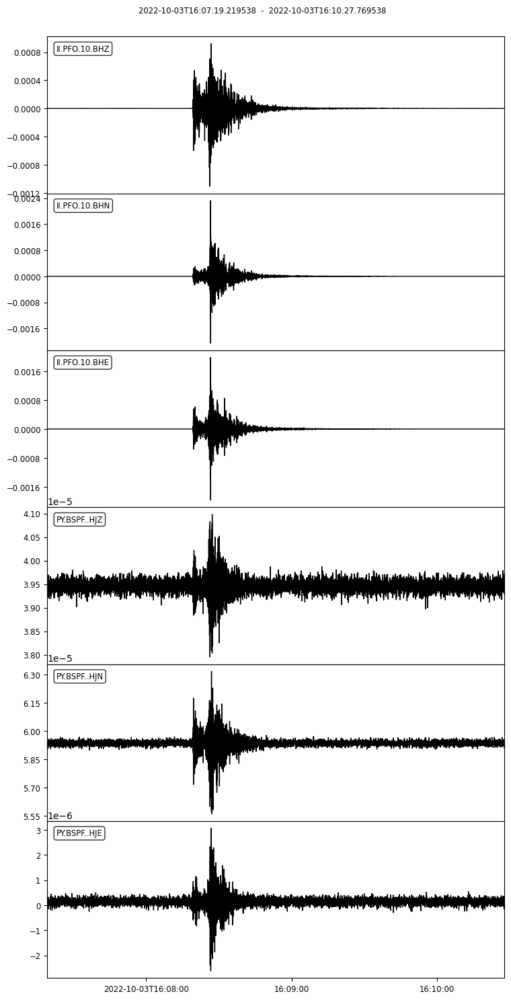


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221003T160819_raw.png ...

   -> Done

 -> 3 2022-10-05T15:39:17.944539Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-05T15:38:17.947400Z - 2022-10-05T15:41:36.847400Z | 40.0 Hz, 7957 samples
PY.BSPF..HJN | 2022-10-05T15:38:17.947400Z - 2022-10-05T15:41:36.847400Z | 40.0 Hz, 7957 samples
PY.BSPF..HJZ | 2022-10-05T15:38:17.947400Z - 2022-10-05T15:41:36.847400Z | 40.0 Hz, 7957 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-05T15:38:17.947400Z - 2022-10-05T15:41:36.847400Z | 40.0 Hz, 7957 samples
PY.BSPF..HJN  | 2022-10-05T15:38:17.947400Z - 2022-10-05T15:41:36.847400Z | 40.0 Hz, 7957 samples
PY.BSPF..HJZ  | 2022-10-05T15:38:17.947400Z - 2022-10-05T15:41:36.847400Z | 40.0 Hz, 7957 samples
II.PFO.10.BHN | 2022-10-05T15:38:17.969538Z - 2022-10-05T15:41:36.869538Z | 40.0 Hz, 7957 samples
II.PFO.10.BHE | 2022-10-05T15:38:17.969538Z - 2022-10-05T15:41:36.869538Z | 40.0 Hz, 7957 samples
II.PFO.10.BHZ | 2022-10-05T15:38:17.969538Z - 2022-10-05T15:41:36.869538Z | 40.0 Hz, 7957 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-05T15:38:17.947400Z - 2022-10-05T15:41:36.847400Z | 40.0 Hz, 7957 samples
PY.BSPF..HJN  | 2022-10-05T15:38:17.947400Z - 2022-10-05T15:41:36.847400Z | 40.0 Hz, 7957 samples
PY.BSPF..HJZ  | 2022-10-05T15:38:17.947400Z - 2022-10-05T15:41:36.847400Z | 40.0 Hz, 7957 samples
II.PFO.10.BHN | 2022-10-05T15:38:17.969538Z - 2022-10-05T15:41:36.869538Z | 40.0 Hz, 7957 samples
II.PFO.10.BHE | 2022-10-05T15:38:17.969538Z - 2022-10-05T15:41:36.869538Z | 40.0 Hz, 7957 samples
II.PFO.10.BHZ | 2022-10-05T15:38:17.969538Z - 2022-10-05T15:41:36.869538Z | 40.0 Hz, 7957 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-05T15:38:17.947400Z - 2022-10-05T15:41:36.847400Z | 40.0 Hz, 7957 samples
PY.BSPF..HJN  | 2022-10-05T15:38:17.947400Z - 2022-10-05T15:41:36.847400Z | 40.0 Hz, 7957 samples
PY.BSPF..HJZ  | 2022-10-05T15:38:17.947400Z - 2022-10-05T15:41:36.847400Z | 40.0 Hz, 7957 samples
II.PFO.10.BHN | 2022-10-05T15:38:17.969538Z - 2022-10-05T15:41:36.869538Z | 40.0 Hz, 7957 samples
II.PFO.10.BHE | 2022-10-05T15:38:17.969538Z - 2022-10-05T15:41:36.869538Z | 40.0 Hz, 7957 samples
II.PFO.10.BHZ | 2022-10-05T15:38:17.969538Z - 2022-10-05T15:41:36.869538Z | 40.0 Hz, 7957 samples

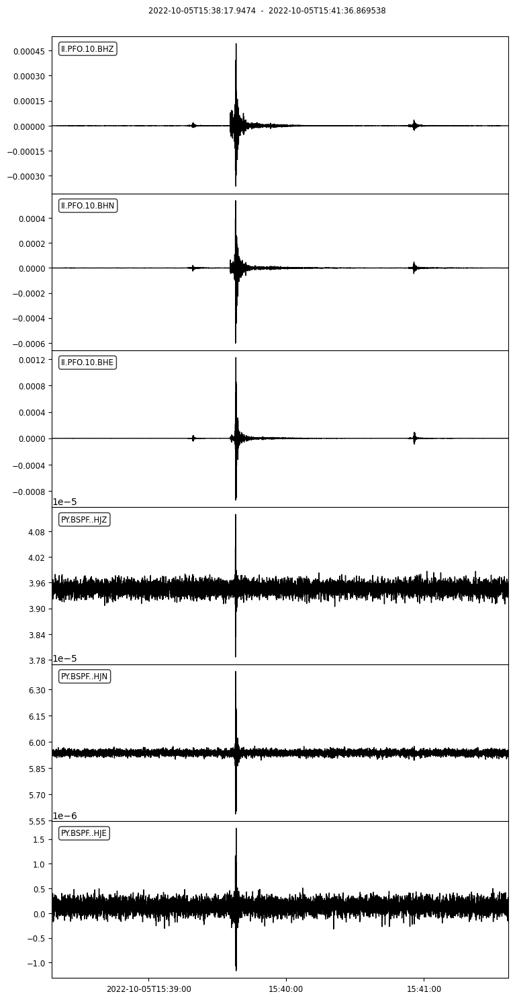


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221005T153917_raw.png ...

   -> Done

 -> 4 2022-10-07T22:45:15.894539Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-07T22:44:15.897300Z - 2022-10-07T22:47:25.972300Z | 40.0 Hz, 7604 samples
PY.BSPF..HJN | 2022-10-07T22:44:15.897300Z - 2022-10-07T22:47:25.972300Z | 40.0 Hz, 7604 samples
PY.BSPF..HJZ | 2022-10-07T22:44:15.897300Z - 2022-10-07T22:47:25.972300Z | 40.0 Hz, 7604 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-07T22:44:15.897300Z - 2022-10-07T22:47:25.972300Z | 40.0 Hz, 7604 samples
PY.BSPF..HJN  | 2022-10-07T22:44:15.897300Z - 2022-10-07T22:47:25.972300Z | 40.0 Hz, 7604 samples
PY.BSPF..HJZ  | 2022-10-07T22:44:15.897300Z - 2022-10-07T22:47:25.972300Z | 40.0 Hz, 7604 samples
II.PFO.10.BHN | 2022-10-07T22:44:15.894539Z - 2022-10-07T22:47:25.994539Z | 40.0 Hz, 7605 samples
II.PFO.10.BHE | 2022-10-07T22:44:15.894539Z - 2022-10-07T22:47:25.994539Z | 40.0 Hz, 7605 samples
II.PFO.10.BHZ | 2022-10-07T22:44:15.894539Z - 2022-10-07T22:47:25.994539Z | 40.0 Hz, 7605 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-07T22:44:15.897300Z - 2022-10-07T22:47:25.972300Z | 40.0 Hz, 7604 samples
PY.BSPF..HJN  | 2022-10-07T22:44:15.897300Z - 2022-10-07T22:47:25.972300Z | 40.0 Hz, 7604 samples
PY.BSPF..HJZ  | 2022-10-07T22:44:15.897300Z - 2022-10-07T22:47:25.972300Z | 40.0 Hz, 7604 samples
II.PFO.10.BHN | 2022-10-07T22:44:15.894539Z - 2022-10-07T22:47:25.994539Z | 40.0 Hz, 7605 samples
II.PFO.10.BHE | 2022-10-07T22:44:15.894539Z - 2022-10-07T22:47:25.994539Z | 40.0 Hz, 7605 samples
II.PFO.10.BHZ | 2022-10-07T22:44:15.894539Z - 2022-10-07T22:47:25.994539Z | 40.0 Hz, 7605 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-07T22:44:15.897300Z - 2022-10-07T22:47:25.972300Z | 40.0 Hz, 7604 samples
PY.BSPF..HJN  | 2022-10-07T22:44:15.897300Z - 2022-10-07T22:47:25.972300Z | 40.0 Hz, 7604 samples
PY.BSPF..HJZ  | 2022-10-07T22:44:15.897300Z - 2022-10-07T22:47:25.972300Z | 40.0 Hz, 7604 samples
II.PFO.10.BHN | 2022-10-07T22:44:15.894539Z - 2022-10-07T22:47:25.994539Z | 40.0 Hz, 7605 samples
II.PFO.10.BHE | 2022-10-07T22:44:15.894539Z - 2022-10-07T22:47:25.994539Z | 40.0 Hz, 7605 samples
II.PFO.10.BHZ | 2022-10-07T22:44:15.894539Z - 2022-10-07T22:47:25.994539Z | 40.0 Hz, 7605 samples

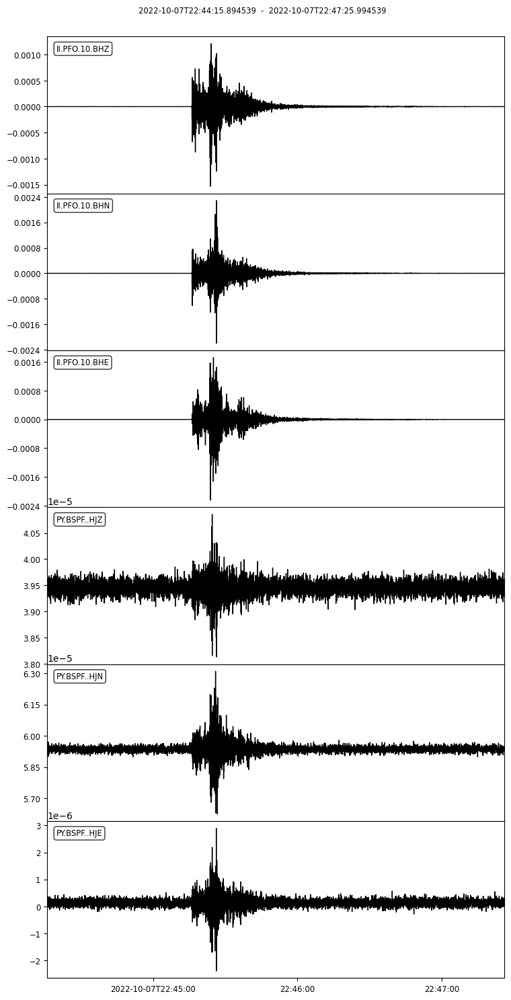


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221007T224515_raw.png ...

   -> Done

 -> 5 2022-10-08T02:52:36.369539Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-08T02:51:36.372300Z - 2022-10-08T02:54:37.672300Z | 40.0 Hz, 7253 samples
PY.BSPF..HJN | 2022-10-08T02:51:36.372300Z - 2022-10-08T02:54:37.672300Z | 40.0 Hz, 7253 samples
PY.BSPF..HJZ | 2022-10-08T02:51:36.372300Z - 2022-10-08T02:54:37.672300Z | 40.0 Hz, 7253 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-08T02:51:36.372300Z - 2022-10-08T02:54:37.672300Z | 40.0 Hz, 7253 samples
PY.BSPF..HJN  | 2022-10-08T02:51:36.372300Z - 2022-10-08T02:54:37.672300Z | 40.0 Hz, 7253 samples
PY.BSPF..HJZ  | 2022-10-08T02:51:36.372300Z - 2022-10-08T02:54:37.672300Z | 40.0 Hz, 7253 samples
II.PFO.10.BHN | 2022-10-08T02:51:36.369539Z - 2022-10-08T02:54:37.694539Z | 40.0 Hz, 7254 samples
II.PFO.10.BHE | 2022-10-08T02:51:36.369539Z - 2022-10-08T02:54:37.694539Z | 40.0 Hz, 7254 samples
II.PFO.10.BHZ | 2022-10-08T02:51:36.369539Z - 2022-10-08T02:54:37.694539Z | 40.0 Hz, 7254 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-08T02:51:36.372300Z - 2022-10-08T02:54:37.672300Z | 40.0 Hz, 7253 samples
PY.BSPF..HJN  | 2022-10-08T02:51:36.372300Z - 2022-10-08T02:54:37.672300Z | 40.0 Hz, 7253 samples
PY.BSPF..HJZ  | 2022-10-08T02:51:36.372300Z - 2022-10-08T02:54:37.672300Z | 40.0 Hz, 7253 samples
II.PFO.10.BHN | 2022-10-08T02:51:36.369539Z - 2022-10-08T02:54:37.694539Z | 40.0 Hz, 7254 samples
II.PFO.10.BHE | 2022-10-08T02:51:36.369539Z - 2022-10-08T02:54:37.694539Z | 40.0 Hz, 7254 samples
II.PFO.10.BHZ | 2022-10-08T02:51:36.369539Z - 2022-10-08T02:54:37.694539Z | 40.0 Hz, 7254 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-08T02:51:36.372300Z - 2022-10-08T02:54:37.672300Z | 40.0 Hz, 7253 samples
PY.BSPF..HJN  | 2022-10-08T02:51:36.372300Z - 2022-10-08T02:54:37.672300Z | 40.0 Hz, 7253 samples
PY.BSPF..HJZ  | 2022-10-08T02:51:36.372300Z - 2022-10-08T02:54:37.672300Z | 40.0 Hz, 7253 samples
II.PFO.10.BHN | 2022-10-08T02:51:36.369539Z - 2022-10-08T02:54:37.694539Z | 40.0 Hz, 7254 samples
II.PFO.10.BHE | 2022-10-08T02:51:36.369539Z - 2022-10-08T02:54:37.694539Z | 40.0 Hz, 7254 samples
II.PFO.10.BHZ | 2022-10-08T02:51:36.369539Z - 2022-10-08T02:54:37.694539Z | 40.0 Hz, 7254 samples

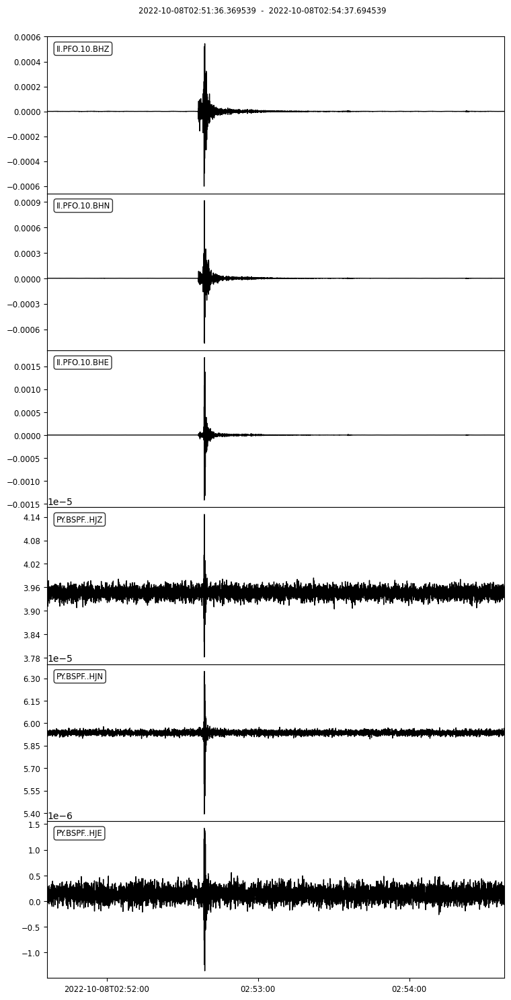


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221008T025236_raw.png ...

   -> Done

 -> 6 2022-10-15T05:17:36.519538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-15T05:16:36.524100Z - 2022-10-15T05:19:38.624100Z | 40.0 Hz, 7285 samples
PY.BSPF..HJN | 2022-10-15T05:16:36.524100Z - 2022-10-15T05:19:38.624100Z | 40.0 Hz, 7285 samples
PY.BSPF..HJZ | 2022-10-15T05:16:36.524100Z - 2022-10-15T05:19:38.624100Z | 40.0 Hz, 7285 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-15T05:16:36.524100Z - 2022-10-15T05:19:38.624100Z | 40.0 Hz, 7285 samples
PY.BSPF..HJN  | 2022-10-15T05:16:36.524100Z - 2022-10-15T05:19:38.624100Z | 40.0 Hz, 7285 samples
PY.BSPF..HJZ  | 2022-10-15T05:16:36.524100Z - 2022-10-15T05:19:38.624100Z | 40.0 Hz, 7285 samples
II.PFO.10.BHN | 2022-10-15T05:16:36.519538Z - 2022-10-15T05:19:38.644538Z | 40.0 Hz, 7286 samples
II.PFO.10.BHE | 2022-10-15T05:16:36.519538Z - 2022-10-15T05:19:38.644538Z | 40.0 Hz, 7286 samples
II.PFO.10.BHZ | 2022-10-15T05:16:36.519538Z - 2022-10-15T05:19:38.644538Z | 40.0 Hz, 7286 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-15T05:16:36.524100Z - 2022-10-15T05:19:38.624100Z | 40.0 Hz, 7285 samples
PY.BSPF..HJN  | 2022-10-15T05:16:36.524100Z - 2022-10-15T05:19:38.624100Z | 40.0 Hz, 7285 samples
PY.BSPF..HJZ  | 2022-10-15T05:16:36.524100Z - 2022-10-15T05:19:38.624100Z | 40.0 Hz, 7285 samples
II.PFO.10.BHN | 2022-10-15T05:16:36.519538Z - 2022-10-15T05:19:38.644538Z | 40.0 Hz, 7286 samples
II.PFO.10.BHE | 2022-10-15T05:16:36.519538Z - 2022-10-15T05:19:38.644538Z | 40.0 Hz, 7286 samples
II.PFO.10.BHZ | 2022-10-15T05:16:36.519538Z - 2022-10-15T05:19:38.644538Z | 40.0 Hz, 7286 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-15T05:16:36.524100Z - 2022-10-15T05:19:38.624100Z | 40.0 Hz, 7285 samples
PY.BSPF..HJN  | 2022-10-15T05:16:36.524100Z - 2022-10-15T05:19:38.624100Z | 40.0 Hz, 7285 samples
PY.BSPF..HJZ  | 2022-10-15T05:16:36.524100Z - 2022-10-15T05:19:38.624100Z | 40.0 Hz, 7285 samples
II.PFO.10.BHN | 2022-10-15T05:16:36.519538Z - 2022-10-15T05:19:38.644538Z | 40.0 Hz, 7286 samples
II.PFO.10.BHE | 2022-10-15T05:16:36.519538Z - 2022-10-15T05:19:38.644538Z | 40.0 Hz, 7286 samples
II.PFO.10.BHZ | 2022-10-15T05:16:36.519538Z - 2022-10-15T05:19:38.644538Z | 40.0 Hz, 7286 samples

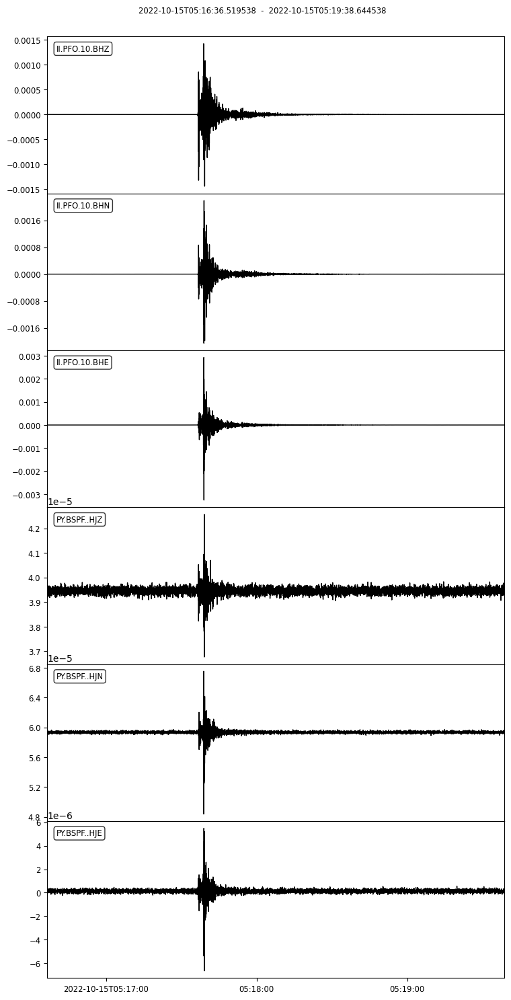


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221015T051736_raw.png ...

   -> Done

 -> 7 2022-10-17T05:25:36.319539Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-17T05:24:36.323700Z - 2022-10-17T05:27:42.598700Z | 40.0 Hz, 7452 samples
PY.BSPF..HJN | 2022-10-17T05:24:36.323700Z - 2022-10-17T05:27:42.598700Z | 40.0 Hz, 7452 samples
PY.BSPF..HJZ | 2022-10-17T05:24:36.323700Z - 2022-10-17T05:27:42.598700Z | 40.0 Hz, 7452 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-17T05:24:36.323700Z - 2022-10-17T05:27:42.598700Z | 40.0 Hz, 7452 samples
PY.BSPF..HJN  | 2022-10-17T05:24:36.323700Z - 2022-10-17T05:27:42.598700Z | 40.0 Hz, 7452 samples
PY.BSPF..HJZ  | 2022-10-17T05:24:36.323700Z - 2022-10-17T05:27:42.598700Z | 40.0 Hz, 7452 samples
II.PFO.10.BHN | 2022-10-17T05:24:36.319539Z - 2022-10-17T05:27:42.619539Z | 40.0 Hz, 7453 samples
II.PFO.10.BHE | 2022-10-17T05:24:36.319539Z - 2022-10-17T05:27:42.619539Z | 40.0 Hz, 7453 samples
II.PFO.10.BHZ | 2022-10-17T05:24:36.319539Z - 2022-10-17T05:27:42.619539Z | 40.0 Hz, 7453 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-17T05:24:36.323700Z - 2022-10-17T05:27:42.598700Z | 40.0 Hz, 7452 samples
PY.BSPF..HJN  | 2022-10-17T05:24:36.323700Z - 2022-10-17T05:27:42.598700Z | 40.0 Hz, 7452 samples
PY.BSPF..HJZ  | 2022-10-17T05:24:36.323700Z - 2022-10-17T05:27:42.598700Z | 40.0 Hz, 7452 samples
II.PFO.10.BHN | 2022-10-17T05:24:36.319539Z - 2022-10-17T05:27:42.619539Z | 40.0 Hz, 7453 samples
II.PFO.10.BHE | 2022-10-17T05:24:36.319539Z - 2022-10-17T05:27:42.619539Z | 40.0 Hz, 7453 samples
II.PFO.10.BHZ | 2022-10-17T05:24:36.319539Z - 2022-10-17T05:27:42.619539Z | 40.0 Hz, 7453 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-17T05:24:36.323700Z - 2022-10-17T05:27:42.598700Z | 40.0 Hz, 7452 samples
PY.BSPF..HJN  | 2022-10-17T05:24:36.323700Z - 2022-10-17T05:27:42.598700Z | 40.0 Hz, 7452 samples
PY.BSPF..HJZ  | 2022-10-17T05:24:36.323700Z - 2022-10-17T05:27:42.598700Z | 40.0 Hz, 7452 samples
II.PFO.10.BHN | 2022-10-17T05:24:36.319539Z - 2022-10-17T05:27:42.619539Z | 40.0 Hz, 7453 samples
II.PFO.10.BHE | 2022-10-17T05:24:36.319539Z - 2022-10-17T05:27:42.619539Z | 40.0 Hz, 7453 samples
II.PFO.10.BHZ | 2022-10-17T05:24:36.319539Z - 2022-10-17T05:27:42.619539Z | 40.0 Hz, 7453 samples

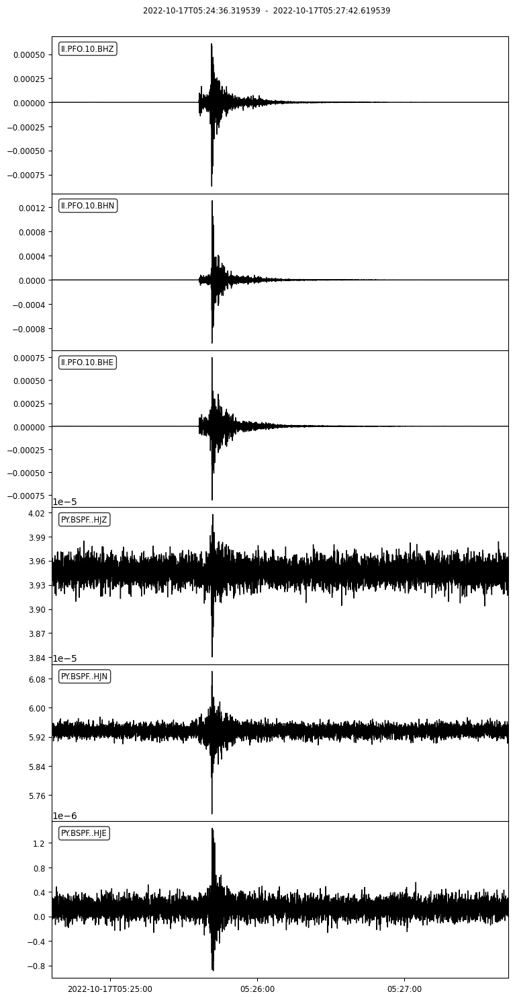


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221017T052536_raw.png ...

   -> Done

 -> 8 2022-10-23T09:24:59.844538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-23T09:23:59.848700Z - 2022-10-23T09:27:02.823700Z | 40.0 Hz, 7320 samples
PY.BSPF..HJN | 2022-10-23T09:23:59.848700Z - 2022-10-23T09:27:02.823700Z | 40.0 Hz, 7320 samples
PY.BSPF..HJZ | 2022-10-23T09:23:59.848700Z - 2022-10-23T09:27:02.823700Z | 40.0 Hz, 7320 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-23T09:23:59.848700Z - 2022-10-23T09:27:02.823700Z | 40.0 Hz, 7320 samples
PY.BSPF..HJN  | 2022-10-23T09:23:59.848700Z - 2022-10-23T09:27:02.823700Z | 40.0 Hz, 7320 samples
PY.BSPF..HJZ  | 2022-10-23T09:23:59.848700Z - 2022-10-23T09:27:02.823700Z | 40.0 Hz, 7320 samples
II.PFO.10.BHN | 2022-10-23T09:23:59.844538Z - 2022-10-23T09:27:02.844538Z | 40.0 Hz, 7321 samples
II.PFO.10.BHE | 2022-10-23T09:23:59.844538Z - 2022-10-23T09:27:02.844538Z | 40.0 Hz, 7321 samples
II.PFO.10.BHZ | 2022-10-23T09:23:59.844538Z - 2022-10-23T09:27:02.844538Z | 40.0 Hz, 7321 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-23T09:23:59.848700Z - 2022-10-23T09:27:02.823700Z | 40.0 Hz, 7320 samples
PY.BSPF..HJN  | 2022-10-23T09:23:59.848700Z - 2022-10-23T09:27:02.823700Z | 40.0 Hz, 7320 samples
PY.BSPF..HJZ  | 2022-10-23T09:23:59.848700Z - 2022-10-23T09:27:02.823700Z | 40.0 Hz, 7320 samples
II.PFO.10.BHN | 2022-10-23T09:23:59.844538Z - 2022-10-23T09:27:02.844538Z | 40.0 Hz, 7321 samples
II.PFO.10.BHE | 2022-10-23T09:23:59.844538Z - 2022-10-23T09:27:02.844538Z | 40.0 Hz, 7321 samples
II.PFO.10.BHZ | 2022-10-23T09:23:59.844538Z - 2022-10-23T09:27:02.844538Z | 40.0 Hz, 7321 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-23T09:23:59.848700Z - 2022-10-23T09:27:02.823700Z | 40.0 Hz, 7320 samples
PY.BSPF..HJN  | 2022-10-23T09:23:59.848700Z - 2022-10-23T09:27:02.823700Z | 40.0 Hz, 7320 samples
PY.BSPF..HJZ  | 2022-10-23T09:23:59.848700Z - 2022-10-23T09:27:02.823700Z | 40.0 Hz, 7320 samples
II.PFO.10.BHN | 2022-10-23T09:23:59.844538Z - 2022-10-23T09:27:02.844538Z | 40.0 Hz, 7321 samples
II.PFO.10.BHE | 2022-10-23T09:23:59.844538Z - 2022-10-23T09:27:02.844538Z | 40.0 Hz, 7321 samples
II.PFO.10.BHZ | 2022-10-23T09:23:59.844538Z - 2022-10-23T09:27:02.844538Z | 40.0 Hz, 7321 samples

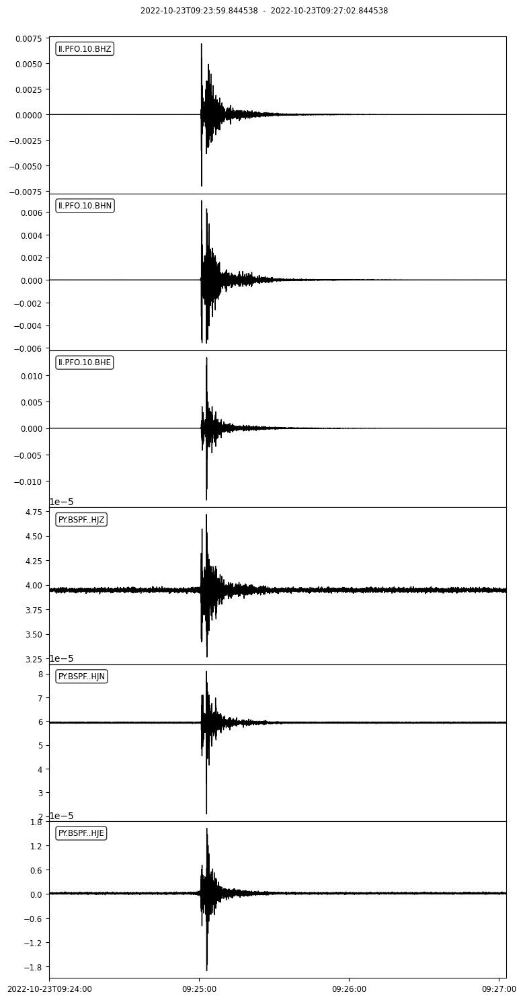


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221023T092459_raw.png ...

   -> Done

 -> 9 2022-10-25T03:55:36.344538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-25T03:54:36.348700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7359 samples
PY.BSPF..HJN | 2022-10-25T03:54:36.348700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7359 samples
PY.BSPF..HJZ | 2022-10-25T03:54:36.348700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7359 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-25T03:54:36.348700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7359 samples
PY.BSPF..HJN  | 2022-10-25T03:54:36.348700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7359 samples
PY.BSPF..HJZ  | 2022-10-25T03:54:36.348700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7359 samples
II.PFO.10.BHN | 2022-10-25T03:54:36.344538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7360 samples
II.PFO.10.BHE | 2022-10-25T03:54:36.344538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7360 samples
II.PFO.10.BHZ | 2022-10-25T03:54:36.344538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7360 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-25T03:54:36.348700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7359 samples
PY.BSPF..HJN  | 2022-10-25T03:54:36.348700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7359 samples
PY.BSPF..HJZ  | 2022-10-25T03:54:36.348700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7359 samples
II.PFO.10.BHN | 2022-10-25T03:54:36.344538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7360 samples
II.PFO.10.BHE | 2022-10-25T03:54:36.344538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7360 samples
II.PFO.10.BHZ | 2022-10-25T03:54:36.344538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7360 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-25T03:54:36.348700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7359 samples
PY.BSPF..HJN  | 2022-10-25T03:54:36.348700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7359 samples
PY.BSPF..HJZ  | 2022-10-25T03:54:36.348700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7359 samples
II.PFO.10.BHN | 2022-10-25T03:54:36.344538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7360 samples
II.PFO.10.BHE | 2022-10-25T03:54:36.344538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7360 samples
II.PFO.10.BHZ | 2022-10-25T03:54:36.344538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7360 samples

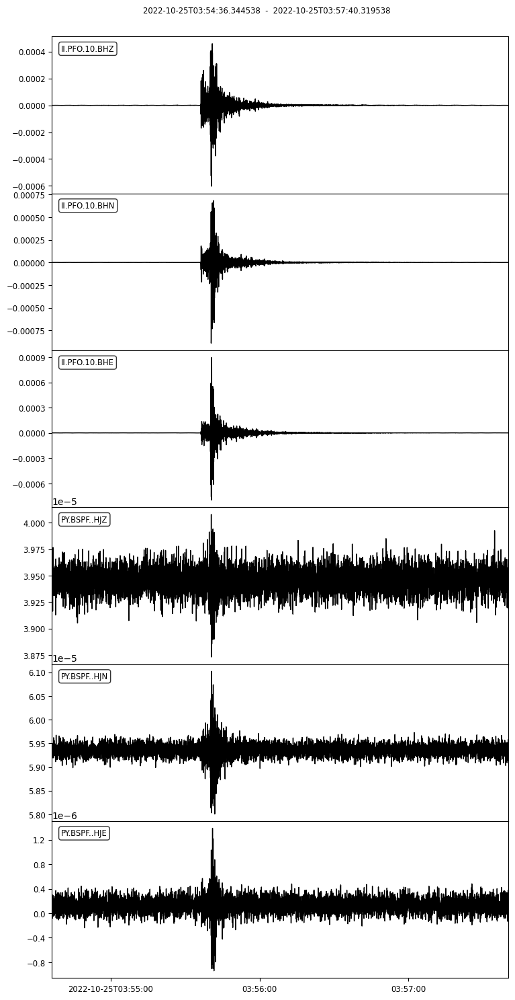


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221025T035536_raw.png ...

   -> Done

 -> 10 2022-10-25T03:55:40.019538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-25T03:54:40.023700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7212 samples
PY.BSPF..HJN | 2022-10-25T03:54:40.023700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7212 samples
PY.BSPF..HJZ | 2022-10-25T03:54:40.023700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7212 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-25T03:54:40.023700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7212 samples
PY.BSPF..HJN  | 2022-10-25T03:54:40.023700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7212 samples
PY.BSPF..HJZ  | 2022-10-25T03:54:40.023700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7212 samples
II.PFO.10.BHN | 2022-10-25T03:54:40.019538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7213 samples
II.PFO.10.BHE | 2022-10-25T03:54:40.019538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7213 samples
II.PFO.10.BHZ | 2022-10-25T03:54:40.019538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7213 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-25T03:54:40.023700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7212 samples
PY.BSPF..HJN  | 2022-10-25T03:54:40.023700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7212 samples
PY.BSPF..HJZ  | 2022-10-25T03:54:40.023700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7212 samples
II.PFO.10.BHN | 2022-10-25T03:54:40.019538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7213 samples
II.PFO.10.BHE | 2022-10-25T03:54:40.019538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7213 samples
II.PFO.10.BHZ | 2022-10-25T03:54:40.019538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7213 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-25T03:54:40.023700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7212 samples
PY.BSPF..HJN  | 2022-10-25T03:54:40.023700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7212 samples
PY.BSPF..HJZ  | 2022-10-25T03:54:40.023700Z - 2022-10-25T03:57:40.298700Z | 40.0 Hz, 7212 samples
II.PFO.10.BHN | 2022-10-25T03:54:40.019538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7213 samples
II.PFO.10.BHE | 2022-10-25T03:54:40.019538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7213 samples
II.PFO.10.BHZ | 2022-10-25T03:54:40.019538Z - 2022-10-25T03:57:40.319538Z | 40.0 Hz, 7213 samples

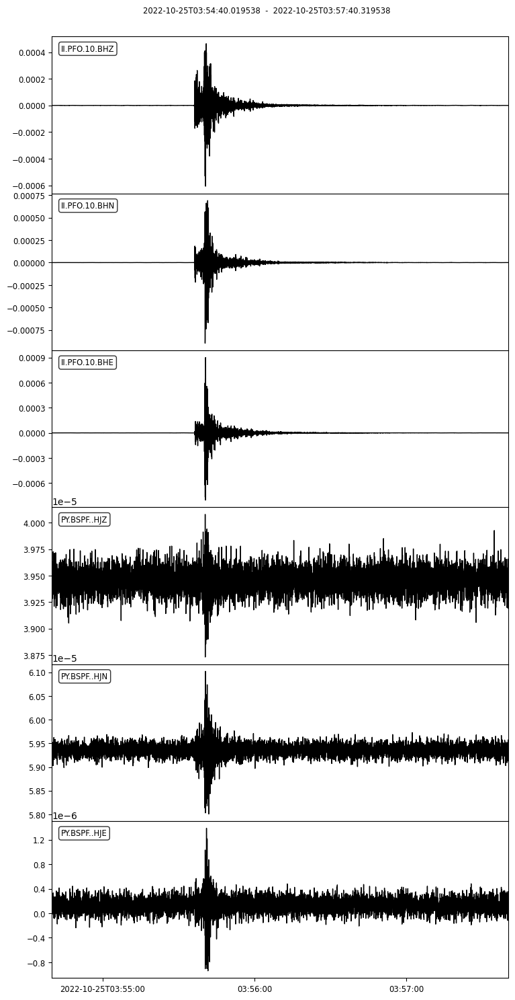


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221025T035540_raw.png ...

   -> Done

 -> 11 2022-10-25T12:29:49.444538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-25T12:28:49.448700Z - 2022-10-25T12:31:55.048700Z | 40.0 Hz, 7425 samples
PY.BSPF..HJN | 2022-10-25T12:28:49.448700Z - 2022-10-25T12:31:55.048700Z | 40.0 Hz, 7425 samples
PY.BSPF..HJZ | 2022-10-25T12:28:49.448700Z - 2022-10-25T12:31:55.048700Z | 40.0 Hz, 7425 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-25T12:28:49.448700Z - 2022-10-25T12:31:55.048700Z | 40.0 Hz, 7425 samples
PY.BSPF..HJN  | 2022-10-25T12:28:49.448700Z - 2022-10-25T12:31:55.048700Z | 40.0 Hz, 7425 samples
PY.BSPF..HJZ  | 2022-10-25T12:28:49.448700Z - 2022-10-25T12:31:55.048700Z | 40.0 Hz, 7425 samples
II.PFO.10.BHN | 2022-10-25T12:28:49.444538Z - 2022-10-25T12:31:55.069538Z | 40.0 Hz, 7426 samples
II.PFO.10.BHE | 2022-10-25T12:28:49.444538Z - 2022-10-25T12:31:55.069538Z | 40.0 Hz, 7426 samples
II.PFO.10.BHZ | 2022-10-25T12:28:49.444538Z - 2022-10-25T12:31:55.069538Z | 40.0 Hz, 7426 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-25T12:28:49.448700Z - 2022-10-25T12:31:55.048700Z | 40.0 Hz, 7425 samples
PY.BSPF..HJN  | 2022-10-25T12:28:49.448700Z - 2022-10-25T12:31:55.048700Z | 40.0 Hz, 7425 samples
PY.BSPF..HJZ  | 2022-10-25T12:28:49.448700Z - 2022-10-25T12:31:55.048700Z | 40.0 Hz, 7425 samples
II.PFO.10.BHN | 2022-10-25T12:28:49.444538Z - 2022-10-25T12:31:55.069538Z | 40.0 Hz, 7426 samples
II.PFO.10.BHE | 2022-10-25T12:28:49.444538Z - 2022-10-25T12:31:55.069538Z | 40.0 Hz, 7426 samples
II.PFO.10.BHZ | 2022-10-25T12:28:49.444538Z - 2022-10-25T12:31:55.069538Z | 40.0 Hz, 7426 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-25T12:28:49.448700Z - 2022-10-25T12:31:55.048700Z | 40.0 Hz, 7425 samples
PY.BSPF..HJN  | 2022-10-25T12:28:49.448700Z - 2022-10-25T12:31:55.048700Z | 40.0 Hz, 7425 samples
PY.BSPF..HJZ  | 2022-10-25T12:28:49.448700Z - 2022-10-25T12:31:55.048700Z | 40.0 Hz, 7425 samples
II.PFO.10.BHN | 2022-10-25T12:28:49.444538Z - 2022-10-25T12:31:55.069538Z | 40.0 Hz, 7426 samples
II.PFO.10.BHE | 2022-10-25T12:28:49.444538Z - 2022-10-25T12:31:55.069538Z | 40.0 Hz, 7426 samples
II.PFO.10.BHZ | 2022-10-25T12:28:49.444538Z - 2022-10-25T12:31:55.069538Z | 40.0 Hz, 7426 samples

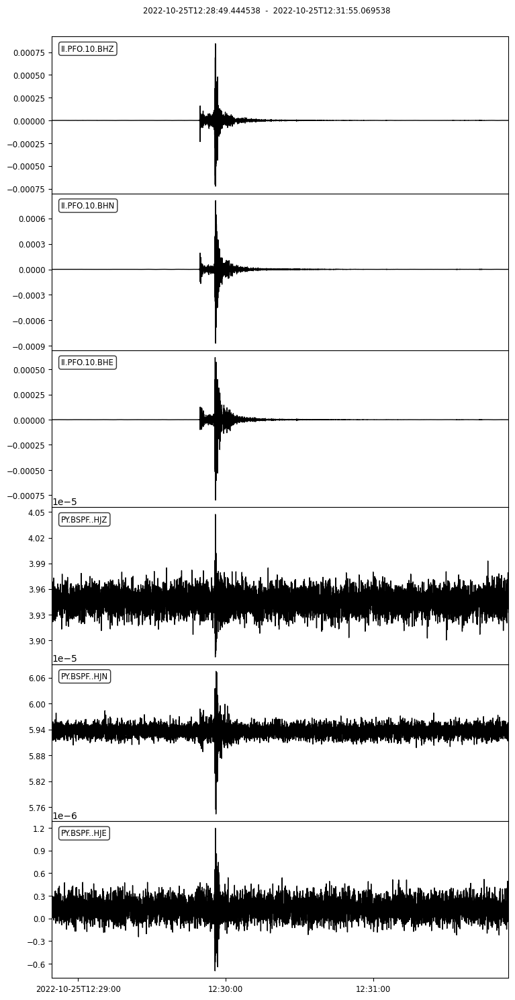


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221025T122949_raw.png ...

   -> Done

 -> 12 2022-10-26T02:15:00.794538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-26T02:14:00.798700Z - 2022-10-26T02:17:02.548700Z | 40.0 Hz, 7271 samples
PY.BSPF..HJN | 2022-10-26T02:14:00.798700Z - 2022-10-26T02:17:02.548700Z | 40.0 Hz, 7271 samples
PY.BSPF..HJZ | 2022-10-26T02:14:00.798700Z - 2022-10-26T02:17:02.548700Z | 40.0 Hz, 7271 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-26T02:14:00.798700Z - 2022-10-26T02:17:02.548700Z | 40.0 Hz, 7271 samples
PY.BSPF..HJN  | 2022-10-26T02:14:00.798700Z - 2022-10-26T02:17:02.548700Z | 40.0 Hz, 7271 samples
PY.BSPF..HJZ  | 2022-10-26T02:14:00.798700Z - 2022-10-26T02:17:02.548700Z | 40.0 Hz, 7271 samples
II.PFO.10.BHN | 2022-10-26T02:14:00.794538Z - 2022-10-26T02:17:02.569538Z | 40.0 Hz, 7272 samples
II.PFO.10.BHE | 2022-10-26T02:14:00.794538Z - 2022-10-26T02:17:02.569538Z | 40.0 Hz, 7272 samples
II.PFO.10.BHZ | 2022-10-26T02:14:00.794538Z - 2022-10-26T02:17:02.569538Z | 40.0 Hz, 7272 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-26T02:14:00.798700Z - 2022-10-26T02:17:02.548700Z | 40.0 Hz, 7271 samples
PY.BSPF..HJN  | 2022-10-26T02:14:00.798700Z - 2022-10-26T02:17:02.548700Z | 40.0 Hz, 7271 samples
PY.BSPF..HJZ  | 2022-10-26T02:14:00.798700Z - 2022-10-26T02:17:02.548700Z | 40.0 Hz, 7271 samples
II.PFO.10.BHN | 2022-10-26T02:14:00.794538Z - 2022-10-26T02:17:02.569538Z | 40.0 Hz, 7272 samples
II.PFO.10.BHE | 2022-10-26T02:14:00.794538Z - 2022-10-26T02:17:02.569538Z | 40.0 Hz, 7272 samples
II.PFO.10.BHZ | 2022-10-26T02:14:00.794538Z - 2022-10-26T02:17:02.569538Z | 40.0 Hz, 7272 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-26T02:14:00.798700Z - 2022-10-26T02:17:02.548700Z | 40.0 Hz, 7271 samples
PY.BSPF..HJN  | 2022-10-26T02:14:00.798700Z - 2022-10-26T02:17:02.548700Z | 40.0 Hz, 7271 samples
PY.BSPF..HJZ  | 2022-10-26T02:14:00.798700Z - 2022-10-26T02:17:02.548700Z | 40.0 Hz, 7271 samples
II.PFO.10.BHN | 2022-10-26T02:14:00.794538Z - 2022-10-26T02:17:02.569538Z | 40.0 Hz, 7272 samples
II.PFO.10.BHE | 2022-10-26T02:14:00.794538Z - 2022-10-26T02:17:02.569538Z | 40.0 Hz, 7272 samples
II.PFO.10.BHZ | 2022-10-26T02:14:00.794538Z - 2022-10-26T02:17:02.569538Z | 40.0 Hz, 7272 samples

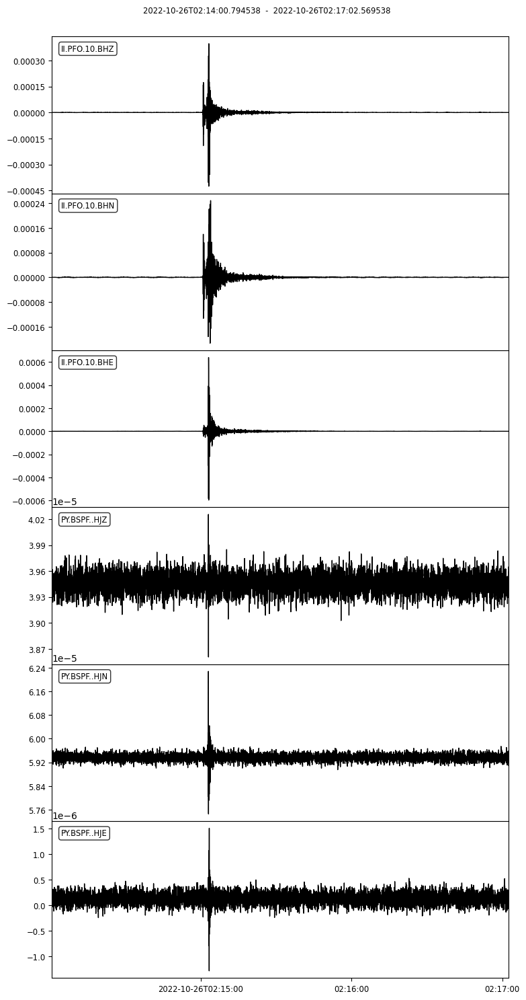


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221026T021500_raw.png ...

   -> Done

 -> 13 2022-10-26T08:14:20.144538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-10-26T08:13:20.145500Z - 2022-10-26T08:16:49.245500Z | 40.0 Hz, 8365 samples
PY.BSPF..HJN | 2022-10-26T08:13:20.145500Z - 2022-10-26T08:16:49.245500Z | 40.0 Hz, 8365 samples
PY.BSPF..HJZ | 2022-10-26T08:13:20.145500Z - 2022-10-26T08:16:49.245500Z | 40.0 Hz, 8365 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-26T08:13:20.145500Z - 2022-10-26T08:16:49.245500Z | 40.0 Hz, 8365 samples
PY.BSPF..HJN  | 2022-10-26T08:13:20.145500Z - 2022-10-26T08:16:49.245500Z | 40.0 Hz, 8365 samples
PY.BSPF..HJZ  | 2022-10-26T08:13:20.145500Z - 2022-10-26T08:16:49.245500Z | 40.0 Hz, 8365 samples
II.PFO.10.BHN | 2022-10-26T08:13:20.144538Z - 2022-10-26T08:16:49.269538Z | 40.0 Hz, 8366 samples
II.PFO.10.BHE | 2022-10-26T08:13:20.144538Z - 2022-10-26T08:16:49.269538Z | 40.0 Hz, 8366 samples
II.PFO.10.BHZ | 2022-10-26T08:13:20.144538Z - 2022-10-26T08:16:49.269538Z | 40.0 Hz, 8366 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-26T08:13:20.145500Z - 2022-10-26T08:16:49.245500Z | 40.0 Hz, 8365 samples
PY.BSPF..HJN  | 2022-10-26T08:13:20.145500Z - 2022-10-26T08:16:49.245500Z | 40.0 Hz, 8365 samples
PY.BSPF..HJZ  | 2022-10-26T08:13:20.145500Z - 2022-10-26T08:16:49.245500Z | 40.0 Hz, 8365 samples
II.PFO.10.BHN | 2022-10-26T08:13:20.144538Z - 2022-10-26T08:16:49.269538Z | 40.0 Hz, 8366 samples
II.PFO.10.BHE | 2022-10-26T08:13:20.144538Z - 2022-10-26T08:16:49.269538Z | 40.0 Hz, 8366 samples
II.PFO.10.BHZ | 2022-10-26T08:13:20.144538Z - 2022-10-26T08:16:49.269538Z | 40.0 Hz, 8366 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-26T08:13:20.145500Z - 2022-10-26T08:16:49.245500Z | 40.0 Hz, 8365 samples
PY.BSPF..HJN  | 2022-10-26T08:13:20.145500Z - 2022-10-26T08:16:49.245500Z | 40.0 Hz, 8365 samples
PY.BSPF..HJZ  | 2022-10-26T08:13:20.145500Z - 2022-10-26T08:16:49.245500Z | 40.0 Hz, 8365 samples
II.PFO.10.BHN | 2022-10-26T08:13:20.144538Z - 2022-10-26T08:16:49.269538Z | 40.0 Hz, 8366 samples
II.PFO.10.BHE | 2022-10-26T08:13:20.144538Z - 2022-10-26T08:16:49.269538Z | 40.0 Hz, 8366 samples
II.PFO.10.BHZ | 2022-10-26T08:13:20.144538Z - 2022-10-26T08:16:49.269538Z | 40.0 Hz, 8366 samples

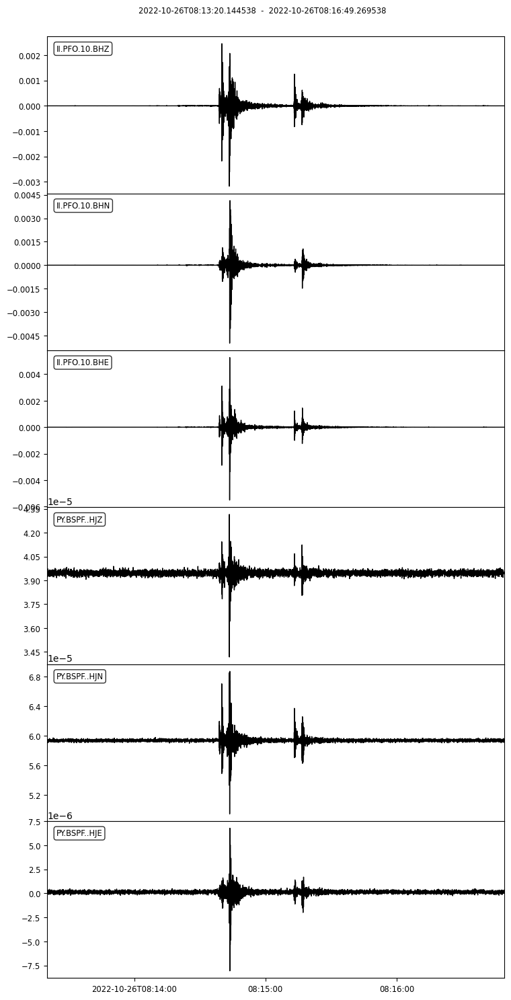


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221026T081420_raw.png ...

   -> Done

 -> 14 2022-11-19T04:15:54.844538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-11-19T04:14:54.846000Z - 2022-11-19T04:18:05.446000Z | 40.0 Hz, 7625 samples
PY.BSPF..HJN | 2022-11-19T04:14:54.846000Z - 2022-11-19T04:18:05.446000Z | 40.0 Hz, 7625 samples
PY.BSPF..HJZ | 2022-11-19T04:14:54.846000Z - 2022-11-19T04:18:05.446000Z | 40.0 Hz, 7625 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-11-19T04:14:54.846000Z - 2022-11-19T04:18:05.446000Z | 40.0 Hz, 7625 samples
PY.BSPF..HJN  | 2022-11-19T04:14:54.846000Z - 2022-11-19T04:18:05.446000Z | 40.0 Hz, 7625 samples
PY.BSPF..HJZ  | 2022-11-19T04:14:54.846000Z - 2022-11-19T04:18:05.446000Z | 40.0 Hz, 7625 samples
II.PFO.10.BHN | 2022-11-19T04:14:54.844538Z - 2022-11-19T04:18:05.469538Z | 40.0 Hz, 7626 samples
II.PFO.10.BHE | 2022-11-19T04:14:54.844538Z - 2022-11-19T04:18:05.469538Z | 40.0 Hz, 7626 samples
II.PFO.10.BHZ | 2022-11-19T04:14:54.844538Z - 2022-11-19T04:18:05.469538Z | 40.0 Hz, 7626 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-11-19T04:14:54.846000Z - 2022-11-19T04:18:05.446000Z | 40.0 Hz, 7625 samples
PY.BSPF..HJN  | 2022-11-19T04:14:54.846000Z - 2022-11-19T04:18:05.446000Z | 40.0 Hz, 7625 samples
PY.BSPF..HJZ  | 2022-11-19T04:14:54.846000Z - 2022-11-19T04:18:05.446000Z | 40.0 Hz, 7625 samples
II.PFO.10.BHN | 2022-11-19T04:14:54.844538Z - 2022-11-19T04:18:05.469538Z | 40.0 Hz, 7626 samples
II.PFO.10.BHE | 2022-11-19T04:14:54.844538Z - 2022-11-19T04:18:05.469538Z | 40.0 Hz, 7626 samples
II.PFO.10.BHZ | 2022-11-19T04:14:54.844538Z - 2022-11-19T04:18:05.469538Z | 40.0 Hz, 7626 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-11-19T04:14:54.846000Z - 2022-11-19T04:18:05.446000Z | 40.0 Hz, 7625 samples
PY.BSPF..HJN  | 2022-11-19T04:14:54.846000Z - 2022-11-19T04:18:05.446000Z | 40.0 Hz, 7625 samples
PY.BSPF..HJZ  | 2022-11-19T04:14:54.846000Z - 2022-11-19T04:18:05.446000Z | 40.0 Hz, 7625 samples
II.PFO.10.BHN | 2022-11-19T04:14:54.844538Z - 2022-11-19T04:18:05.469538Z | 40.0 Hz, 7626 samples
II.PFO.10.BHE | 2022-11-19T04:14:54.844538Z - 2022-11-19T04:18:05.469538Z | 40.0 Hz, 7626 samples
II.PFO.10.BHZ | 2022-11-19T04:14:54.844538Z - 2022-11-19T04:18:05.469538Z | 40.0 Hz, 7626 samples

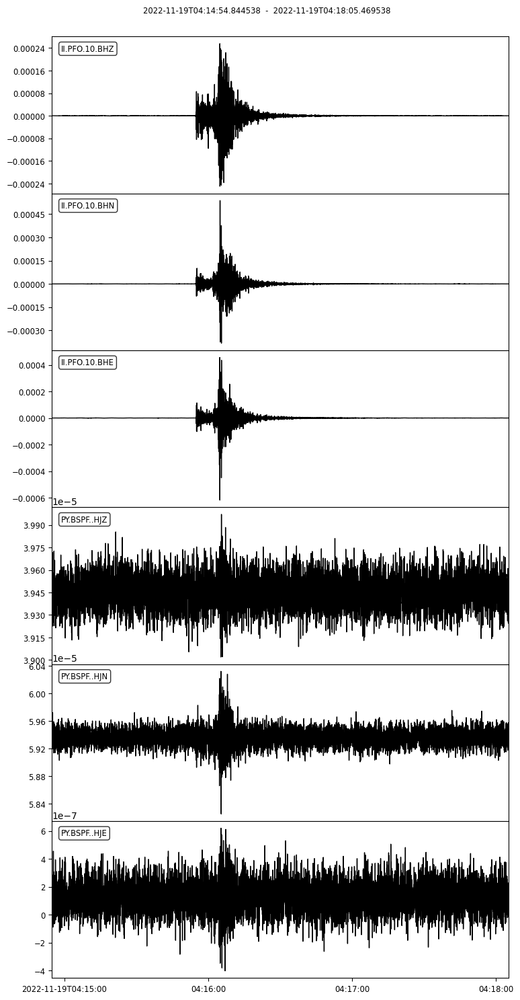


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221119T041554_raw.png ...

   -> Done

 -> 15 2022-12-01T15:28:44.719539Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-12-01T15:27:44.721200Z - 2022-12-01T15:30:58.771200Z | 40.0 Hz, 7763 samples
PY.BSPF..HJN | 2022-12-01T15:27:44.721200Z - 2022-12-01T15:30:58.771200Z | 40.0 Hz, 7763 samples
PY.BSPF..HJZ | 2022-12-01T15:27:44.721200Z - 2022-12-01T15:30:58.771200Z | 40.0 Hz, 7763 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-01T15:27:44.721200Z - 2022-12-01T15:30:58.771200Z | 40.0 Hz, 7763 samples
PY.BSPF..HJN  | 2022-12-01T15:27:44.721200Z - 2022-12-01T15:30:58.771200Z | 40.0 Hz, 7763 samples
PY.BSPF..HJZ  | 2022-12-01T15:27:44.721200Z - 2022-12-01T15:30:58.771200Z | 40.0 Hz, 7763 samples
II.PFO.10.BHN | 2022-12-01T15:27:44.719539Z - 2022-12-01T15:30:58.794539Z | 40.0 Hz, 7764 samples
II.PFO.10.BHE | 2022-12-01T15:27:44.719539Z - 2022-12-01T15:30:58.794539Z | 40.0 Hz, 7764 samples
II.PFO.10.BHZ | 2022-12-01T15:27:44.719539Z - 2022-12-01T15:30:58.794539Z | 40.0 Hz, 7764 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-01T15:27:44.721200Z - 2022-12-01T15:30:58.771200Z | 40.0 Hz, 7763 samples
PY.BSPF..HJN  | 2022-12-01T15:27:44.721200Z - 2022-12-01T15:30:58.771200Z | 40.0 Hz, 7763 samples
PY.BSPF..HJZ  | 2022-12-01T15:27:44.721200Z - 2022-12-01T15:30:58.771200Z | 40.0 Hz, 7763 samples
II.PFO.10.BHN | 2022-12-01T15:27:44.719539Z - 2022-12-01T15:30:58.794539Z | 40.0 Hz, 7764 samples
II.PFO.10.BHE | 2022-12-01T15:27:44.719539Z - 2022-12-01T15:30:58.794539Z | 40.0 Hz, 7764 samples
II.PFO.10.BHZ | 2022-12-01T15:27:44.719539Z - 2022-12-01T15:30:58.794539Z | 40.0 Hz, 7764 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-01T15:27:44.721200Z - 2022-12-01T15:30:58.771200Z | 40.0 Hz, 7763 samples
PY.BSPF..HJN  | 2022-12-01T15:27:44.721200Z - 2022-12-01T15:30:58.771200Z | 40.0 Hz, 7763 samples
PY.BSPF..HJZ  | 2022-12-01T15:27:44.721200Z - 2022-12-01T15:30:58.771200Z | 40.0 Hz, 7763 samples
II.PFO.10.BHN | 2022-12-01T15:27:44.719539Z - 2022-12-01T15:30:58.794539Z | 40.0 Hz, 7764 samples
II.PFO.10.BHE | 2022-12-01T15:27:44.719539Z - 2022-12-01T15:30:58.794539Z | 40.0 Hz, 7764 samples
II.PFO.10.BHZ | 2022-12-01T15:27:44.719539Z - 2022-12-01T15:30:58.794539Z | 40.0 Hz, 7764 samples

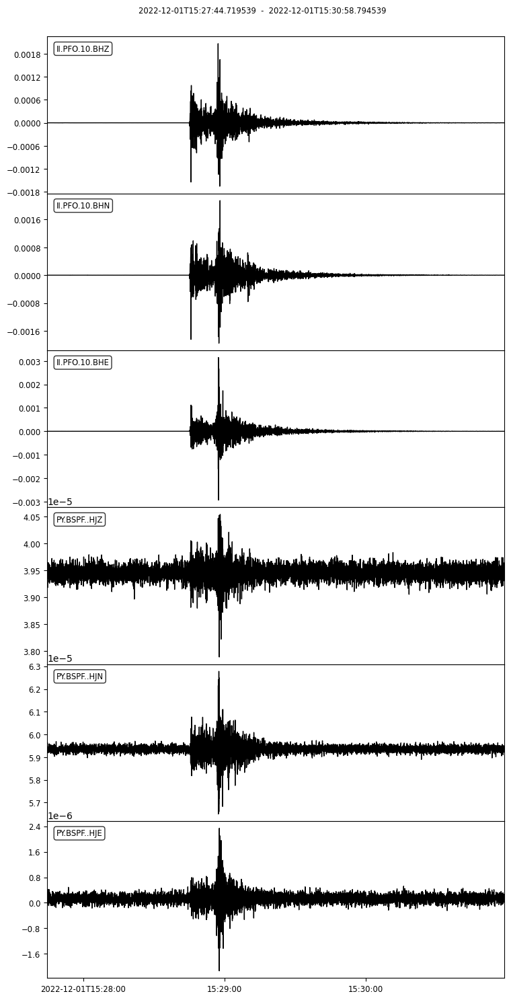


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221201T152844_raw.png ...

   -> Done

 -> 16 2022-12-21T00:46:20.219538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJN | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJZ | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJN  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJZ  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
II.PFO.10.BHN | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHE | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHZ | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJN  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJZ  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
II.PFO.10.BHN | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHE | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHZ | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJN  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJZ  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
II.PFO.10.BHN | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHE | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHZ | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples

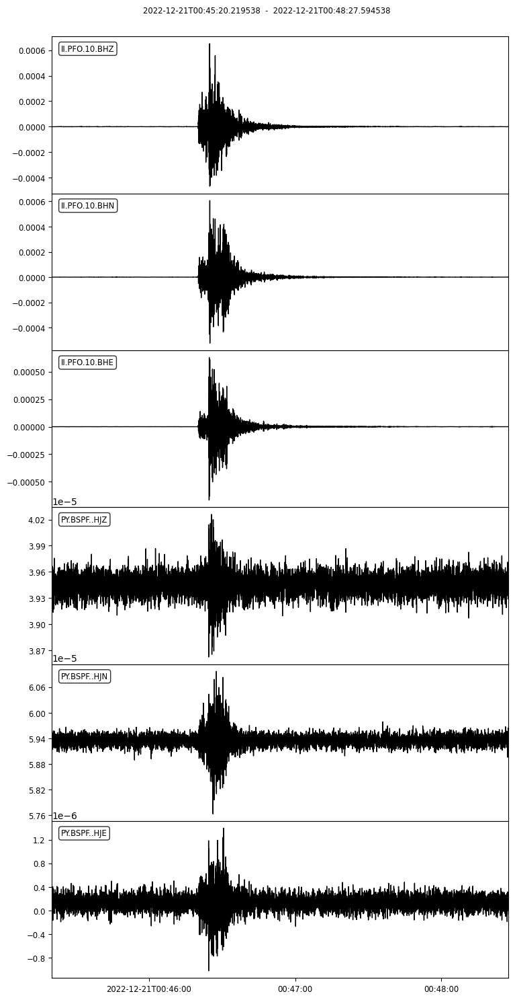


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221221T004620_raw.png ...

   -> Done

 -> 17 2022-12-21T00:46:20.219538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJN | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJZ | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJN  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJZ  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
II.PFO.10.BHN | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHE | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHZ | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJN  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJZ  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
II.PFO.10.BHN | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHE | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHZ | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJN  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJZ  | 2022-12-21T00:45:20.223900Z - 2022-12-21T00:48:27.573900Z | 40.0 Hz, 7495 samples
II.PFO.10.BHN | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHE | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHZ | 2022-12-21T00:45:20.219538Z - 2022-12-21T00:48:27.594538Z | 40.0 Hz, 7496 samples

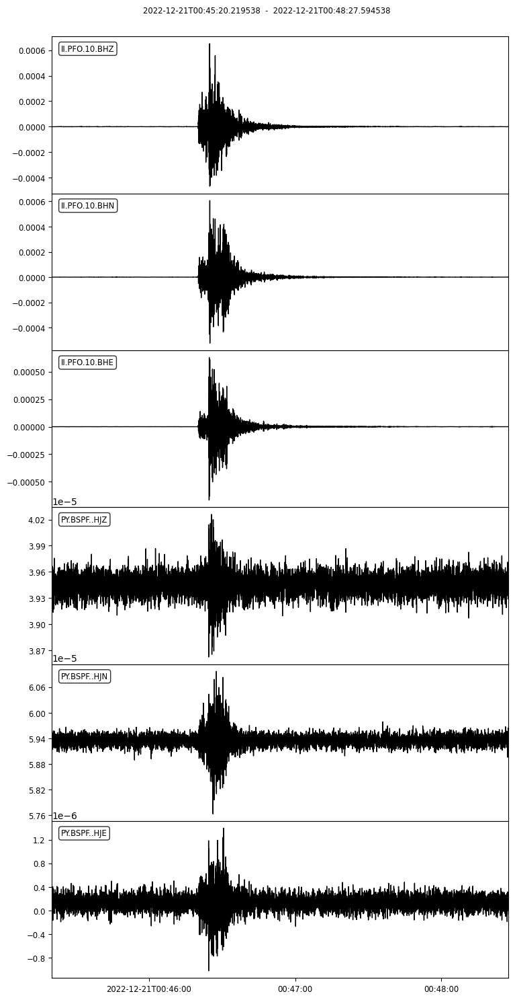


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221221T004620_raw.png ...

   -> Done

 -> 18 2022-12-25T08:40:45.069536Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-12-25T08:39:45.073800Z - 2022-12-25T08:42:52.798800Z | 40.0 Hz, 7510 samples
PY.BSPF..HJN | 2022-12-25T08:39:45.073800Z - 2022-12-25T08:42:52.798800Z | 40.0 Hz, 7510 samples
PY.BSPF..HJZ | 2022-12-25T08:39:45.073800Z - 2022-12-25T08:42:52.798800Z | 40.0 Hz, 7510 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-25T08:39:45.073800Z - 2022-12-25T08:42:52.798800Z | 40.0 Hz, 7510 samples
PY.BSPF..HJN  | 2022-12-25T08:39:45.073800Z - 2022-12-25T08:42:52.798800Z | 40.0 Hz, 7510 samples
PY.BSPF..HJZ  | 2022-12-25T08:39:45.073800Z - 2022-12-25T08:42:52.798800Z | 40.0 Hz, 7510 samples
II.PFO.10.BHN | 2022-12-25T08:39:45.069536Z - 2022-12-25T08:42:52.819536Z | 40.0 Hz, 7511 samples
II.PFO.10.BHE | 2022-12-25T08:39:45.069536Z - 2022-12-25T08:42:52.819536Z | 40.0 Hz, 7511 samples
II.PFO.10.BHZ | 2022-12-25T08:39:45.069536Z - 2022-12-25T08:42:52.819536Z | 40.0 Hz, 7511 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-25T08:39:45.073800Z - 2022-12-25T08:42:52.798800Z | 40.0 Hz, 7510 samples
PY.BSPF..HJN  | 2022-12-25T08:39:45.073800Z - 2022-12-25T08:42:52.798800Z | 40.0 Hz, 7510 samples
PY.BSPF..HJZ  | 2022-12-25T08:39:45.073800Z - 2022-12-25T08:42:52.798800Z | 40.0 Hz, 7510 samples
II.PFO.10.BHN | 2022-12-25T08:39:45.069536Z - 2022-12-25T08:42:52.819536Z | 40.0 Hz, 7511 samples
II.PFO.10.BHE | 2022-12-25T08:39:45.069536Z - 2022-12-25T08:42:52.819536Z | 40.0 Hz, 7511 samples
II.PFO.10.BHZ | 2022-12-25T08:39:45.069536Z - 2022-12-25T08:42:52.819536Z | 40.0 Hz, 7511 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-25T08:39:45.073800Z - 2022-12-25T08:42:52.798800Z | 40.0 Hz, 7510 samples
PY.BSPF..HJN  | 2022-12-25T08:39:45.073800Z - 2022-12-25T08:42:52.798800Z | 40.0 Hz, 7510 samples
PY.BSPF..HJZ  | 2022-12-25T08:39:45.073800Z - 2022-12-25T08:42:52.798800Z | 40.0 Hz, 7510 samples
II.PFO.10.BHN | 2022-12-25T08:39:45.069536Z - 2022-12-25T08:42:52.819536Z | 40.0 Hz, 7511 samples
II.PFO.10.BHE | 2022-12-25T08:39:45.069536Z - 2022-12-25T08:42:52.819536Z | 40.0 Hz, 7511 samples
II.PFO.10.BHZ | 2022-12-25T08:39:45.069536Z - 2022-12-25T08:42:52.819536Z | 40.0 Hz, 7511 samples

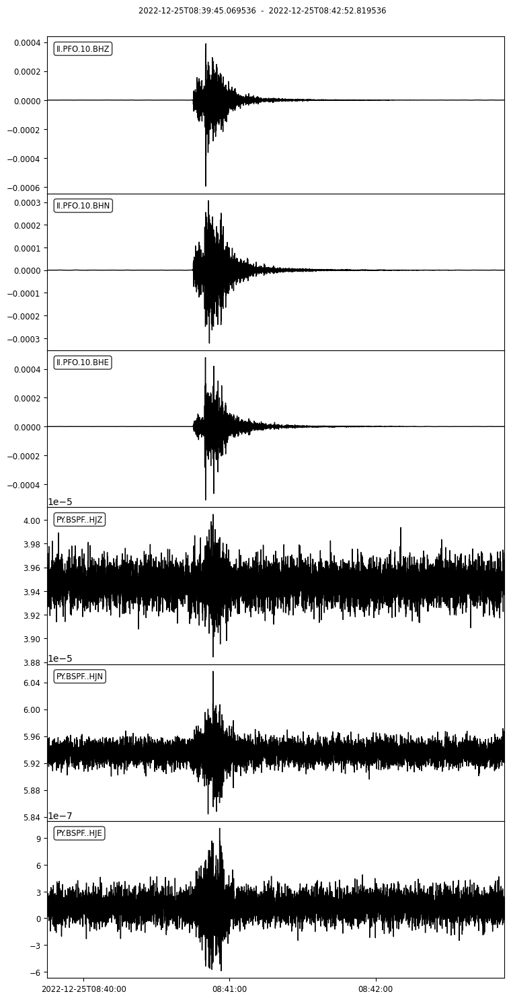


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221225T084045_raw.png ...

   -> Done

 -> 19 2022-12-25T18:53:21.769536Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-12-25T18:52:21.773800Z - 2022-12-25T18:55:27.598800Z | 40.0 Hz, 7434 samples
PY.BSPF..HJN | 2022-12-25T18:52:21.773800Z - 2022-12-25T18:55:27.598800Z | 40.0 Hz, 7434 samples
PY.BSPF..HJZ | 2022-12-25T18:52:21.773800Z - 2022-12-25T18:55:27.598800Z | 40.0 Hz, 7434 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-25T18:52:21.773800Z - 2022-12-25T18:55:27.598800Z | 40.0 Hz, 7434 samples
PY.BSPF..HJN  | 2022-12-25T18:52:21.773800Z - 2022-12-25T18:55:27.598800Z | 40.0 Hz, 7434 samples
PY.BSPF..HJZ  | 2022-12-25T18:52:21.773800Z - 2022-12-25T18:55:27.598800Z | 40.0 Hz, 7434 samples
II.PFO.10.BHN | 2022-12-25T18:52:21.769538Z - 2022-12-25T18:55:27.594538Z | 40.0 Hz, 7434 samples
II.PFO.10.BHE | 2022-12-25T18:52:21.769538Z - 2022-12-25T18:55:27.594538Z | 40.0 Hz, 7434 samples
II.PFO.10.BHZ | 2022-12-25T18:52:21.769538Z - 2022-12-25T18:55:27.594538Z | 40.0 Hz, 7434 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-25T18:52:21.773800Z - 2022-12-25T18:55:27.598800Z | 40.0 Hz, 7434 samples
PY.BSPF..HJN  | 2022-12-25T18:52:21.773800Z - 2022-12-25T18:55:27.598800Z | 40.0 Hz, 7434 samples
PY.BSPF..HJZ  | 2022-12-25T18:52:21.773800Z - 2022-12-25T18:55:27.598800Z | 40.0 Hz, 7434 samples
II.PFO.10.BHN | 2022-12-25T18:52:21.769538Z - 2022-12-25T18:55:27.594538Z | 40.0 Hz, 7434 samples
II.PFO.10.BHE | 2022-12-25T18:52:21.769538Z - 2022-12-25T18:55:27.594538Z | 40.0 Hz, 7434 samples
II.PFO.10.BHZ | 2022-12-25T18:52:21.769538Z - 2022-12-25T18:55:27.594538Z | 40.0 Hz, 7434 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-25T18:52:21.773800Z - 2022-12-25T18:55:27.598800Z | 40.0 Hz, 7434 samples
PY.BSPF..HJN  | 2022-12-25T18:52:21.773800Z - 2022-12-25T18:55:27.598800Z | 40.0 Hz, 7434 samples
PY.BSPF..HJZ  | 2022-12-25T18:52:21.773800Z - 2022-12-25T18:55:27.598800Z | 40.0 Hz, 7434 samples
II.PFO.10.BHN | 2022-12-25T18:52:21.769538Z - 2022-12-25T18:55:27.594538Z | 40.0 Hz, 7434 samples
II.PFO.10.BHE | 2022-12-25T18:52:21.769538Z - 2022-12-25T18:55:27.594538Z | 40.0 Hz, 7434 samples
II.PFO.10.BHZ | 2022-12-25T18:52:21.769538Z - 2022-12-25T18:55:27.594538Z | 40.0 Hz, 7434 samples

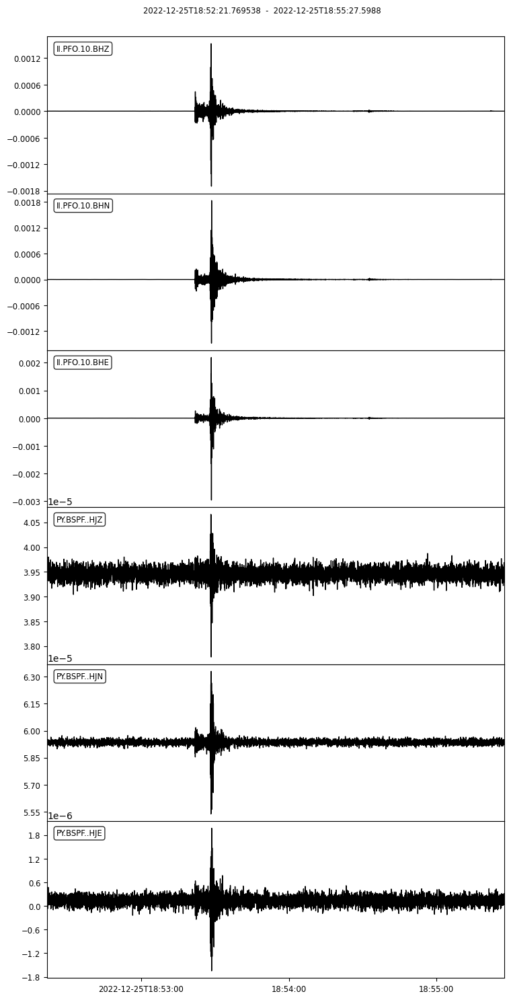


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221225T185321_raw.png ...

   -> Done

 -> 20 2022-12-31T11:40:58.269538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-12-31T11:39:58.273700Z - 2022-12-31T11:43:37.923700Z | 40.0 Hz, 8787 samples
PY.BSPF..HJN | 2022-12-31T11:39:58.273700Z - 2022-12-31T11:43:37.923700Z | 40.0 Hz, 8787 samples
PY.BSPF..HJZ | 2022-12-31T11:39:58.273700Z - 2022-12-31T11:43:37.923700Z | 40.0 Hz, 8787 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-31T11:39:58.273700Z - 2022-12-31T11:43:37.923700Z | 40.0 Hz, 8787 samples
PY.BSPF..HJN  | 2022-12-31T11:39:58.273700Z - 2022-12-31T11:43:37.923700Z | 40.0 Hz, 8787 samples
PY.BSPF..HJZ  | 2022-12-31T11:39:58.273700Z - 2022-12-31T11:43:37.923700Z | 40.0 Hz, 8787 samples
II.PFO.10.BHN | 2022-12-31T11:39:58.269538Z - 2022-12-31T11:43:37.944538Z | 40.0 Hz, 8788 samples
II.PFO.10.BHE | 2022-12-31T11:39:58.269538Z - 2022-12-31T11:43:37.944538Z | 40.0 Hz, 8788 samples
II.PFO.10.BHZ | 2022-12-31T11:39:58.269538Z - 2022-12-31T11:43:37.944538Z | 40.0 Hz, 8788 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-31T11:39:58.273700Z - 2022-12-31T11:43:37.923700Z | 40.0 Hz, 8787 samples
PY.BSPF..HJN  | 2022-12-31T11:39:58.273700Z - 2022-12-31T11:43:37.923700Z | 40.0 Hz, 8787 samples
PY.BSPF..HJZ  | 2022-12-31T11:39:58.273700Z - 2022-12-31T11:43:37.923700Z | 40.0 Hz, 8787 samples
II.PFO.10.BHN | 2022-12-31T11:39:58.269538Z - 2022-12-31T11:43:37.944538Z | 40.0 Hz, 8788 samples
II.PFO.10.BHE | 2022-12-31T11:39:58.269538Z - 2022-12-31T11:43:37.944538Z | 40.0 Hz, 8788 samples
II.PFO.10.BHZ | 2022-12-31T11:39:58.269538Z - 2022-12-31T11:43:37.944538Z | 40.0 Hz, 8788 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-31T11:39:58.273700Z - 2022-12-31T11:43:37.923700Z | 40.0 Hz, 8787 samples
PY.BSPF..HJN  | 2022-12-31T11:39:58.273700Z - 2022-12-31T11:43:37.923700Z | 40.0 Hz, 8787 samples
PY.BSPF..HJZ  | 2022-12-31T11:39:58.273700Z - 2022-12-31T11:43:37.923700Z | 40.0 Hz, 8787 samples
II.PFO.10.BHN | 2022-12-31T11:39:58.269538Z - 2022-12-31T11:43:37.944538Z | 40.0 Hz, 8788 samples
II.PFO.10.BHE | 2022-12-31T11:39:58.269538Z - 2022-12-31T11:43:37.944538Z | 40.0 Hz, 8788 samples
II.PFO.10.BHZ | 2022-12-31T11:39:58.269538Z - 2022-12-31T11:43:37.944538Z | 40.0 Hz, 8788 samples

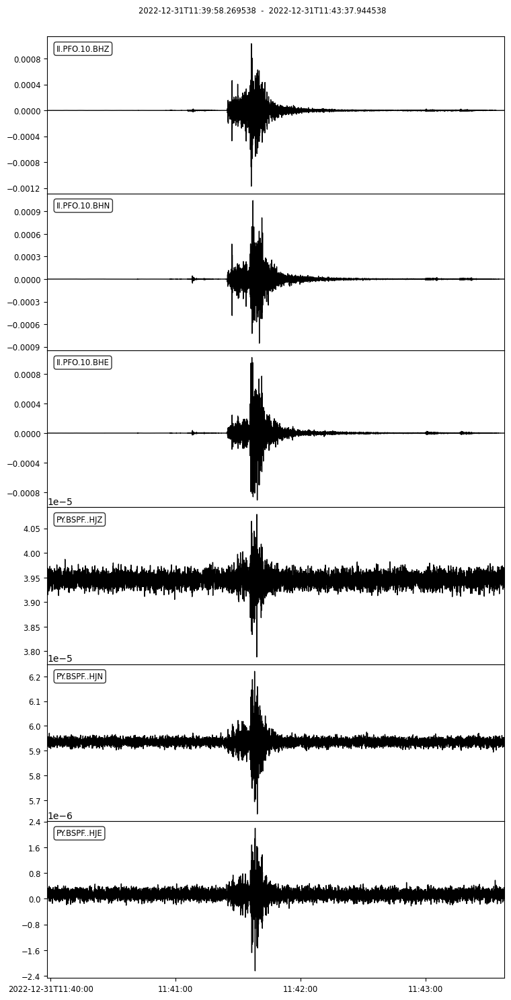


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221231T114058_raw.png ...

   -> Done

 -> 21 2022-12-31T12:12:29.944538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-12-31T12:11:29.948800Z - 2022-12-31T12:14:35.798800Z | 40.0 Hz, 7435 samples
PY.BSPF..HJN | 2022-12-31T12:11:29.948700Z - 2022-12-31T12:14:35.798700Z | 40.0 Hz, 7435 samples
PY.BSPF..HJZ | 2022-12-31T12:11:29.948700Z - 2022-12-31T12:14:35.798700Z | 40.0 Hz, 7435 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-31T12:11:29.948800Z - 2022-12-31T12:14:35.798800Z | 40.0 Hz, 7435 samples
PY.BSPF..HJN  | 2022-12-31T12:11:29.948700Z - 2022-12-31T12:14:35.798700Z | 40.0 Hz, 7435 samples
PY.BSPF..HJZ  | 2022-12-31T12:11:29.948700Z - 2022-12-31T12:14:35.798700Z | 40.0 Hz, 7435 samples
II.PFO.10.BHN | 2022-12-31T12:11:29.944538Z - 2022-12-31T12:14:35.819538Z | 40.0 Hz, 7436 samples
II.PFO.10.BHE | 2022-12-31T12:11:29.944538Z - 2022-12-31T12:14:35.819538Z | 40.0 Hz, 7436 samples
II.PFO.10.BHZ | 2022-12-31T12:11:29.944538Z - 2022-12-31T12:14:35.819538Z | 40.0 Hz, 7436 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-31T12:11:29.948800Z - 2022-12-31T12:14:35.798800Z | 40.0 Hz, 7435 samples
PY.BSPF..HJN  | 2022-12-31T12:11:29.948700Z - 2022-12-31T12:14:35.798700Z | 40.0 Hz, 7435 samples
PY.BSPF..HJZ  | 2022-12-31T12:11:29.948700Z - 2022-12-31T12:14:35.798700Z | 40.0 Hz, 7435 samples
II.PFO.10.BHN | 2022-12-31T12:11:29.944538Z - 2022-12-31T12:14:35.819538Z | 40.0 Hz, 7436 samples
II.PFO.10.BHE | 2022-12-31T12:11:29.944538Z - 2022-12-31T12:14:35.819538Z | 40.0 Hz, 7436 samples
II.PFO.10.BHZ | 2022-12-31T12:11:29.944538Z - 2022-12-31T12:14:35.819538Z | 40.0 Hz, 7436 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-31T12:11:29.948800Z - 2022-12-31T12:14:35.798800Z | 40.0 Hz, 7435 samples
PY.BSPF..HJN  | 2022-12-31T12:11:29.948700Z - 2022-12-31T12:14:35.798700Z | 40.0 Hz, 7435 samples
PY.BSPF..HJZ  | 2022-12-31T12:11:29.948700Z - 2022-12-31T12:14:35.798700Z | 40.0 Hz, 7435 samples
II.PFO.10.BHN | 2022-12-31T12:11:29.944538Z - 2022-12-31T12:14:35.819538Z | 40.0 Hz, 7436 samples
II.PFO.10.BHE | 2022-12-31T12:11:29.944538Z - 2022-12-31T12:14:35.819538Z | 40.0 Hz, 7436 samples
II.PFO.10.BHZ | 2022-12-31T12:11:29.944538Z - 2022-12-31T12:14:35.819538Z | 40.0 Hz, 7436 samples

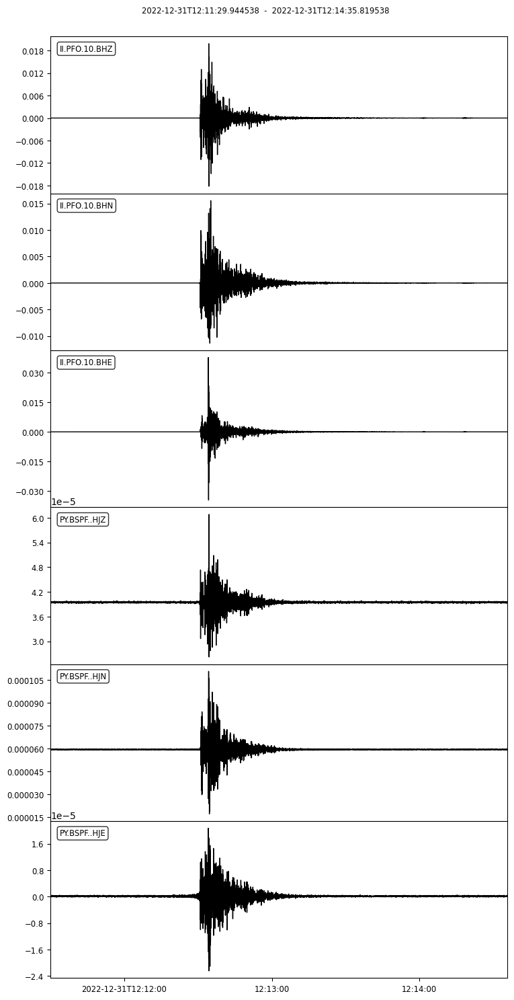


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221231T121229_raw.png ...

   -> Done

 -> 22 2022-12-31T16:40:11.344539Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2022-12-31T16:39:11.348700Z - 2022-12-31T16:42:18.473700Z | 40.0 Hz, 7486 samples
PY.BSPF..HJN | 2022-12-31T16:39:11.348700Z - 2022-12-31T16:42:18.473700Z | 40.0 Hz, 7486 samples
PY.BSPF..HJZ | 2022-12-31T16:39:11.348700Z - 2022-12-31T16:42:18.473700Z | 40.0 Hz, 7486 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-31T16:39:11.348700Z - 2022-12-31T16:42:18.473700Z | 40.0 Hz, 7486 samples
PY.BSPF..HJN  | 2022-12-31T16:39:11.348700Z - 2022-12-31T16:42:18.473700Z | 40.0 Hz, 7486 samples
PY.BSPF..HJZ  | 2022-12-31T16:39:11.348700Z - 2022-12-31T16:42:18.473700Z | 40.0 Hz, 7486 samples
II.PFO.10.BHN | 2022-12-31T16:39:11.344539Z - 2022-12-31T16:42:18.494539Z | 40.0 Hz, 7487 samples
II.PFO.10.BHE | 2022-12-31T16:39:11.344539Z - 2022-12-31T16:42:18.494539Z | 40.0 Hz, 7487 samples
II.PFO.10.BHZ | 2022-12-31T16:39:11.344539Z - 2022-12-31T16:42:18.494539Z | 40.0 Hz, 7487 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-31T16:39:11.348700Z - 2022-12-31T16:42:18.473700Z | 40.0 Hz, 7486 samples
PY.BSPF..HJN  | 2022-12-31T16:39:11.348700Z - 2022-12-31T16:42:18.473700Z | 40.0 Hz, 7486 samples
PY.BSPF..HJZ  | 2022-12-31T16:39:11.348700Z - 2022-12-31T16:42:18.473700Z | 40.0 Hz, 7486 samples
II.PFO.10.BHN | 2022-12-31T16:39:11.344539Z - 2022-12-31T16:42:18.494539Z | 40.0 Hz, 7487 samples
II.PFO.10.BHE | 2022-12-31T16:39:11.344539Z - 2022-12-31T16:42:18.494539Z | 40.0 Hz, 7487 samples
II.PFO.10.BHZ | 2022-12-31T16:39:11.344539Z - 2022-12-31T16:42:18.494539Z | 40.0 Hz, 7487 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-31T16:39:11.348700Z - 2022-12-31T16:42:18.473700Z | 40.0 Hz, 7486 samples
PY.BSPF..HJN  | 2022-12-31T16:39:11.348700Z - 2022-12-31T16:42:18.473700Z | 40.0 Hz, 7486 samples
PY.BSPF..HJZ  | 2022-12-31T16:39:11.348700Z - 2022-12-31T16:42:18.473700Z | 40.0 Hz, 7486 samples
II.PFO.10.BHN | 2022-12-31T16:39:11.344539Z - 2022-12-31T16:42:18.494539Z | 40.0 Hz, 7487 samples
II.PFO.10.BHE | 2022-12-31T16:39:11.344539Z - 2022-12-31T16:42:18.494539Z | 40.0 Hz, 7487 samples
II.PFO.10.BHZ | 2022-12-31T16:39:11.344539Z - 2022-12-31T16:42:18.494539Z | 40.0 Hz, 7487 samples

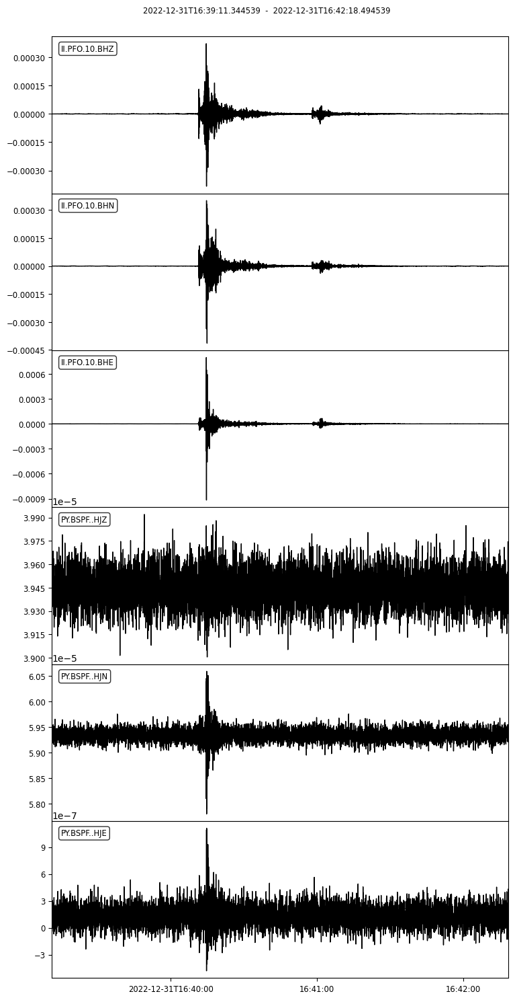


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20221231T164011_raw.png ...

   -> Done

 -> 23 2023-01-02T03:20:21.994538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-02T03:19:21.999000Z - 2023-01-02T03:22:26.949000Z | 40.0 Hz, 7399 samples
PY.BSPF..HJN | 2023-01-02T03:19:21.999100Z - 2023-01-02T03:22:26.949100Z | 40.0 Hz, 7399 samples
PY.BSPF..HJZ | 2023-01-02T03:19:21.999100Z - 2023-01-02T03:22:26.949100Z | 40.0 Hz, 7399 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-02T03:19:21.999000Z - 2023-01-02T03:22:26.949000Z | 40.0 Hz, 7399 samples
PY.BSPF..HJN  | 2023-01-02T03:19:21.999100Z - 2023-01-02T03:22:26.949100Z | 40.0 Hz, 7399 samples
PY.BSPF..HJZ  | 2023-01-02T03:19:21.999100Z - 2023-01-02T03:22:26.949100Z | 40.0 Hz, 7399 samples
II.PFO.10.BHN | 2023-01-02T03:19:21.994538Z - 2023-01-02T03:22:26.969538Z | 40.0 Hz, 7400 samples
II.PFO.10.BHE | 2023-01-02T03:19:21.994538Z - 2023-01-02T03:22:26.969538Z | 40.0 Hz, 7400 samples
II.PFO.10.BHZ | 2023-01-02T03:19:21.994538Z - 2023-01-02T03:22:26.969538Z | 40.0 Hz, 7400 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-02T03:19:21.999000Z - 2023-01-02T03:22:26.949000Z | 40.0 Hz, 7399 samples
PY.BSPF..HJN  | 2023-01-02T03:19:21.999100Z - 2023-01-02T03:22:26.949100Z | 40.0 Hz, 7399 samples
PY.BSPF..HJZ  | 2023-01-02T03:19:21.999100Z - 2023-01-02T03:22:26.949100Z | 40.0 Hz, 7399 samples
II.PFO.10.BHN | 2023-01-02T03:19:21.994538Z - 2023-01-02T03:22:26.969538Z | 40.0 Hz, 7400 samples
II.PFO.10.BHE | 2023-01-02T03:19:21.994538Z - 2023-01-02T03:22:26.969538Z | 40.0 Hz, 7400 samples
II.PFO.10.BHZ | 2023-01-02T03:19:21.994538Z - 2023-01-02T03:22:26.969538Z | 40.0 Hz, 7400 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-02T03:19:21.999000Z - 2023-01-02T03:22:26.949000Z | 40.0 Hz, 7399 samples
PY.BSPF..HJN  | 2023-01-02T03:19:21.999100Z - 2023-01-02T03:22:26.949100Z | 40.0 Hz, 7399 samples
PY.BSPF..HJZ  | 2023-01-02T03:19:21.999100Z - 2023-01-02T03:22:26.949100Z | 40.0 Hz, 7399 samples
II.PFO.10.BHN | 2023-01-02T03:19:21.994538Z - 2023-01-02T03:22:26.969538Z | 40.0 Hz, 7400 samples
II.PFO.10.BHE | 2023-01-02T03:19:21.994538Z - 2023-01-02T03:22:26.969538Z | 40.0 Hz, 7400 samples
II.PFO.10.BHZ | 2023-01-02T03:19:21.994538Z - 2023-01-02T03:22:26.969538Z | 40.0 Hz, 7400 samples

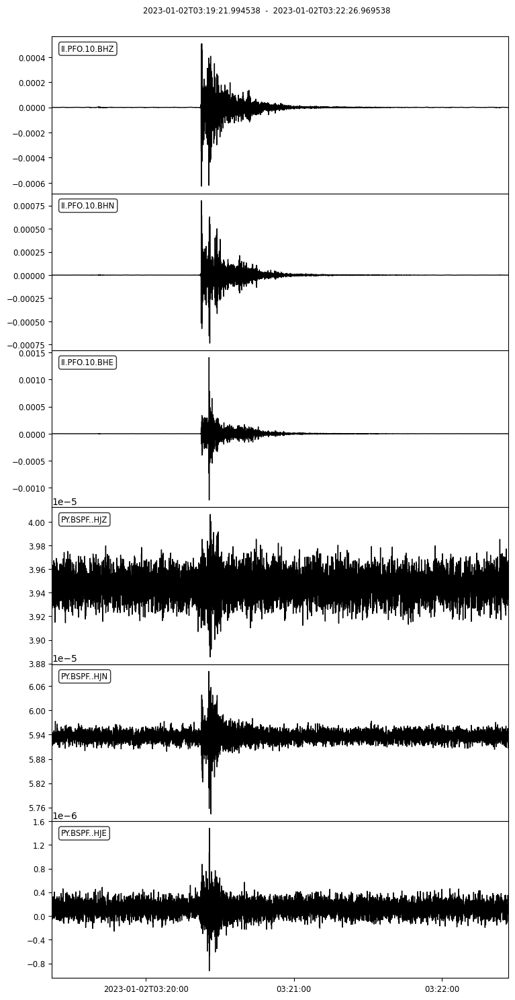


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230102T032021_raw.png ...

   -> Done

 -> 24 2023-01-05T10:00:37.244538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJN | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJZ | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJN  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJZ  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
II.PFO.10.BHN | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples
II.PFO.10.BHE | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples
II.PFO.10.BHZ | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJN  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJZ  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
II.PFO.10.BHN | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples
II.PFO.10.BHE | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples
II.PFO.10.BHZ | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJN  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJZ  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
II.PFO.10.BHN | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples
II.PFO.10.BHE | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples
II.PFO.10.BHZ | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples

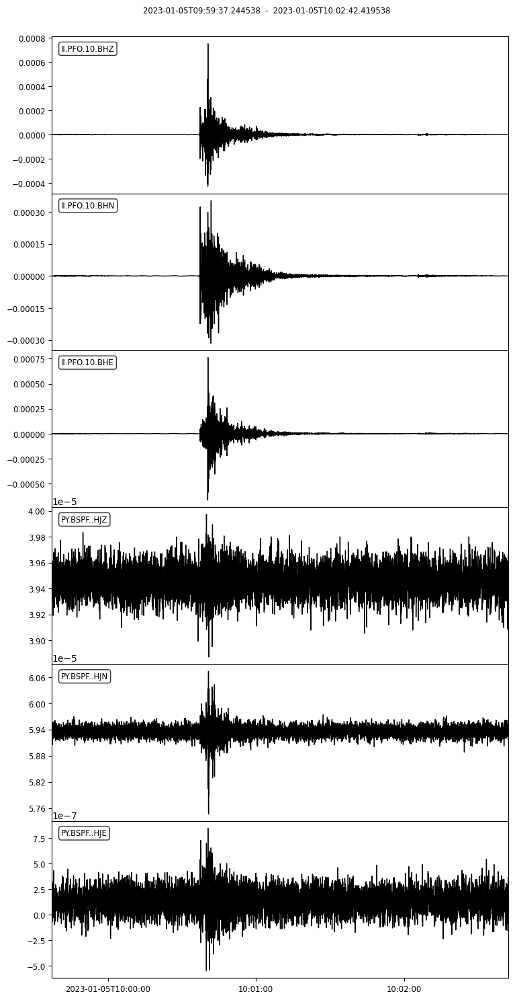


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230105T100037_raw.png ...

   -> Done

 -> 25 2023-01-05T10:00:37.244538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJN | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJZ | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJN  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJZ  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
II.PFO.10.BHN | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples
II.PFO.10.BHE | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples
II.PFO.10.BHZ | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJN  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJZ  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
II.PFO.10.BHN | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples
II.PFO.10.BHE | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples
II.PFO.10.BHZ | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJN  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
PY.BSPF..HJZ  | 2023-01-05T09:59:37.249100Z - 2023-01-05T10:02:42.399100Z | 40.0 Hz, 7407 samples
II.PFO.10.BHN | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples
II.PFO.10.BHE | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples
II.PFO.10.BHZ | 2023-01-05T09:59:37.244538Z - 2023-01-05T10:02:42.419538Z | 40.0 Hz, 7408 samples

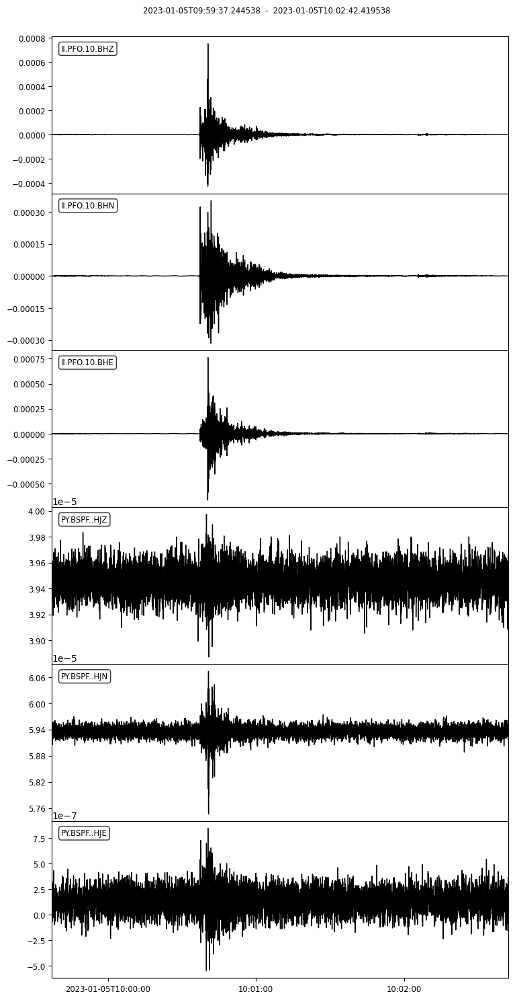


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230105T100037_raw.png ...

   -> Done

 -> 26 2023-01-05T23:26:26.994538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-05T23:25:26.999100Z - 2023-01-05T23:28:28.699100Z | 40.0 Hz, 7269 samples
PY.BSPF..HJN | 2023-01-05T23:25:26.999100Z - 2023-01-05T23:28:28.699100Z | 40.0 Hz, 7269 samples
PY.BSPF..HJZ | 2023-01-05T23:25:26.999100Z - 2023-01-05T23:28:28.699100Z | 40.0 Hz, 7269 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-05T23:25:26.999100Z - 2023-01-05T23:28:28.699100Z | 40.0 Hz, 7269 samples
PY.BSPF..HJN  | 2023-01-05T23:25:26.999100Z - 2023-01-05T23:28:28.699100Z | 40.0 Hz, 7269 samples
PY.BSPF..HJZ  | 2023-01-05T23:25:26.999100Z - 2023-01-05T23:28:28.699100Z | 40.0 Hz, 7269 samples
II.PFO.10.BHN | 2023-01-05T23:25:26.994538Z - 2023-01-05T23:28:28.719538Z | 40.0 Hz, 7270 samples
II.PFO.10.BHE | 2023-01-05T23:25:26.994538Z - 2023-01-05T23:28:28.719538Z | 40.0 Hz, 7270 samples
II.PFO.10.BHZ | 2023-01-05T23:25:26.994538Z - 2023-01-05T23:28:28.719538Z | 40.0 Hz, 7270 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-05T23:25:26.999100Z - 2023-01-05T23:28:28.699100Z | 40.0 Hz, 7269 samples
PY.BSPF..HJN  | 2023-01-05T23:25:26.999100Z - 2023-01-05T23:28:28.699100Z | 40.0 Hz, 7269 samples
PY.BSPF..HJZ  | 2023-01-05T23:25:26.999100Z - 2023-01-05T23:28:28.699100Z | 40.0 Hz, 7269 samples
II.PFO.10.BHN | 2023-01-05T23:25:26.994538Z - 2023-01-05T23:28:28.719538Z | 40.0 Hz, 7270 samples
II.PFO.10.BHE | 2023-01-05T23:25:26.994538Z - 2023-01-05T23:28:28.719538Z | 40.0 Hz, 7270 samples
II.PFO.10.BHZ | 2023-01-05T23:25:26.994538Z - 2023-01-05T23:28:28.719538Z | 40.0 Hz, 7270 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-05T23:25:26.999100Z - 2023-01-05T23:28:28.699100Z | 40.0 Hz, 7269 samples
PY.BSPF..HJN  | 2023-01-05T23:25:26.999100Z - 2023-01-05T23:28:28.699100Z | 40.0 Hz, 7269 samples
PY.BSPF..HJZ  | 2023-01-05T23:25:26.999100Z - 2023-01-05T23:28:28.699100Z | 40.0 Hz, 7269 samples
II.PFO.10.BHN | 2023-01-05T23:25:26.994538Z - 2023-01-05T23:28:28.719538Z | 40.0 Hz, 7270 samples
II.PFO.10.BHE | 2023-01-05T23:25:26.994538Z - 2023-01-05T23:28:28.719538Z | 40.0 Hz, 7270 samples
II.PFO.10.BHZ | 2023-01-05T23:25:26.994538Z - 2023-01-05T23:28:28.719538Z | 40.0 Hz, 7270 samples

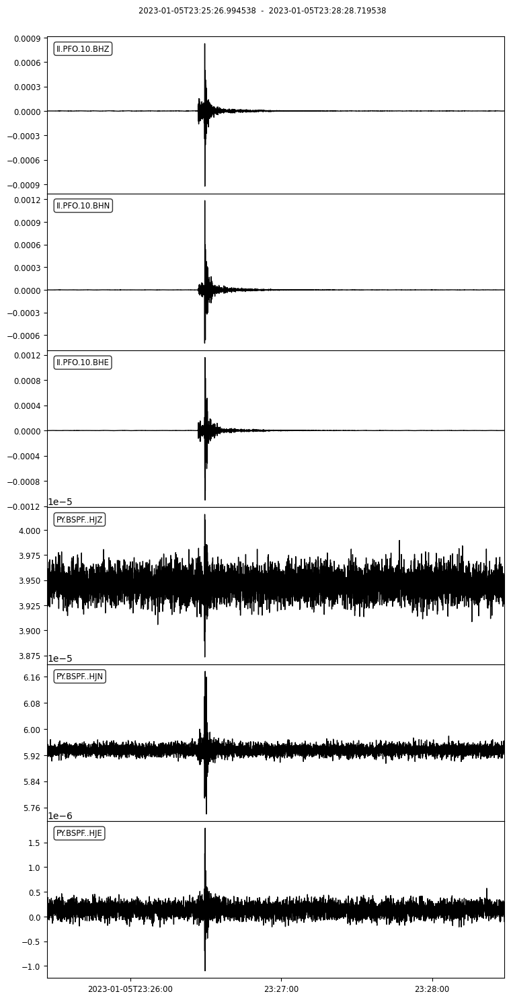


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230105T232626_raw.png ...

   -> Done

 -> 27 2023-01-09T16:59:40.569539Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-09T16:58:40.573300Z - 2023-01-09T17:01:45.148300Z | 40.0 Hz, 7384 samples
PY.BSPF..HJN | 2023-01-09T16:58:40.573300Z - 2023-01-09T17:01:45.148300Z | 40.0 Hz, 7384 samples
PY.BSPF..HJZ | 2023-01-09T16:58:40.573300Z - 2023-01-09T17:01:45.148300Z | 40.0 Hz, 7384 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-09T16:58:40.573300Z - 2023-01-09T17:01:45.148300Z | 40.0 Hz, 7384 samples
PY.BSPF..HJN  | 2023-01-09T16:58:40.573300Z - 2023-01-09T17:01:45.148300Z | 40.0 Hz, 7384 samples
PY.BSPF..HJZ  | 2023-01-09T16:58:40.573300Z - 2023-01-09T17:01:45.148300Z | 40.0 Hz, 7384 samples
II.PFO.10.BHN | 2023-01-09T16:58:40.569539Z - 2023-01-09T17:01:45.169539Z | 40.0 Hz, 7385 samples
II.PFO.10.BHE | 2023-01-09T16:58:40.569539Z - 2023-01-09T17:01:45.169539Z | 40.0 Hz, 7385 samples
II.PFO.10.BHZ | 2023-01-09T16:58:40.569539Z - 2023-01-09T17:01:45.169539Z | 40.0 Hz, 7385 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-09T16:58:40.573300Z - 2023-01-09T17:01:45.148300Z | 40.0 Hz, 7384 samples
PY.BSPF..HJN  | 2023-01-09T16:58:40.573300Z - 2023-01-09T17:01:45.148300Z | 40.0 Hz, 7384 samples
PY.BSPF..HJZ  | 2023-01-09T16:58:40.573300Z - 2023-01-09T17:01:45.148300Z | 40.0 Hz, 7384 samples
II.PFO.10.BHN | 2023-01-09T16:58:40.569539Z - 2023-01-09T17:01:45.169539Z | 40.0 Hz, 7385 samples
II.PFO.10.BHE | 2023-01-09T16:58:40.569539Z - 2023-01-09T17:01:45.169539Z | 40.0 Hz, 7385 samples
II.PFO.10.BHZ | 2023-01-09T16:58:40.569539Z - 2023-01-09T17:01:45.169539Z | 40.0 Hz, 7385 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-09T16:58:40.573300Z - 2023-01-09T17:01:45.148300Z | 40.0 Hz, 7384 samples
PY.BSPF..HJN  | 2023-01-09T16:58:40.573300Z - 2023-01-09T17:01:45.148300Z | 40.0 Hz, 7384 samples
PY.BSPF..HJZ  | 2023-01-09T16:58:40.573300Z - 2023-01-09T17:01:45.148300Z | 40.0 Hz, 7384 samples
II.PFO.10.BHN | 2023-01-09T16:58:40.569539Z - 2023-01-09T17:01:45.169539Z | 40.0 Hz, 7385 samples
II.PFO.10.BHE | 2023-01-09T16:58:40.569539Z - 2023-01-09T17:01:45.169539Z | 40.0 Hz, 7385 samples
II.PFO.10.BHZ | 2023-01-09T16:58:40.569539Z - 2023-01-09T17:01:45.169539Z | 40.0 Hz, 7385 samples

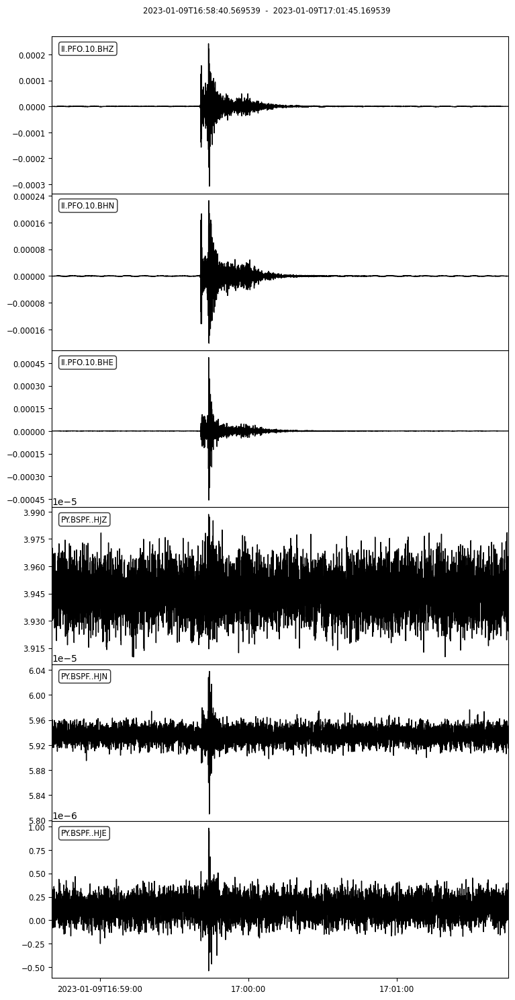


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230109T165940_raw.png ...

   -> Done

 -> 28 2023-01-09T19:43:00.119539Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-09T19:42:00.123300Z - 2023-01-09T19:45:06.023300Z | 40.0 Hz, 7437 samples
PY.BSPF..HJN | 2023-01-09T19:42:00.123300Z - 2023-01-09T19:45:06.023300Z | 40.0 Hz, 7437 samples
PY.BSPF..HJZ | 2023-01-09T19:42:00.123300Z - 2023-01-09T19:45:06.023300Z | 40.0 Hz, 7437 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-09T19:42:00.123300Z - 2023-01-09T19:45:06.023300Z | 40.0 Hz, 7437 samples
PY.BSPF..HJN  | 2023-01-09T19:42:00.123300Z - 2023-01-09T19:45:06.023300Z | 40.0 Hz, 7437 samples
PY.BSPF..HJZ  | 2023-01-09T19:42:00.123300Z - 2023-01-09T19:45:06.023300Z | 40.0 Hz, 7437 samples
II.PFO.10.BHN | 2023-01-09T19:42:00.119539Z - 2023-01-09T19:45:06.044539Z | 40.0 Hz, 7438 samples
II.PFO.10.BHE | 2023-01-09T19:42:00.119539Z - 2023-01-09T19:45:06.044539Z | 40.0 Hz, 7438 samples
II.PFO.10.BHZ | 2023-01-09T19:42:00.119539Z - 2023-01-09T19:45:06.044539Z | 40.0 Hz, 7438 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-09T19:42:00.123300Z - 2023-01-09T19:45:06.023300Z | 40.0 Hz, 7437 samples
PY.BSPF..HJN  | 2023-01-09T19:42:00.123300Z - 2023-01-09T19:45:06.023300Z | 40.0 Hz, 7437 samples
PY.BSPF..HJZ  | 2023-01-09T19:42:00.123300Z - 2023-01-09T19:45:06.023300Z | 40.0 Hz, 7437 samples
II.PFO.10.BHN | 2023-01-09T19:42:00.119539Z - 2023-01-09T19:45:06.044539Z | 40.0 Hz, 7438 samples
II.PFO.10.BHE | 2023-01-09T19:42:00.119539Z - 2023-01-09T19:45:06.044539Z | 40.0 Hz, 7438 samples
II.PFO.10.BHZ | 2023-01-09T19:42:00.119539Z - 2023-01-09T19:45:06.044539Z | 40.0 Hz, 7438 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-09T19:42:00.123300Z - 2023-01-09T19:45:06.023300Z | 40.0 Hz, 7437 samples
PY.BSPF..HJN  | 2023-01-09T19:42:00.123300Z - 2023-01-09T19:45:06.023300Z | 40.0 Hz, 7437 samples
PY.BSPF..HJZ  | 2023-01-09T19:42:00.123300Z - 2023-01-09T19:45:06.023300Z | 40.0 Hz, 7437 samples
II.PFO.10.BHN | 2023-01-09T19:42:00.119539Z - 2023-01-09T19:45:06.044539Z | 40.0 Hz, 7438 samples
II.PFO.10.BHE | 2023-01-09T19:42:00.119539Z - 2023-01-09T19:45:06.044539Z | 40.0 Hz, 7438 samples
II.PFO.10.BHZ | 2023-01-09T19:42:00.119539Z - 2023-01-09T19:45:06.044539Z | 40.0 Hz, 7438 samples

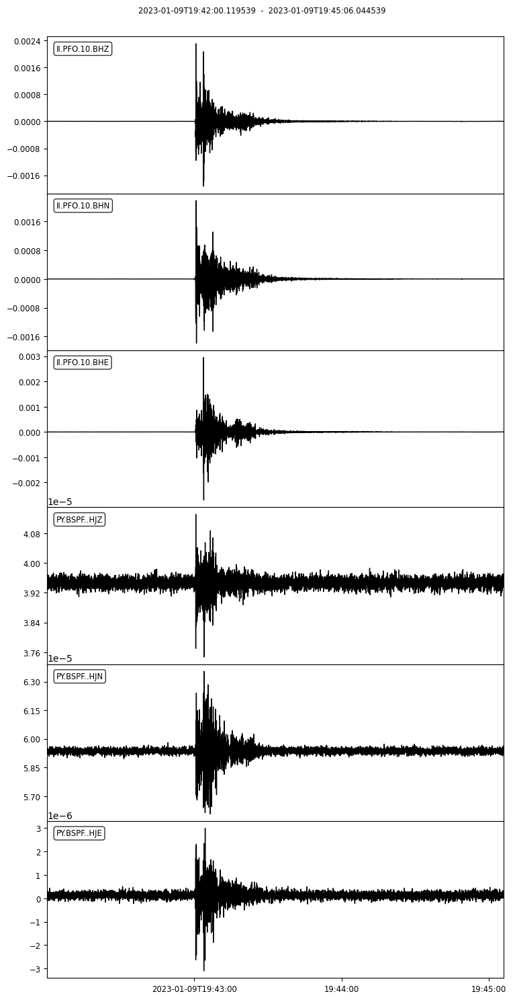


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230109T194300_raw.png ...

   -> Done

 -> 29 2023-01-11T18:59:25.144538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-11T18:58:25.148200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7434 samples
PY.BSPF..HJN | 2023-01-11T18:58:25.148200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7434 samples
PY.BSPF..HJZ | 2023-01-11T18:58:25.148200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7434 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-11T18:58:25.148200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7434 samples
PY.BSPF..HJN  | 2023-01-11T18:58:25.148200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7434 samples
PY.BSPF..HJZ  | 2023-01-11T18:58:25.148200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7434 samples
II.PFO.10.BHN | 2023-01-11T18:58:25.144538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7435 samples
II.PFO.10.BHE | 2023-01-11T18:58:25.144538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7435 samples
II.PFO.10.BHZ | 2023-01-11T18:58:25.144538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7435 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-11T18:58:25.148200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7434 samples
PY.BSPF..HJN  | 2023-01-11T18:58:25.148200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7434 samples
PY.BSPF..HJZ  | 2023-01-11T18:58:25.148200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7434 samples
II.PFO.10.BHN | 2023-01-11T18:58:25.144538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7435 samples
II.PFO.10.BHE | 2023-01-11T18:58:25.144538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7435 samples
II.PFO.10.BHZ | 2023-01-11T18:58:25.144538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7435 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-11T18:58:25.148200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7434 samples
PY.BSPF..HJN  | 2023-01-11T18:58:25.148200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7434 samples
PY.BSPF..HJZ  | 2023-01-11T18:58:25.148200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7434 samples
II.PFO.10.BHN | 2023-01-11T18:58:25.144538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7435 samples
II.PFO.10.BHE | 2023-01-11T18:58:25.144538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7435 samples
II.PFO.10.BHZ | 2023-01-11T18:58:25.144538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7435 samples

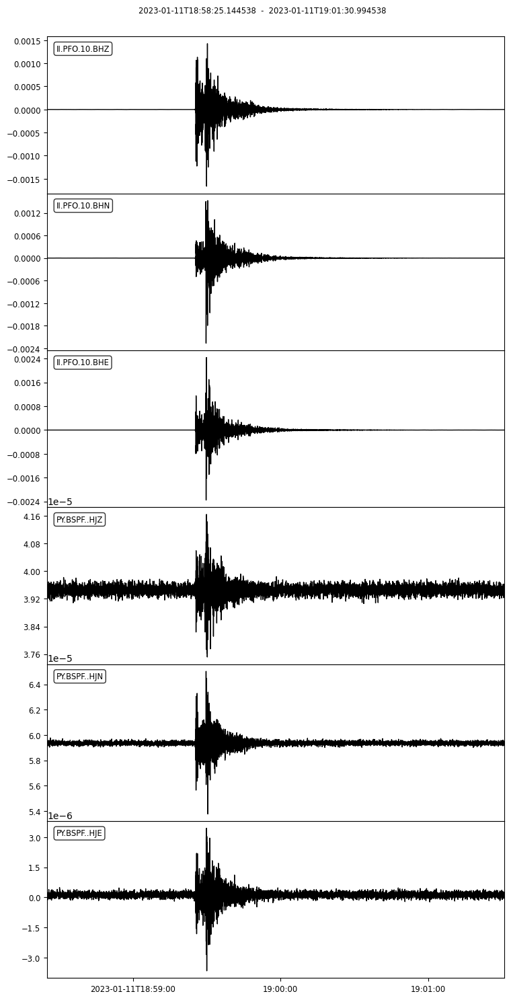


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230111T185925_raw.png ...

   -> Done

 -> 30 2023-01-11T18:59:25.094538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-11T18:58:25.098200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7436 samples
PY.BSPF..HJN | 2023-01-11T18:58:25.098200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7436 samples
PY.BSPF..HJZ | 2023-01-11T18:58:25.098200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7436 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-11T18:58:25.098200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7436 samples
PY.BSPF..HJN  | 2023-01-11T18:58:25.098200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7436 samples
PY.BSPF..HJZ  | 2023-01-11T18:58:25.098200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7436 samples
II.PFO.10.BHN | 2023-01-11T18:58:25.094538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7437 samples
II.PFO.10.BHE | 2023-01-11T18:58:25.094538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7437 samples
II.PFO.10.BHZ | 2023-01-11T18:58:25.094538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7437 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-11T18:58:25.098200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7436 samples
PY.BSPF..HJN  | 2023-01-11T18:58:25.098200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7436 samples
PY.BSPF..HJZ  | 2023-01-11T18:58:25.098200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7436 samples
II.PFO.10.BHN | 2023-01-11T18:58:25.094538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7437 samples
II.PFO.10.BHE | 2023-01-11T18:58:25.094538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7437 samples
II.PFO.10.BHZ | 2023-01-11T18:58:25.094538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7437 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-11T18:58:25.098200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7436 samples
PY.BSPF..HJN  | 2023-01-11T18:58:25.098200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7436 samples
PY.BSPF..HJZ  | 2023-01-11T18:58:25.098200Z - 2023-01-11T19:01:30.973200Z | 40.0 Hz, 7436 samples
II.PFO.10.BHN | 2023-01-11T18:58:25.094538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7437 samples
II.PFO.10.BHE | 2023-01-11T18:58:25.094538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7437 samples
II.PFO.10.BHZ | 2023-01-11T18:58:25.094538Z - 2023-01-11T19:01:30.994538Z | 40.0 Hz, 7437 samples

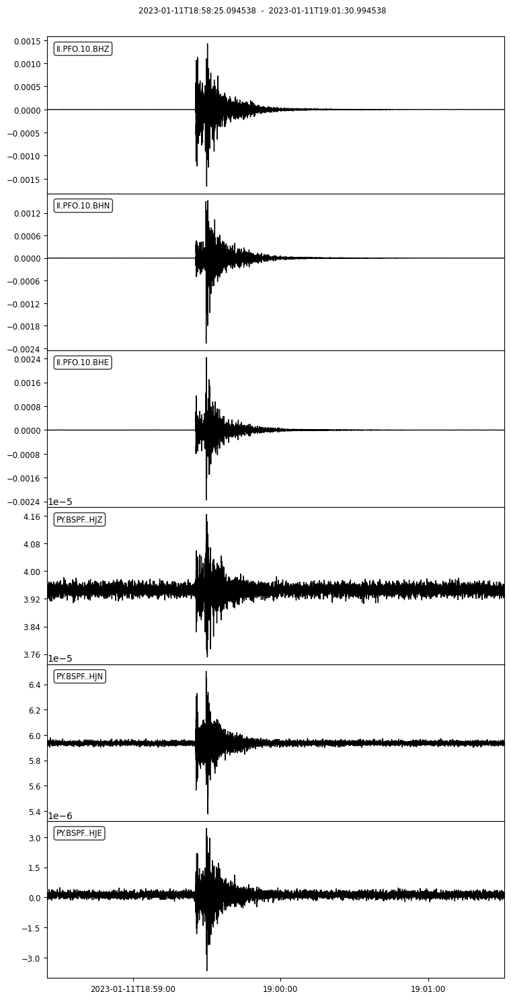


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230111T185925_raw.png ...

   -> Done

 -> 31 2023-01-12T19:09:15.563200Z 
 -> sensitivity removed!
 -> response removed!


6 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-12T19:08:15.563200Z - 2023-01-12T19:09:13.513200Z | 40.0 Hz, 2319 samples
PY.BSPF..HJE | 2023-01-12T19:09:15.538200Z - 2023-01-12T19:12:09.938200Z | 40.0 Hz, 6977 samples
PY.BSPF..HJN | 2023-01-12T19:08:15.563200Z - 2023-01-12T19:09:13.513200Z | 40.0 Hz, 2319 samples
PY.BSPF..HJN | 2023-01-12T19:09:15.538200Z - 2023-01-12T19:12:09.938200Z | 40.0 Hz, 6977 samples
PY.BSPF..HJZ | 2023-01-12T19:08:15.563200Z - 2023-01-12T19:09:13.513200Z | 40.0 Hz, 2319 samples
PY.BSPF..HJZ | 2023-01-12T19:09:15.538200Z - 2023-01-12T19:12:09.938200Z | 40.0 Hz, 6977 samples

9 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-12T19:08:15.563200Z - 2023-01-12T19:09:13.513200Z | 40.0 Hz, 2319 samples
PY.BSPF..HJE  | 2023-01-12T19:09:15.538200Z - 2023-01-12T19:12:09.938200Z | 40.0 Hz, 6977 samples
PY.BSPF..HJN  | 2023-01-12T19:08:15.563200Z - 2023-01-12T19:09:13.513200Z | 40.0 Hz, 2319 samples
PY.BSPF..HJN  | 2023-01-12T19:09:15.538200Z - 2023-01-12T19:12:09.938200Z | 40.0 Hz, 6977 samples
PY.BSPF..HJZ  | 2023-01-12T19:08:15.563200Z - 2023-01-12T19:09:13.513200Z | 40.0 Hz, 2319 samples
PY.BSPF..HJZ  | 2023-01-12T19:09:15.538200Z - 2023-01-12T19:12:09.938200Z | 40.0 Hz, 6977 samples
II.PFO.10.BHN | 2023-01-12T19:08:15.569538Z - 2023-01-12T19:12:09.944538Z | 40.0 Hz, 9376 samples
II.PFO.10.BHE | 2023-01-12T19:08:15.569538Z - 2023-01-12T19:12:09.944538Z | 40.0 Hz, 9376 samples
II.PFO.10.BHZ | 2023-01-12T19:08:15.569538Z - 2023-01-12T19:12:09.944538Z | 40.0 Hz, 9376 samples

9 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-12T19:08:15.563200Z - 2023-01-12T19:09:13.513200Z | 40.0 Hz, 2319 samples
PY.BSPF..HJE  | 2023-01-12T19:09:15.538200Z - 2023-01-12T19:12:09.938200Z | 40.0 Hz, 6977 samples
PY.BSPF..HJN  | 2023-01-12T19:08:15.563200Z - 2023-01-12T19:09:13.513200Z | 40.0 Hz, 2319 samples
PY.BSPF..HJN  | 2023-01-12T19:09:15.538200Z - 2023-01-12T19:12:09.938200Z | 40.0 Hz, 6977 samples
PY.BSPF..HJZ  | 2023-01-12T19:08:15.563200Z - 2023-01-12T19:09:13.513200Z | 40.0 Hz, 2319 samples
PY.BSPF..HJZ  | 2023-01-12T19:09:15.538200Z - 2023-01-12T19:12:09.938200Z | 40.0 Hz, 6977 samples
II.PFO.10.BHN | 2023-01-12T19:08:15.569538Z - 2023-01-12T19:12:09.944538Z | 40.0 Hz, 9376 samples
II.PFO.10.BHE | 2023-01-12T19:08:15.569538Z - 2023-01-12T19:12:09.944538Z | 40.0 Hz, 9376 samples
II.PFO.10.BHZ | 2023-01-12T19:08:15.569538Z - 2023-01-12T19:12:09.944538Z | 40.0 Hz, 9376 samples

9 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-12T19:08:15.563200Z - 2023-01-12T19:09:13.513200Z | 40.0 Hz, 2319 samples
PY.BSPF..HJE  | 2023-01-12T19:09:15.538200Z - 2023-01-12T19:12:09.938200Z | 40.0 Hz, 6977 samples
PY.BSPF..HJN  | 2023-01-12T19:08:15.563200Z - 2023-01-12T19:09:13.513200Z | 40.0 Hz, 2319 samples
PY.BSPF..HJN  | 2023-01-12T19:09:15.538200Z - 2023-01-12T19:12:09.938200Z | 40.0 Hz, 6977 samples
PY.BSPF..HJZ  | 2023-01-12T19:08:15.563200Z - 2023-01-12T19:09:13.513200Z | 40.0 Hz, 2319 samples
PY.BSPF..HJZ  | 2023-01-12T19:09:15.538200Z - 2023-01-12T19:12:09.938200Z | 40.0 Hz, 6977 samples
II.PFO.10.BHN | 2023-01-12T19:08:15.569538Z - 2023-01-12T19:12:09.944538Z | 40.0 Hz, 9376 samples
II.PFO.10.BHE | 2023-01-12T19:08:15.569538Z - 2023-01-12T19:12:09.944538Z | 40.0 Hz, 9376 samples
II.PFO.10.BHZ | 2023-01-12T19:08:15.569538Z - 2023-01-12T19:12:09.944538Z | 40.0 Hz, 9376 samples

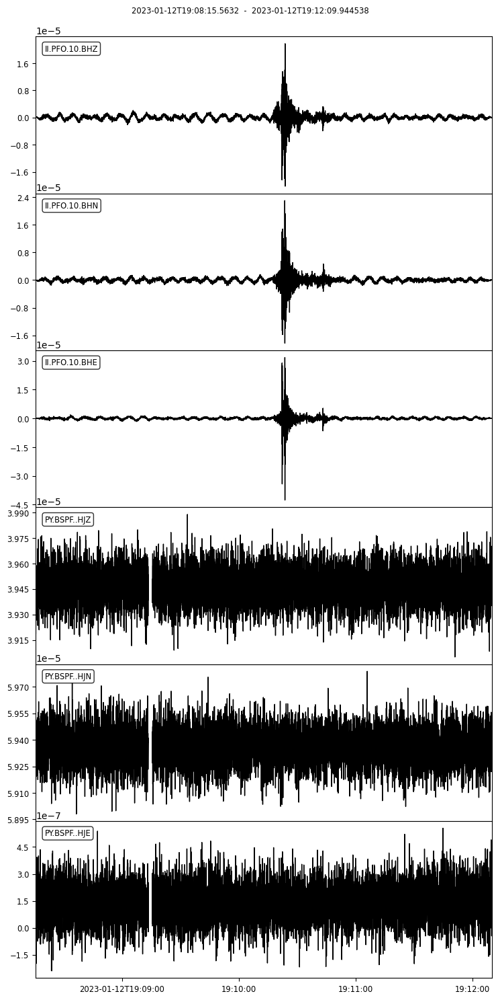


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230112T190915_raw.png ...

   -> Done

 -> 32 2023-01-15T09:58:58.469538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJN | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJZ | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJN  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJZ  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
II.PFO.10.BHN | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples
II.PFO.10.BHE | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples
II.PFO.10.BHZ | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJN  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJZ  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
II.PFO.10.BHN | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples
II.PFO.10.BHE | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples
II.PFO.10.BHZ | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJN  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJZ  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
II.PFO.10.BHN | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples
II.PFO.10.BHE | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples
II.PFO.10.BHZ | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples

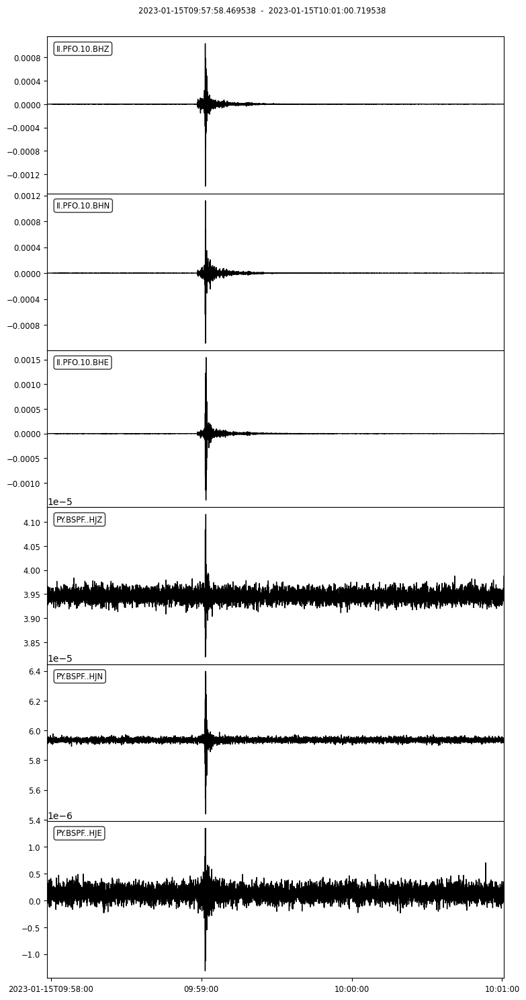


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230115T095858_raw.png ...

   -> Done

 -> 33 2023-01-15T09:58:58.469538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJN | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJZ | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJN  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJZ  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
II.PFO.10.BHN | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples
II.PFO.10.BHE | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples
II.PFO.10.BHZ | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJN  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJZ  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
II.PFO.10.BHN | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples
II.PFO.10.BHE | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples
II.PFO.10.BHZ | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJN  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
PY.BSPF..HJZ  | 2023-01-15T09:57:58.473100Z - 2023-01-15T10:01:00.698100Z | 40.0 Hz, 7290 samples
II.PFO.10.BHN | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples
II.PFO.10.BHE | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples
II.PFO.10.BHZ | 2023-01-15T09:57:58.469538Z - 2023-01-15T10:01:00.719538Z | 40.0 Hz, 7291 samples

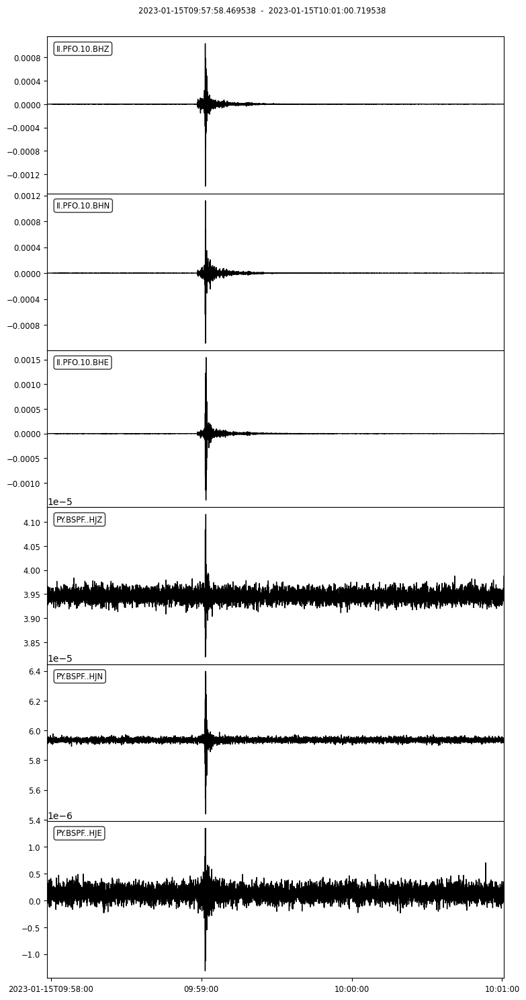


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230115T095858_raw.png ...

   -> Done

 -> 34 2023-01-18T18:44:44.019538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-18T18:43:44.023100Z - 2023-01-18T18:46:45.773100Z | 40.0 Hz, 7271 samples
PY.BSPF..HJN | 2023-01-18T18:43:44.023100Z - 2023-01-18T18:46:45.773100Z | 40.0 Hz, 7271 samples
PY.BSPF..HJZ | 2023-01-18T18:43:44.023100Z - 2023-01-18T18:46:45.773100Z | 40.0 Hz, 7271 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-18T18:43:44.023100Z - 2023-01-18T18:46:45.773100Z | 40.0 Hz, 7271 samples
PY.BSPF..HJN  | 2023-01-18T18:43:44.023100Z - 2023-01-18T18:46:45.773100Z | 40.0 Hz, 7271 samples
PY.BSPF..HJZ  | 2023-01-18T18:43:44.023100Z - 2023-01-18T18:46:45.773100Z | 40.0 Hz, 7271 samples
II.PFO.10.BHN | 2023-01-18T18:43:44.019538Z - 2023-01-18T18:46:45.794538Z | 40.0 Hz, 7272 samples
II.PFO.10.BHE | 2023-01-18T18:43:44.019538Z - 2023-01-18T18:46:45.794538Z | 40.0 Hz, 7272 samples
II.PFO.10.BHZ | 2023-01-18T18:43:44.019538Z - 2023-01-18T18:46:45.794538Z | 40.0 Hz, 7272 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-18T18:43:44.023100Z - 2023-01-18T18:46:45.773100Z | 40.0 Hz, 7271 samples
PY.BSPF..HJN  | 2023-01-18T18:43:44.023100Z - 2023-01-18T18:46:45.773100Z | 40.0 Hz, 7271 samples
PY.BSPF..HJZ  | 2023-01-18T18:43:44.023100Z - 2023-01-18T18:46:45.773100Z | 40.0 Hz, 7271 samples
II.PFO.10.BHN | 2023-01-18T18:43:44.019538Z - 2023-01-18T18:46:45.794538Z | 40.0 Hz, 7272 samples
II.PFO.10.BHE | 2023-01-18T18:43:44.019538Z - 2023-01-18T18:46:45.794538Z | 40.0 Hz, 7272 samples
II.PFO.10.BHZ | 2023-01-18T18:43:44.019538Z - 2023-01-18T18:46:45.794538Z | 40.0 Hz, 7272 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-18T18:43:44.023100Z - 2023-01-18T18:46:45.773100Z | 40.0 Hz, 7271 samples
PY.BSPF..HJN  | 2023-01-18T18:43:44.023100Z - 2023-01-18T18:46:45.773100Z | 40.0 Hz, 7271 samples
PY.BSPF..HJZ  | 2023-01-18T18:43:44.023100Z - 2023-01-18T18:46:45.773100Z | 40.0 Hz, 7271 samples
II.PFO.10.BHN | 2023-01-18T18:43:44.019538Z - 2023-01-18T18:46:45.794538Z | 40.0 Hz, 7272 samples
II.PFO.10.BHE | 2023-01-18T18:43:44.019538Z - 2023-01-18T18:46:45.794538Z | 40.0 Hz, 7272 samples
II.PFO.10.BHZ | 2023-01-18T18:43:44.019538Z - 2023-01-18T18:46:45.794538Z | 40.0 Hz, 7272 samples

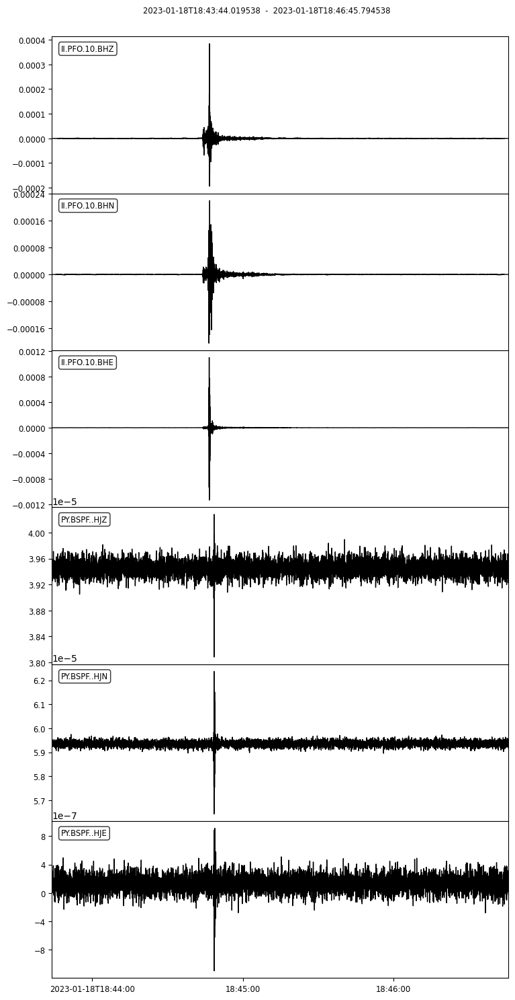


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230118T184444_raw.png ...

   -> Done

 -> 35 2023-01-20T22:36:58.619538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-20T22:35:58.623100Z - 2023-01-20T22:39:00.398100Z | 40.0 Hz, 7272 samples
PY.BSPF..HJN | 2023-01-20T22:35:58.623100Z - 2023-01-20T22:39:00.398100Z | 40.0 Hz, 7272 samples
PY.BSPF..HJZ | 2023-01-20T22:35:58.623100Z - 2023-01-20T22:39:00.398100Z | 40.0 Hz, 7272 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-20T22:35:58.623100Z - 2023-01-20T22:39:00.398100Z | 40.0 Hz, 7272 samples
PY.BSPF..HJN  | 2023-01-20T22:35:58.623100Z - 2023-01-20T22:39:00.398100Z | 40.0 Hz, 7272 samples
PY.BSPF..HJZ  | 2023-01-20T22:35:58.623100Z - 2023-01-20T22:39:00.398100Z | 40.0 Hz, 7272 samples
II.PFO.10.BHN | 2023-01-20T22:35:58.619538Z - 2023-01-20T22:39:00.419538Z | 40.0 Hz, 7273 samples
II.PFO.10.BHE | 2023-01-20T22:35:58.619538Z - 2023-01-20T22:39:00.419538Z | 40.0 Hz, 7273 samples
II.PFO.10.BHZ | 2023-01-20T22:35:58.619538Z - 2023-01-20T22:39:00.419538Z | 40.0 Hz, 7273 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-20T22:35:58.623100Z - 2023-01-20T22:39:00.398100Z | 40.0 Hz, 7272 samples
PY.BSPF..HJN  | 2023-01-20T22:35:58.623100Z - 2023-01-20T22:39:00.398100Z | 40.0 Hz, 7272 samples
PY.BSPF..HJZ  | 2023-01-20T22:35:58.623100Z - 2023-01-20T22:39:00.398100Z | 40.0 Hz, 7272 samples
II.PFO.10.BHN | 2023-01-20T22:35:58.619538Z - 2023-01-20T22:39:00.419538Z | 40.0 Hz, 7273 samples
II.PFO.10.BHE | 2023-01-20T22:35:58.619538Z - 2023-01-20T22:39:00.419538Z | 40.0 Hz, 7273 samples
II.PFO.10.BHZ | 2023-01-20T22:35:58.619538Z - 2023-01-20T22:39:00.419538Z | 40.0 Hz, 7273 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-20T22:35:58.623100Z - 2023-01-20T22:39:00.398100Z | 40.0 Hz, 7272 samples
PY.BSPF..HJN  | 2023-01-20T22:35:58.623100Z - 2023-01-20T22:39:00.398100Z | 40.0 Hz, 7272 samples
PY.BSPF..HJZ  | 2023-01-20T22:35:58.623100Z - 2023-01-20T22:39:00.398100Z | 40.0 Hz, 7272 samples
II.PFO.10.BHN | 2023-01-20T22:35:58.619538Z - 2023-01-20T22:39:00.419538Z | 40.0 Hz, 7273 samples
II.PFO.10.BHE | 2023-01-20T22:35:58.619538Z - 2023-01-20T22:39:00.419538Z | 40.0 Hz, 7273 samples
II.PFO.10.BHZ | 2023-01-20T22:35:58.619538Z - 2023-01-20T22:39:00.419538Z | 40.0 Hz, 7273 samples

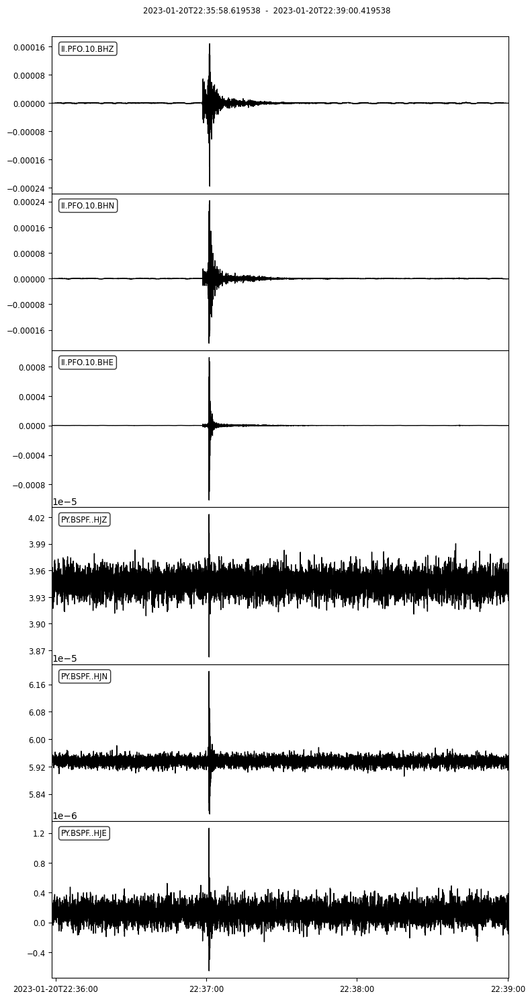


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230120T223658_raw.png ...

   -> Done

 -> 36 2023-01-21T12:05:57.369538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-21T12:04:57.373000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7336 samples
PY.BSPF..HJN | 2023-01-21T12:04:57.373000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7336 samples
PY.BSPF..HJZ | 2023-01-21T12:04:57.373000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7336 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-21T12:04:57.373000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7336 samples
PY.BSPF..HJN  | 2023-01-21T12:04:57.373000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7336 samples
PY.BSPF..HJZ  | 2023-01-21T12:04:57.373000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7336 samples
II.PFO.10.BHN | 2023-01-21T12:04:57.369538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7337 samples
II.PFO.10.BHE | 2023-01-21T12:04:57.369538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7337 samples
II.PFO.10.BHZ | 2023-01-21T12:04:57.369538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7337 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-21T12:04:57.373000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7336 samples
PY.BSPF..HJN  | 2023-01-21T12:04:57.373000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7336 samples
PY.BSPF..HJZ  | 2023-01-21T12:04:57.373000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7336 samples
II.PFO.10.BHN | 2023-01-21T12:04:57.369538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7337 samples
II.PFO.10.BHE | 2023-01-21T12:04:57.369538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7337 samples
II.PFO.10.BHZ | 2023-01-21T12:04:57.369538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7337 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-21T12:04:57.373000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7336 samples
PY.BSPF..HJN  | 2023-01-21T12:04:57.373000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7336 samples
PY.BSPF..HJZ  | 2023-01-21T12:04:57.373000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7336 samples
II.PFO.10.BHN | 2023-01-21T12:04:57.369538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7337 samples
II.PFO.10.BHE | 2023-01-21T12:04:57.369538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7337 samples
II.PFO.10.BHZ | 2023-01-21T12:04:57.369538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7337 samples

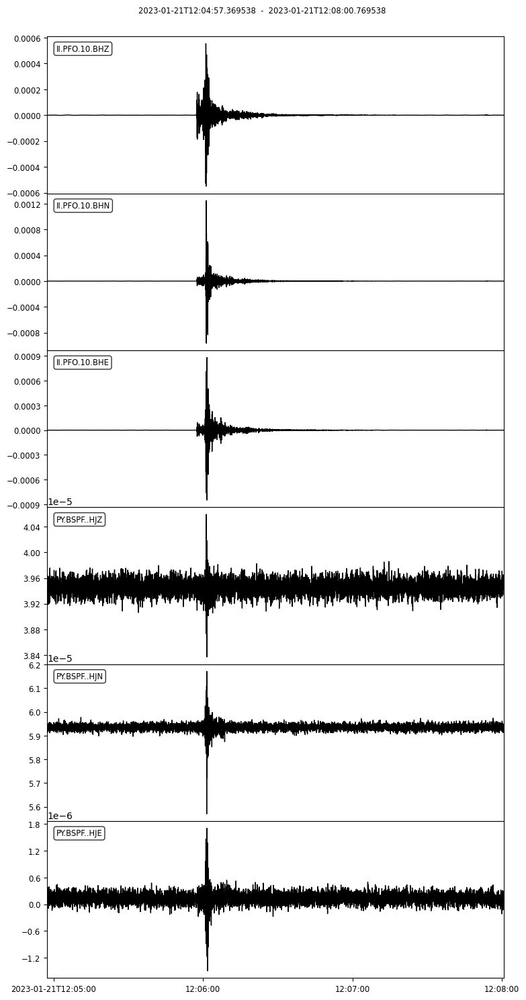


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230121T120557_raw.png ...

   -> Done

 -> 37 2023-01-21T12:05:57.344538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-21T12:04:57.348000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7337 samples
PY.BSPF..HJN | 2023-01-21T12:04:57.348000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7337 samples
PY.BSPF..HJZ | 2023-01-21T12:04:57.348000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7337 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-21T12:04:57.348000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7337 samples
PY.BSPF..HJN  | 2023-01-21T12:04:57.348000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7337 samples
PY.BSPF..HJZ  | 2023-01-21T12:04:57.348000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7337 samples
II.PFO.10.BHN | 2023-01-21T12:04:57.344538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7338 samples
II.PFO.10.BHE | 2023-01-21T12:04:57.344538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7338 samples
II.PFO.10.BHZ | 2023-01-21T12:04:57.344538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7338 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-21T12:04:57.348000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7337 samples
PY.BSPF..HJN  | 2023-01-21T12:04:57.348000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7337 samples
PY.BSPF..HJZ  | 2023-01-21T12:04:57.348000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7337 samples
II.PFO.10.BHN | 2023-01-21T12:04:57.344538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7338 samples
II.PFO.10.BHE | 2023-01-21T12:04:57.344538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7338 samples
II.PFO.10.BHZ | 2023-01-21T12:04:57.344538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7338 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-21T12:04:57.348000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7337 samples
PY.BSPF..HJN  | 2023-01-21T12:04:57.348000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7337 samples
PY.BSPF..HJZ  | 2023-01-21T12:04:57.348000Z - 2023-01-21T12:08:00.748000Z | 40.0 Hz, 7337 samples
II.PFO.10.BHN | 2023-01-21T12:04:57.344538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7338 samples
II.PFO.10.BHE | 2023-01-21T12:04:57.344538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7338 samples
II.PFO.10.BHZ | 2023-01-21T12:04:57.344538Z - 2023-01-21T12:08:00.769538Z | 40.0 Hz, 7338 samples

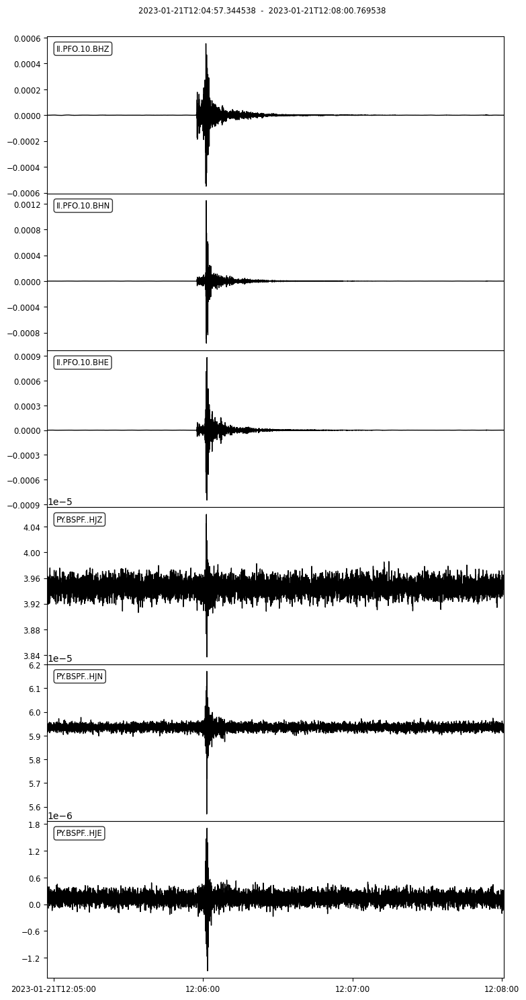


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230121T120557_raw.png ...

   -> Done

 -> 38 2023-01-23T02:08:00.892900Z 
 -> sensitivity removed!
 -> response removed!


6 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-23T02:07:00.894400Z - 2023-01-23T02:07:58.844400Z | 40.0 Hz, 2319 samples
PY.BSPF..HJE | 2023-01-23T02:08:00.867900Z - 2023-01-23T02:12:09.942900Z | 40.0 Hz, 9964 samples
PY.BSPF..HJN | 2023-01-23T02:07:00.894400Z - 2023-01-23T02:07:58.844400Z | 40.0 Hz, 2319 samples
PY.BSPF..HJN | 2023-01-23T02:08:00.867900Z - 2023-01-23T02:12:09.942900Z | 40.0 Hz, 9964 samples
PY.BSPF..HJZ | 2023-01-23T02:07:00.894400Z - 2023-01-23T02:07:58.844400Z | 40.0 Hz, 2319 samples
PY.BSPF..HJZ | 2023-01-23T02:08:00.867900Z - 2023-01-23T02:12:09.942900Z | 40.0 Hz, 9964 samples

9 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-23T02:07:00.894400Z - 2023-01-23T02:07:58.844400Z | 40.0 Hz, 2319 samples
PY.BSPF..HJE  | 2023-01-23T02:08:00.867900Z - 2023-01-23T02:12:09.942900Z | 40.0 Hz, 9964 samples
PY.BSPF..HJN  | 2023-01-23T02:07:00.894400Z - 2023-01-23T02:07:58.844400Z | 40.0 Hz, 2319 samples
PY.BSPF..HJN  | 2023-01-23T02:08:00.867900Z - 2023-01-23T02:12:09.942900Z | 40.0 Hz, 9964 samples
PY.BSPF..HJZ  | 2023-01-23T02:07:00.894400Z - 2023-01-23T02:07:58.844400Z | 40.0 Hz, 2319 samples
PY.BSPF..HJZ  | 2023-01-23T02:08:00.867900Z - 2023-01-23T02:12:09.942900Z | 40.0 Hz, 9964 samples
II.PFO.10.BHN | 2023-01-23T02:07:00.894538Z - 2023-01-23T02:12:09.944538Z | 40.0 Hz, 12363 samples
II.PFO.10.BHE | 2023-01-23T02:07:00.894538Z - 2023-01-23T02:12:09.944538Z | 40.0 Hz, 12363 samples
II.PFO.10.BHZ | 2023-01-23T02:07:00.894538Z - 2023-01-23T02:12:09.944538Z | 40.0 Hz, 12363 samples

9 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-23T02:07:00.894400Z - 2023-01-23T02:07:58.844400Z | 40.0 Hz, 2319 samples
PY.BSPF..HJE  | 2023-01-23T02:08:00.867900Z - 2023-01-23T02:12:09.942900Z | 40.0 Hz, 9964 samples
PY.BSPF..HJN  | 2023-01-23T02:07:00.894400Z - 2023-01-23T02:07:58.844400Z | 40.0 Hz, 2319 samples
PY.BSPF..HJN  | 2023-01-23T02:08:00.867900Z - 2023-01-23T02:12:09.942900Z | 40.0 Hz, 9964 samples
PY.BSPF..HJZ  | 2023-01-23T02:07:00.894400Z - 2023-01-23T02:07:58.844400Z | 40.0 Hz, 2319 samples
PY.BSPF..HJZ  | 2023-01-23T02:08:00.867900Z - 2023-01-23T02:12:09.942900Z | 40.0 Hz, 9964 samples
II.PFO.10.BHN | 2023-01-23T02:07:00.894538Z - 2023-01-23T02:12:09.944538Z | 40.0 Hz, 12363 samples
II.PFO.10.BHE | 2023-01-23T02:07:00.894538Z - 2023-01-23T02:12:09.944538Z | 40.0 Hz, 12363 samples
II.PFO.10.BHZ | 2023-01-23T02:07:00.894538Z - 2023-01-23T02:12:09.944538Z | 40.0 Hz, 12363 samples

9 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-23T02:07:00.894400Z - 2023-01-23T02:07:58.844400Z | 40.0 Hz, 2319 samples
PY.BSPF..HJE  | 2023-01-23T02:08:00.867900Z - 2023-01-23T02:12:09.942900Z | 40.0 Hz, 9964 samples
PY.BSPF..HJN  | 2023-01-23T02:07:00.894400Z - 2023-01-23T02:07:58.844400Z | 40.0 Hz, 2319 samples
PY.BSPF..HJN  | 2023-01-23T02:08:00.867900Z - 2023-01-23T02:12:09.942900Z | 40.0 Hz, 9964 samples
PY.BSPF..HJZ  | 2023-01-23T02:07:00.894400Z - 2023-01-23T02:07:58.844400Z | 40.0 Hz, 2319 samples
PY.BSPF..HJZ  | 2023-01-23T02:08:00.867900Z - 2023-01-23T02:12:09.942900Z | 40.0 Hz, 9964 samples
II.PFO.10.BHN | 2023-01-23T02:07:00.894538Z - 2023-01-23T02:12:09.944538Z | 40.0 Hz, 12363 samples
II.PFO.10.BHE | 2023-01-23T02:07:00.894538Z - 2023-01-23T02:12:09.944538Z | 40.0 Hz, 12363 samples
II.PFO.10.BHZ | 2023-01-23T02:07:00.894538Z - 2023-01-23T02:12:09.944538Z | 40.0 Hz, 12363 samples

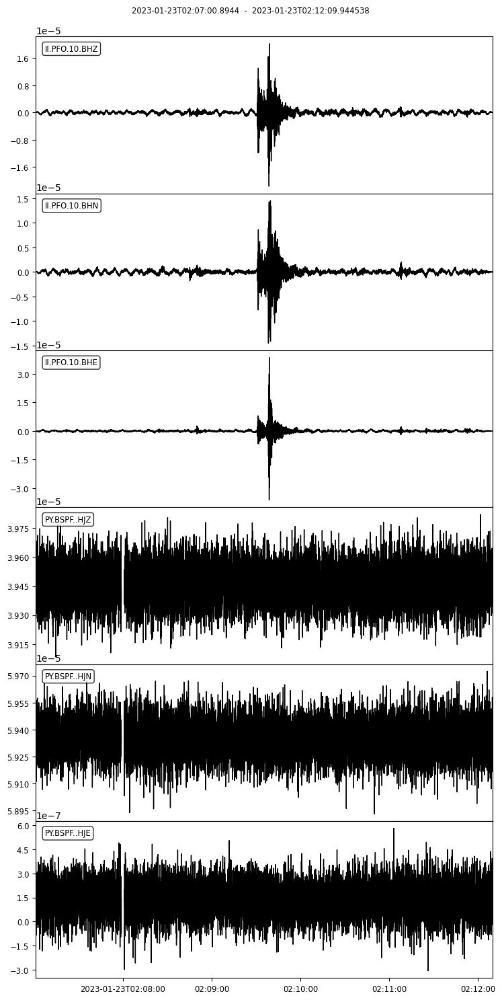


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230123T020800_raw.png ...

   -> Done

 -> 39 2023-01-28T05:28:40.444539Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-01-28T05:27:40.448300Z - 2023-01-28T05:30:44.248300Z | 40.0 Hz, 7353 samples
PY.BSPF..HJN | 2023-01-28T05:27:40.448300Z - 2023-01-28T05:30:44.248300Z | 40.0 Hz, 7353 samples
PY.BSPF..HJZ | 2023-01-28T05:27:40.448300Z - 2023-01-28T05:30:44.248300Z | 40.0 Hz, 7353 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-28T05:27:40.448300Z - 2023-01-28T05:30:44.248300Z | 40.0 Hz, 7353 samples
PY.BSPF..HJN  | 2023-01-28T05:27:40.448300Z - 2023-01-28T05:30:44.248300Z | 40.0 Hz, 7353 samples
PY.BSPF..HJZ  | 2023-01-28T05:27:40.448300Z - 2023-01-28T05:30:44.248300Z | 40.0 Hz, 7353 samples
II.PFO.10.BHN | 2023-01-28T05:27:40.444539Z - 2023-01-28T05:30:44.269539Z | 40.0 Hz, 7354 samples
II.PFO.10.BHE | 2023-01-28T05:27:40.444539Z - 2023-01-28T05:30:44.269539Z | 40.0 Hz, 7354 samples
II.PFO.10.BHZ | 2023-01-28T05:27:40.444539Z - 2023-01-28T05:30:44.269539Z | 40.0 Hz, 7354 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-28T05:27:40.448300Z - 2023-01-28T05:30:44.248300Z | 40.0 Hz, 7353 samples
PY.BSPF..HJN  | 2023-01-28T05:27:40.448300Z - 2023-01-28T05:30:44.248300Z | 40.0 Hz, 7353 samples
PY.BSPF..HJZ  | 2023-01-28T05:27:40.448300Z - 2023-01-28T05:30:44.248300Z | 40.0 Hz, 7353 samples
II.PFO.10.BHN | 2023-01-28T05:27:40.444539Z - 2023-01-28T05:30:44.269539Z | 40.0 Hz, 7354 samples
II.PFO.10.BHE | 2023-01-28T05:27:40.444539Z - 2023-01-28T05:30:44.269539Z | 40.0 Hz, 7354 samples
II.PFO.10.BHZ | 2023-01-28T05:27:40.444539Z - 2023-01-28T05:30:44.269539Z | 40.0 Hz, 7354 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-28T05:27:40.448300Z - 2023-01-28T05:30:44.248300Z | 40.0 Hz, 7353 samples
PY.BSPF..HJN  | 2023-01-28T05:27:40.448300Z - 2023-01-28T05:30:44.248300Z | 40.0 Hz, 7353 samples
PY.BSPF..HJZ  | 2023-01-28T05:27:40.448300Z - 2023-01-28T05:30:44.248300Z | 40.0 Hz, 7353 samples
II.PFO.10.BHN | 2023-01-28T05:27:40.444539Z - 2023-01-28T05:30:44.269539Z | 40.0 Hz, 7354 samples
II.PFO.10.BHE | 2023-01-28T05:27:40.444539Z - 2023-01-28T05:30:44.269539Z | 40.0 Hz, 7354 samples
II.PFO.10.BHZ | 2023-01-28T05:27:40.444539Z - 2023-01-28T05:30:44.269539Z | 40.0 Hz, 7354 samples

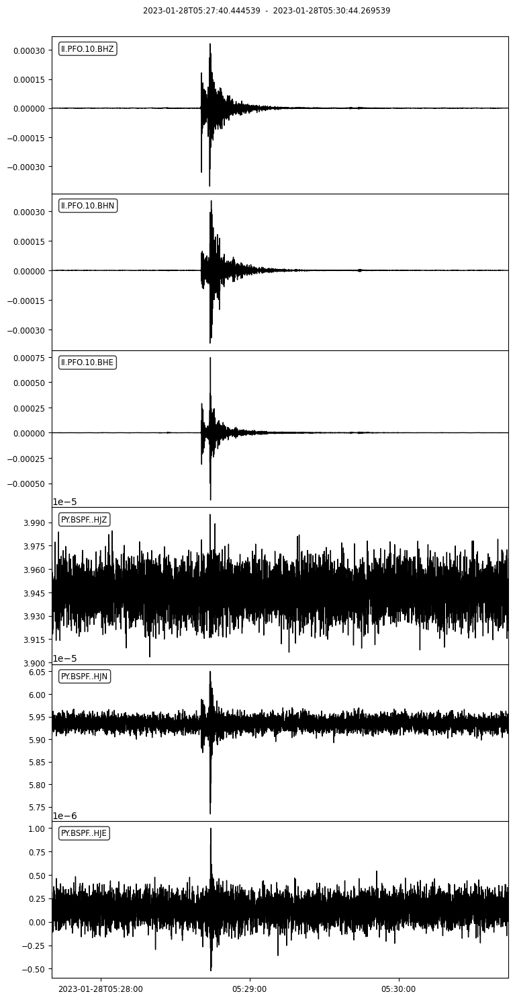


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230128T052840_raw.png ...

   -> Done

 -> 40 2023-02-01T09:05:08.219538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-02-01T09:04:08.222300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7564 samples
PY.BSPF..HJN | 2023-02-01T09:04:08.222300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7564 samples
PY.BSPF..HJZ | 2023-02-01T09:04:08.222300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7564 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-01T09:04:08.222300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7564 samples
PY.BSPF..HJN  | 2023-02-01T09:04:08.222300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7564 samples
PY.BSPF..HJZ  | 2023-02-01T09:04:08.222300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7564 samples
II.PFO.10.BHN | 2023-02-01T09:04:08.219538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7565 samples
II.PFO.10.BHE | 2023-02-01T09:04:08.219538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7565 samples
II.PFO.10.BHZ | 2023-02-01T09:04:08.219538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7565 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-01T09:04:08.222300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7564 samples
PY.BSPF..HJN  | 2023-02-01T09:04:08.222300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7564 samples
PY.BSPF..HJZ  | 2023-02-01T09:04:08.222300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7564 samples
II.PFO.10.BHN | 2023-02-01T09:04:08.219538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7565 samples
II.PFO.10.BHE | 2023-02-01T09:04:08.219538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7565 samples
II.PFO.10.BHZ | 2023-02-01T09:04:08.219538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7565 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-01T09:04:08.222300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7564 samples
PY.BSPF..HJN  | 2023-02-01T09:04:08.222300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7564 samples
PY.BSPF..HJZ  | 2023-02-01T09:04:08.222300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7564 samples
II.PFO.10.BHN | 2023-02-01T09:04:08.219538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7565 samples
II.PFO.10.BHE | 2023-02-01T09:04:08.219538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7565 samples
II.PFO.10.BHZ | 2023-02-01T09:04:08.219538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7565 samples

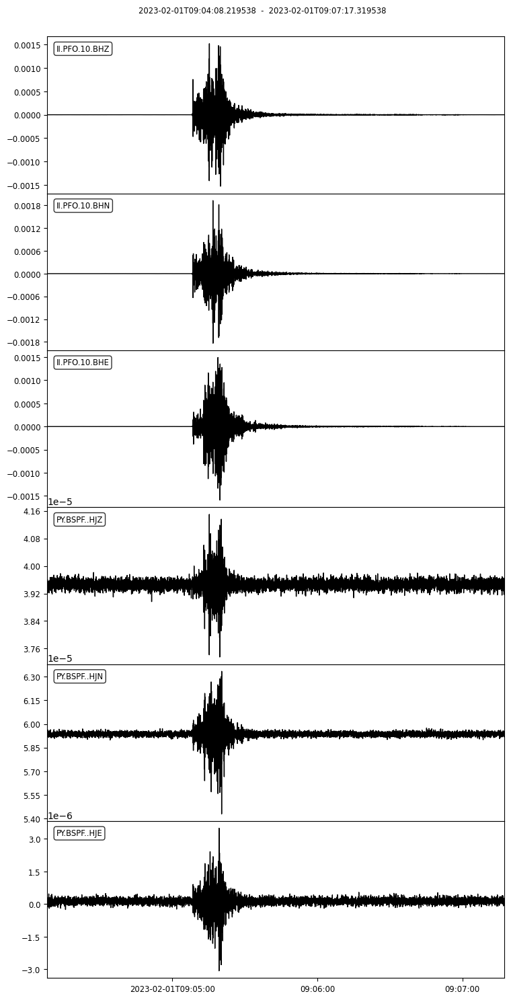


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230201T090508_raw.png ...

   -> Done

 -> 41 2023-02-01T09:05:08.194538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-02-01T09:04:08.197300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7565 samples
PY.BSPF..HJN | 2023-02-01T09:04:08.197300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7565 samples
PY.BSPF..HJZ | 2023-02-01T09:04:08.197300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7565 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-01T09:04:08.197300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7565 samples
PY.BSPF..HJN  | 2023-02-01T09:04:08.197300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7565 samples
PY.BSPF..HJZ  | 2023-02-01T09:04:08.197300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7565 samples
II.PFO.10.BHN | 2023-02-01T09:04:08.194538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7566 samples
II.PFO.10.BHE | 2023-02-01T09:04:08.194538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7566 samples
II.PFO.10.BHZ | 2023-02-01T09:04:08.194538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7566 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-01T09:04:08.197300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7565 samples
PY.BSPF..HJN  | 2023-02-01T09:04:08.197300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7565 samples
PY.BSPF..HJZ  | 2023-02-01T09:04:08.197300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7565 samples
II.PFO.10.BHN | 2023-02-01T09:04:08.194538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7566 samples
II.PFO.10.BHE | 2023-02-01T09:04:08.194538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7566 samples
II.PFO.10.BHZ | 2023-02-01T09:04:08.194538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7566 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-01T09:04:08.197300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7565 samples
PY.BSPF..HJN  | 2023-02-01T09:04:08.197300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7565 samples
PY.BSPF..HJZ  | 2023-02-01T09:04:08.197300Z - 2023-02-01T09:07:17.297300Z | 40.0 Hz, 7565 samples
II.PFO.10.BHN | 2023-02-01T09:04:08.194538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7566 samples
II.PFO.10.BHE | 2023-02-01T09:04:08.194538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7566 samples
II.PFO.10.BHZ | 2023-02-01T09:04:08.194538Z - 2023-02-01T09:07:17.319538Z | 40.0 Hz, 7566 samples

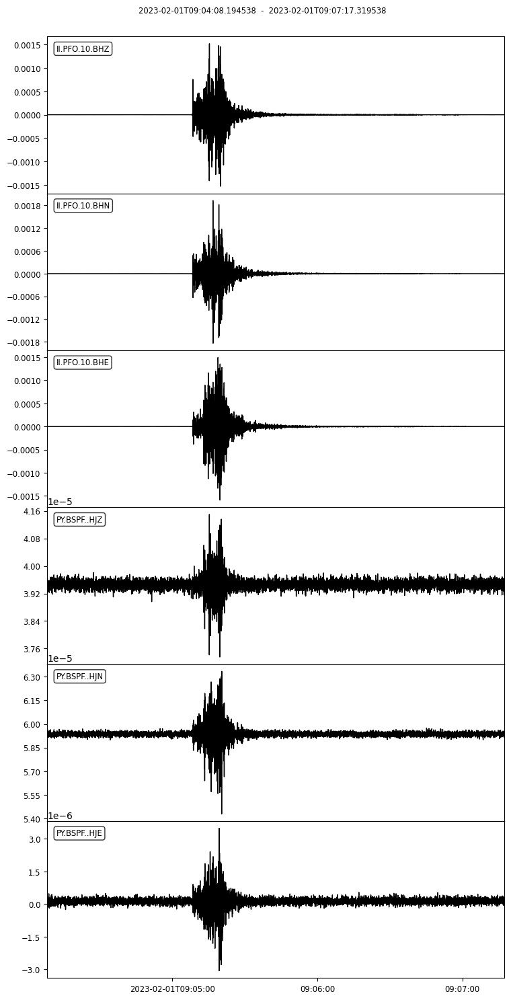


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230201T090508_raw.png ...

   -> Done

 -> 42 2023-02-04T05:59:20.044538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJN | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJZ | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJN  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJZ  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
II.PFO.10.BHN | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples
II.PFO.10.BHE | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples
II.PFO.10.BHZ | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJN  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJZ  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
II.PFO.10.BHN | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples
II.PFO.10.BHE | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples
II.PFO.10.BHZ | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJN  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJZ  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
II.PFO.10.BHN | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples
II.PFO.10.BHE | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples
II.PFO.10.BHZ | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples

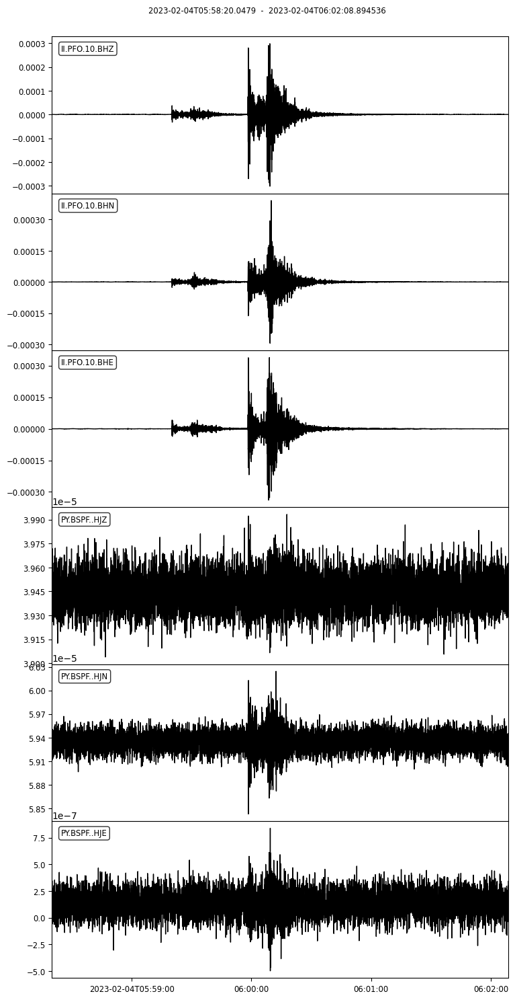


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230204T055920_raw.png ...

   -> Done

 -> 43 2023-02-04T05:59:20.044538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJN | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJZ | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJN  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJZ  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
II.PFO.10.BHN | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples
II.PFO.10.BHE | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples
II.PFO.10.BHZ | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJN  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJZ  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
II.PFO.10.BHN | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples
II.PFO.10.BHE | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples
II.PFO.10.BHZ | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJN  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
PY.BSPF..HJZ  | 2023-02-04T05:58:20.047900Z - 2023-02-04T06:02:08.872900Z | 40.0 Hz, 9154 samples
II.PFO.10.BHN | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples
II.PFO.10.BHE | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples
II.PFO.10.BHZ | 2023-02-04T05:58:20.069536Z - 2023-02-04T06:02:08.894536Z | 40.0 Hz, 9154 samples

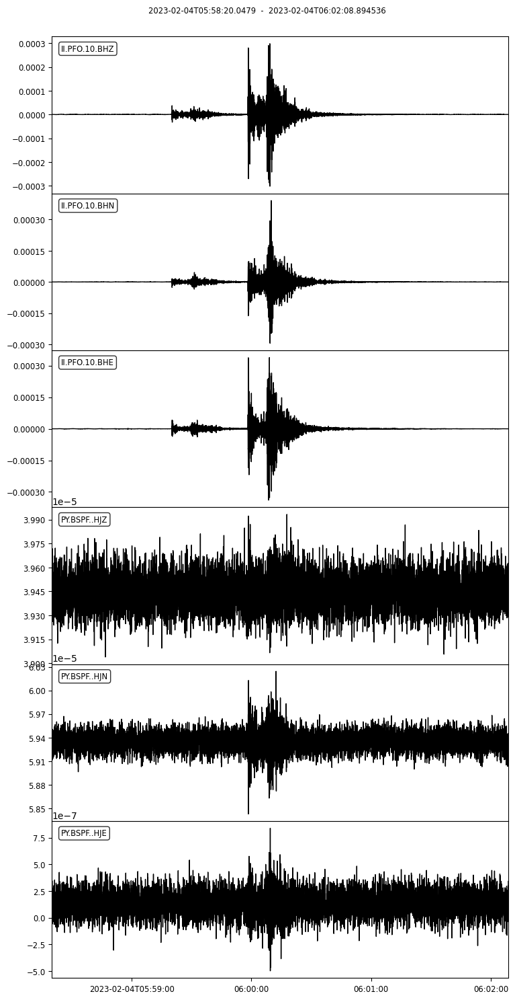


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230204T055920_raw.png ...

   -> Done

 -> 44 2023-02-08T17:58:34.744538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-02-08T17:57:34.747100Z - 2023-02-08T18:00:36.097100Z | 40.0 Hz, 7255 samples
PY.BSPF..HJN | 2023-02-08T17:57:34.747100Z - 2023-02-08T18:00:36.097100Z | 40.0 Hz, 7255 samples
PY.BSPF..HJZ | 2023-02-08T17:57:34.747000Z - 2023-02-08T18:00:36.097000Z | 40.0 Hz, 7255 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-08T17:57:34.747100Z - 2023-02-08T18:00:36.097100Z | 40.0 Hz, 7255 samples
PY.BSPF..HJN  | 2023-02-08T17:57:34.747100Z - 2023-02-08T18:00:36.097100Z | 40.0 Hz, 7255 samples
PY.BSPF..HJZ  | 2023-02-08T17:57:34.747000Z - 2023-02-08T18:00:36.097000Z | 40.0 Hz, 7255 samples
II.PFO.10.BHN | 2023-02-08T17:57:34.744538Z - 2023-02-08T18:00:36.119538Z | 40.0 Hz, 7256 samples
II.PFO.10.BHE | 2023-02-08T17:57:34.744538Z - 2023-02-08T18:00:36.119538Z | 40.0 Hz, 7256 samples
II.PFO.10.BHZ | 2023-02-08T17:57:34.744538Z - 2023-02-08T18:00:36.119538Z | 40.0 Hz, 7256 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-08T17:57:34.747100Z - 2023-02-08T18:00:36.097100Z | 40.0 Hz, 7255 samples
PY.BSPF..HJN  | 2023-02-08T17:57:34.747100Z - 2023-02-08T18:00:36.097100Z | 40.0 Hz, 7255 samples
PY.BSPF..HJZ  | 2023-02-08T17:57:34.747000Z - 2023-02-08T18:00:36.097000Z | 40.0 Hz, 7255 samples
II.PFO.10.BHN | 2023-02-08T17:57:34.744538Z - 2023-02-08T18:00:36.119538Z | 40.0 Hz, 7256 samples
II.PFO.10.BHE | 2023-02-08T17:57:34.744538Z - 2023-02-08T18:00:36.119538Z | 40.0 Hz, 7256 samples
II.PFO.10.BHZ | 2023-02-08T17:57:34.744538Z - 2023-02-08T18:00:36.119538Z | 40.0 Hz, 7256 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-08T17:57:34.747100Z - 2023-02-08T18:00:36.097100Z | 40.0 Hz, 7255 samples
PY.BSPF..HJN  | 2023-02-08T17:57:34.747100Z - 2023-02-08T18:00:36.097100Z | 40.0 Hz, 7255 samples
PY.BSPF..HJZ  | 2023-02-08T17:57:34.747000Z - 2023-02-08T18:00:36.097000Z | 40.0 Hz, 7255 samples
II.PFO.10.BHN | 2023-02-08T17:57:34.744538Z - 2023-02-08T18:00:36.119538Z | 40.0 Hz, 7256 samples
II.PFO.10.BHE | 2023-02-08T17:57:34.744538Z - 2023-02-08T18:00:36.119538Z | 40.0 Hz, 7256 samples
II.PFO.10.BHZ | 2023-02-08T17:57:34.744538Z - 2023-02-08T18:00:36.119538Z | 40.0 Hz, 7256 samples

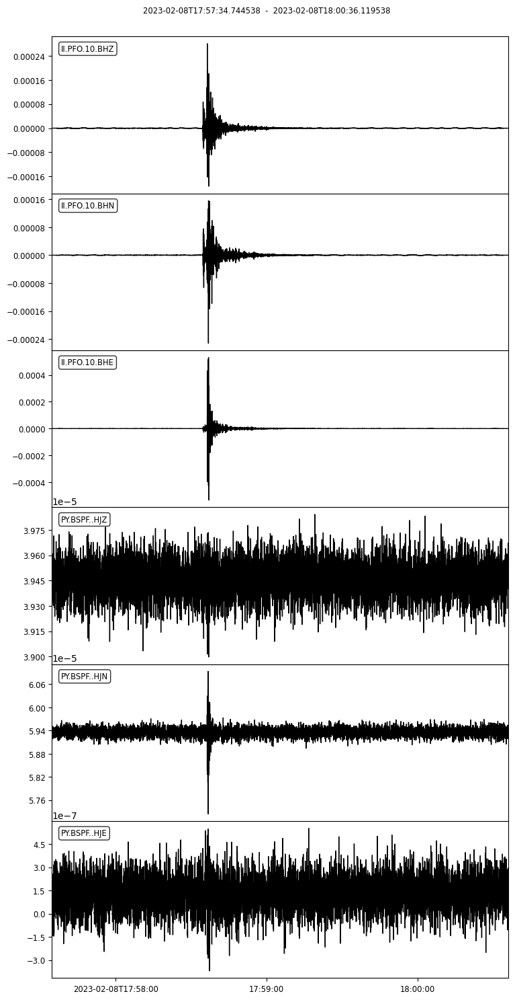


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230208T175834_raw.png ...

   -> Done

 -> 45 2023-02-08T17:58:34.644538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-02-08T17:57:34.647100Z - 2023-02-08T18:00:36.522100Z | 40.0 Hz, 7276 samples
PY.BSPF..HJN | 2023-02-08T17:57:34.647100Z - 2023-02-08T18:00:36.522100Z | 40.0 Hz, 7276 samples
PY.BSPF..HJZ | 2023-02-08T17:57:34.647000Z - 2023-02-08T18:00:36.522000Z | 40.0 Hz, 7276 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-08T17:57:34.647100Z - 2023-02-08T18:00:36.522100Z | 40.0 Hz, 7276 samples
PY.BSPF..HJN  | 2023-02-08T17:57:34.647100Z - 2023-02-08T18:00:36.522100Z | 40.0 Hz, 7276 samples
PY.BSPF..HJZ  | 2023-02-08T17:57:34.647000Z - 2023-02-08T18:00:36.522000Z | 40.0 Hz, 7276 samples
II.PFO.10.BHN | 2023-02-08T17:57:34.644538Z - 2023-02-08T18:00:36.544538Z | 40.0 Hz, 7277 samples
II.PFO.10.BHE | 2023-02-08T17:57:34.644538Z - 2023-02-08T18:00:36.544538Z | 40.0 Hz, 7277 samples
II.PFO.10.BHZ | 2023-02-08T17:57:34.644538Z - 2023-02-08T18:00:36.544538Z | 40.0 Hz, 7277 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-08T17:57:34.647100Z - 2023-02-08T18:00:36.522100Z | 40.0 Hz, 7276 samples
PY.BSPF..HJN  | 2023-02-08T17:57:34.647100Z - 2023-02-08T18:00:36.522100Z | 40.0 Hz, 7276 samples
PY.BSPF..HJZ  | 2023-02-08T17:57:34.647000Z - 2023-02-08T18:00:36.522000Z | 40.0 Hz, 7276 samples
II.PFO.10.BHN | 2023-02-08T17:57:34.644538Z - 2023-02-08T18:00:36.544538Z | 40.0 Hz, 7277 samples
II.PFO.10.BHE | 2023-02-08T17:57:34.644538Z - 2023-02-08T18:00:36.544538Z | 40.0 Hz, 7277 samples
II.PFO.10.BHZ | 2023-02-08T17:57:34.644538Z - 2023-02-08T18:00:36.544538Z | 40.0 Hz, 7277 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-08T17:57:34.647100Z - 2023-02-08T18:00:36.522100Z | 40.0 Hz, 7276 samples
PY.BSPF..HJN  | 2023-02-08T17:57:34.647100Z - 2023-02-08T18:00:36.522100Z | 40.0 Hz, 7276 samples
PY.BSPF..HJZ  | 2023-02-08T17:57:34.647000Z - 2023-02-08T18:00:36.522000Z | 40.0 Hz, 7276 samples
II.PFO.10.BHN | 2023-02-08T17:57:34.644538Z - 2023-02-08T18:00:36.544538Z | 40.0 Hz, 7277 samples
II.PFO.10.BHE | 2023-02-08T17:57:34.644538Z - 2023-02-08T18:00:36.544538Z | 40.0 Hz, 7277 samples
II.PFO.10.BHZ | 2023-02-08T17:57:34.644538Z - 2023-02-08T18:00:36.544538Z | 40.0 Hz, 7277 samples

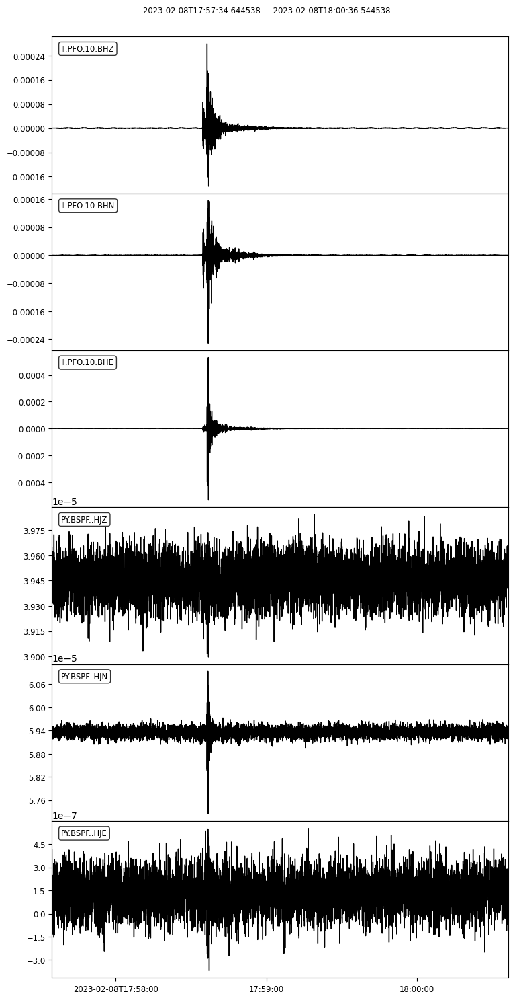


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230208T175834_raw.png ...

   -> Done

 -> 46 2023-02-21T19:28:50.144538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-02-21T19:27:50.147500Z - 2023-02-21T19:30:51.872500Z | 40.0 Hz, 7270 samples
PY.BSPF..HJN | 2023-02-21T19:27:50.147500Z - 2023-02-21T19:30:51.872500Z | 40.0 Hz, 7270 samples
PY.BSPF..HJZ | 2023-02-21T19:27:50.147500Z - 2023-02-21T19:30:51.872500Z | 40.0 Hz, 7270 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-21T19:27:50.147500Z - 2023-02-21T19:30:51.872500Z | 40.0 Hz, 7270 samples
PY.BSPF..HJN  | 2023-02-21T19:27:50.147500Z - 2023-02-21T19:30:51.872500Z | 40.0 Hz, 7270 samples
PY.BSPF..HJZ  | 2023-02-21T19:27:50.147500Z - 2023-02-21T19:30:51.872500Z | 40.0 Hz, 7270 samples
II.PFO.10.BHN | 2023-02-21T19:27:50.144538Z - 2023-02-21T19:30:51.894538Z | 40.0 Hz, 7271 samples
II.PFO.10.BHE | 2023-02-21T19:27:50.144538Z - 2023-02-21T19:30:51.894538Z | 40.0 Hz, 7271 samples
II.PFO.10.BHZ | 2023-02-21T19:27:50.144538Z - 2023-02-21T19:30:51.894538Z | 40.0 Hz, 7271 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-21T19:27:50.147500Z - 2023-02-21T19:30:51.872500Z | 40.0 Hz, 7270 samples
PY.BSPF..HJN  | 2023-02-21T19:27:50.147500Z - 2023-02-21T19:30:51.872500Z | 40.0 Hz, 7270 samples
PY.BSPF..HJZ  | 2023-02-21T19:27:50.147500Z - 2023-02-21T19:30:51.872500Z | 40.0 Hz, 7270 samples
II.PFO.10.BHN | 2023-02-21T19:27:50.144538Z - 2023-02-21T19:30:51.894538Z | 40.0 Hz, 7271 samples
II.PFO.10.BHE | 2023-02-21T19:27:50.144538Z - 2023-02-21T19:30:51.894538Z | 40.0 Hz, 7271 samples
II.PFO.10.BHZ | 2023-02-21T19:27:50.144538Z - 2023-02-21T19:30:51.894538Z | 40.0 Hz, 7271 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-21T19:27:50.147500Z - 2023-02-21T19:30:51.872500Z | 40.0 Hz, 7270 samples
PY.BSPF..HJN  | 2023-02-21T19:27:50.147500Z - 2023-02-21T19:30:51.872500Z | 40.0 Hz, 7270 samples
PY.BSPF..HJZ  | 2023-02-21T19:27:50.147500Z - 2023-02-21T19:30:51.872500Z | 40.0 Hz, 7270 samples
II.PFO.10.BHN | 2023-02-21T19:27:50.144538Z - 2023-02-21T19:30:51.894538Z | 40.0 Hz, 7271 samples
II.PFO.10.BHE | 2023-02-21T19:27:50.144538Z - 2023-02-21T19:30:51.894538Z | 40.0 Hz, 7271 samples
II.PFO.10.BHZ | 2023-02-21T19:27:50.144538Z - 2023-02-21T19:30:51.894538Z | 40.0 Hz, 7271 samples

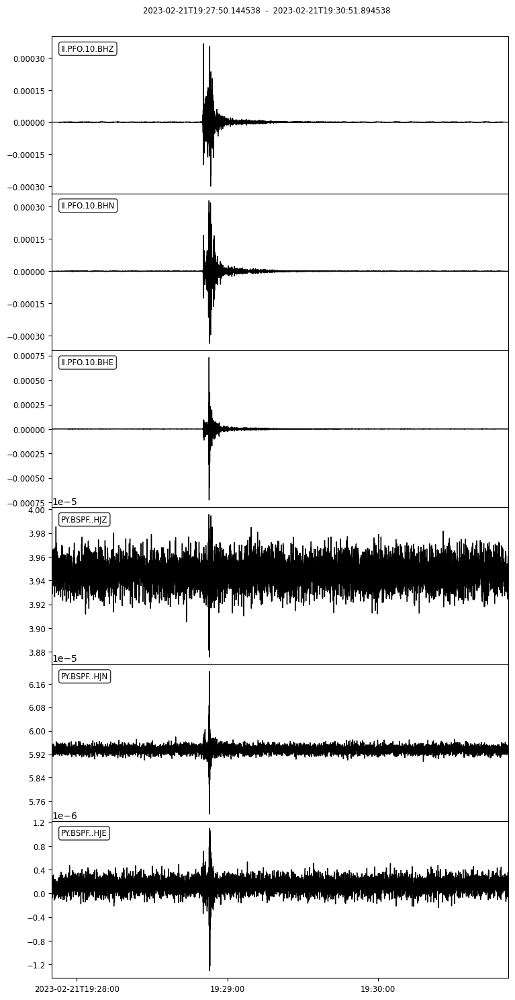


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230221T192850_raw.png ...

   -> Done

 -> 47 2023-02-28T05:02:34.419536Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-02-28T05:01:34.422400Z - 2023-02-28T05:04:36.572400Z | 40.0 Hz, 7287 samples
PY.BSPF..HJN | 2023-02-28T05:01:34.422400Z - 2023-02-28T05:04:36.572400Z | 40.0 Hz, 7287 samples
PY.BSPF..HJZ | 2023-02-28T05:01:34.422400Z - 2023-02-28T05:04:36.572400Z | 40.0 Hz, 7287 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-28T05:01:34.422400Z - 2023-02-28T05:04:36.572400Z | 40.0 Hz, 7287 samples
PY.BSPF..HJN  | 2023-02-28T05:01:34.422400Z - 2023-02-28T05:04:36.572400Z | 40.0 Hz, 7287 samples
PY.BSPF..HJZ  | 2023-02-28T05:01:34.422400Z - 2023-02-28T05:04:36.572400Z | 40.0 Hz, 7287 samples
II.PFO.10.BHN | 2023-02-28T05:01:34.419536Z - 2023-02-28T05:04:36.594536Z | 40.0 Hz, 7288 samples
II.PFO.10.BHE | 2023-02-28T05:01:34.419536Z - 2023-02-28T05:04:36.594536Z | 40.0 Hz, 7288 samples
II.PFO.10.BHZ | 2023-02-28T05:01:34.419538Z - 2023-02-28T05:04:36.569538Z | 40.0 Hz, 7287 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-28T05:01:34.422400Z - 2023-02-28T05:04:36.572400Z | 40.0 Hz, 7287 samples
PY.BSPF..HJN  | 2023-02-28T05:01:34.422400Z - 2023-02-28T05:04:36.572400Z | 40.0 Hz, 7287 samples
PY.BSPF..HJZ  | 2023-02-28T05:01:34.422400Z - 2023-02-28T05:04:36.572400Z | 40.0 Hz, 7287 samples
II.PFO.10.BHN | 2023-02-28T05:01:34.419536Z - 2023-02-28T05:04:36.594536Z | 40.0 Hz, 7288 samples
II.PFO.10.BHE | 2023-02-28T05:01:34.419536Z - 2023-02-28T05:04:36.594536Z | 40.0 Hz, 7288 samples
II.PFO.10.BHZ | 2023-02-28T05:01:34.419538Z - 2023-02-28T05:04:36.569538Z | 40.0 Hz, 7287 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-02-28T05:01:34.422400Z - 2023-02-28T05:04:36.572400Z | 40.0 Hz, 7287 samples
PY.BSPF..HJN  | 2023-02-28T05:01:34.422400Z - 2023-02-28T05:04:36.572400Z | 40.0 Hz, 7287 samples
PY.BSPF..HJZ  | 2023-02-28T05:01:34.422400Z - 2023-02-28T05:04:36.572400Z | 40.0 Hz, 7287 samples
II.PFO.10.BHN | 2023-02-28T05:01:34.419536Z - 2023-02-28T05:04:36.594536Z | 40.0 Hz, 7288 samples
II.PFO.10.BHE | 2023-02-28T05:01:34.419536Z - 2023-02-28T05:04:36.594536Z | 40.0 Hz, 7288 samples
II.PFO.10.BHZ | 2023-02-28T05:01:34.419538Z - 2023-02-28T05:04:36.569538Z | 40.0 Hz, 7287 samples

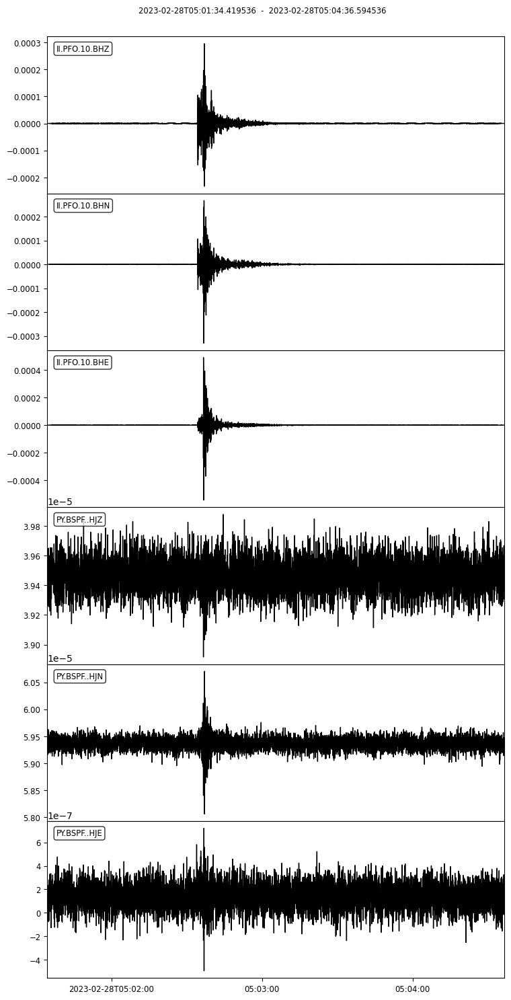


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230228T050234_raw.png ...

   -> Done

 -> 48 2023-03-01T22:44:50.444538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-01T22:43:50.447400Z - 2023-03-01T22:46:52.122400Z | 40.0 Hz, 7268 samples
PY.BSPF..HJN | 2023-03-01T22:43:50.447400Z - 2023-03-01T22:46:52.122400Z | 40.0 Hz, 7268 samples
PY.BSPF..HJZ | 2023-03-01T22:43:50.447400Z - 2023-03-01T22:46:52.122400Z | 40.0 Hz, 7268 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-01T22:43:50.447400Z - 2023-03-01T22:46:52.122400Z | 40.0 Hz, 7268 samples
PY.BSPF..HJN  | 2023-03-01T22:43:50.447400Z - 2023-03-01T22:46:52.122400Z | 40.0 Hz, 7268 samples
PY.BSPF..HJZ  | 2023-03-01T22:43:50.447400Z - 2023-03-01T22:46:52.122400Z | 40.0 Hz, 7268 samples
II.PFO.10.BHN | 2023-03-01T22:43:50.444538Z - 2023-03-01T22:46:52.144538Z | 40.0 Hz, 7269 samples
II.PFO.10.BHE | 2023-03-01T22:43:50.444538Z - 2023-03-01T22:46:52.144538Z | 40.0 Hz, 7269 samples
II.PFO.10.BHZ | 2023-03-01T22:43:50.444538Z - 2023-03-01T22:46:52.144538Z | 40.0 Hz, 7269 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-01T22:43:50.447400Z - 2023-03-01T22:46:52.122400Z | 40.0 Hz, 7268 samples
PY.BSPF..HJN  | 2023-03-01T22:43:50.447400Z - 2023-03-01T22:46:52.122400Z | 40.0 Hz, 7268 samples
PY.BSPF..HJZ  | 2023-03-01T22:43:50.447400Z - 2023-03-01T22:46:52.122400Z | 40.0 Hz, 7268 samples
II.PFO.10.BHN | 2023-03-01T22:43:50.444538Z - 2023-03-01T22:46:52.144538Z | 40.0 Hz, 7269 samples
II.PFO.10.BHE | 2023-03-01T22:43:50.444538Z - 2023-03-01T22:46:52.144538Z | 40.0 Hz, 7269 samples
II.PFO.10.BHZ | 2023-03-01T22:43:50.444538Z - 2023-03-01T22:46:52.144538Z | 40.0 Hz, 7269 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-01T22:43:50.447400Z - 2023-03-01T22:46:52.122400Z | 40.0 Hz, 7268 samples
PY.BSPF..HJN  | 2023-03-01T22:43:50.447400Z - 2023-03-01T22:46:52.122400Z | 40.0 Hz, 7268 samples
PY.BSPF..HJZ  | 2023-03-01T22:43:50.447400Z - 2023-03-01T22:46:52.122400Z | 40.0 Hz, 7268 samples
II.PFO.10.BHN | 2023-03-01T22:43:50.444538Z - 2023-03-01T22:46:52.144538Z | 40.0 Hz, 7269 samples
II.PFO.10.BHE | 2023-03-01T22:43:50.444538Z - 2023-03-01T22:46:52.144538Z | 40.0 Hz, 7269 samples
II.PFO.10.BHZ | 2023-03-01T22:43:50.444538Z - 2023-03-01T22:46:52.144538Z | 40.0 Hz, 7269 samples

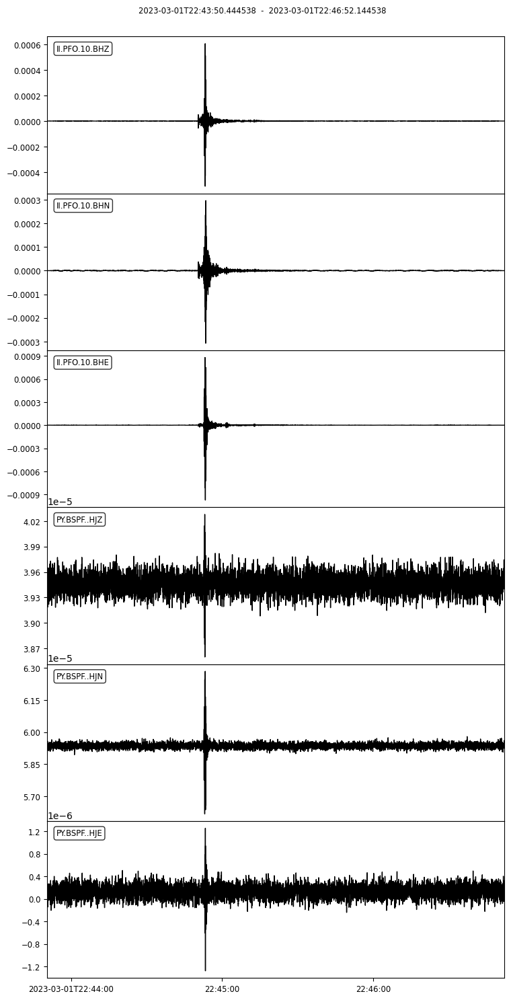


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230301T224450_raw.png ...

   -> Done

 -> 49 2023-03-01T22:49:06.769538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-01T22:48:06.772400Z - 2023-03-01T22:51:07.897400Z | 40.0 Hz, 7246 samples
PY.BSPF..HJN | 2023-03-01T22:48:06.772400Z - 2023-03-01T22:51:07.897400Z | 40.0 Hz, 7246 samples
PY.BSPF..HJZ | 2023-03-01T22:48:06.772400Z - 2023-03-01T22:51:07.897400Z | 40.0 Hz, 7246 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-01T22:48:06.772400Z - 2023-03-01T22:51:07.897400Z | 40.0 Hz, 7246 samples
PY.BSPF..HJN  | 2023-03-01T22:48:06.772400Z - 2023-03-01T22:51:07.897400Z | 40.0 Hz, 7246 samples
PY.BSPF..HJZ  | 2023-03-01T22:48:06.772400Z - 2023-03-01T22:51:07.897400Z | 40.0 Hz, 7246 samples
II.PFO.10.BHN | 2023-03-01T22:48:06.769538Z - 2023-03-01T22:51:07.919538Z | 40.0 Hz, 7247 samples
II.PFO.10.BHE | 2023-03-01T22:48:06.769538Z - 2023-03-01T22:51:07.919538Z | 40.0 Hz, 7247 samples
II.PFO.10.BHZ | 2023-03-01T22:48:06.769538Z - 2023-03-01T22:51:07.919538Z | 40.0 Hz, 7247 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-01T22:48:06.772400Z - 2023-03-01T22:51:07.897400Z | 40.0 Hz, 7246 samples
PY.BSPF..HJN  | 2023-03-01T22:48:06.772400Z - 2023-03-01T22:51:07.897400Z | 40.0 Hz, 7246 samples
PY.BSPF..HJZ  | 2023-03-01T22:48:06.772400Z - 2023-03-01T22:51:07.897400Z | 40.0 Hz, 7246 samples
II.PFO.10.BHN | 2023-03-01T22:48:06.769538Z - 2023-03-01T22:51:07.919538Z | 40.0 Hz, 7247 samples
II.PFO.10.BHE | 2023-03-01T22:48:06.769538Z - 2023-03-01T22:51:07.919538Z | 40.0 Hz, 7247 samples
II.PFO.10.BHZ | 2023-03-01T22:48:06.769538Z - 2023-03-01T22:51:07.919538Z | 40.0 Hz, 7247 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-01T22:48:06.772400Z - 2023-03-01T22:51:07.897400Z | 40.0 Hz, 7246 samples
PY.BSPF..HJN  | 2023-03-01T22:48:06.772400Z - 2023-03-01T22:51:07.897400Z | 40.0 Hz, 7246 samples
PY.BSPF..HJZ  | 2023-03-01T22:48:06.772400Z - 2023-03-01T22:51:07.897400Z | 40.0 Hz, 7246 samples
II.PFO.10.BHN | 2023-03-01T22:48:06.769538Z - 2023-03-01T22:51:07.919538Z | 40.0 Hz, 7247 samples
II.PFO.10.BHE | 2023-03-01T22:48:06.769538Z - 2023-03-01T22:51:07.919538Z | 40.0 Hz, 7247 samples
II.PFO.10.BHZ | 2023-03-01T22:48:06.769538Z - 2023-03-01T22:51:07.919538Z | 40.0 Hz, 7247 samples

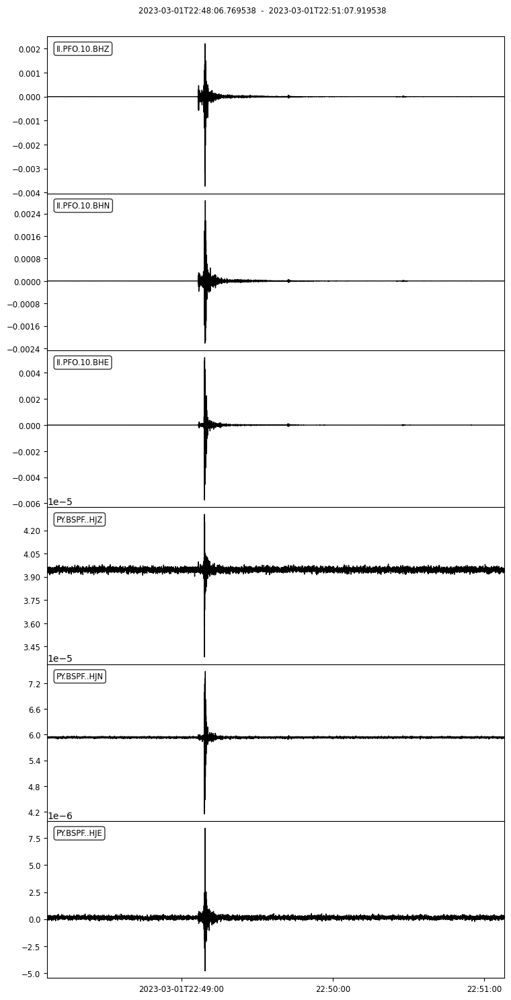


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230301T224906_raw.png ...

   -> Done

 -> 50 2023-03-01T23:44:34.269538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-01T23:43:34.272400Z - 2023-03-01T23:46:35.622400Z | 40.0 Hz, 7255 samples
PY.BSPF..HJN | 2023-03-01T23:43:34.272400Z - 2023-03-01T23:46:35.622400Z | 40.0 Hz, 7255 samples
PY.BSPF..HJZ | 2023-03-01T23:43:34.272400Z - 2023-03-01T23:46:35.622400Z | 40.0 Hz, 7255 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-01T23:43:34.272400Z - 2023-03-01T23:46:35.622400Z | 40.0 Hz, 7255 samples
PY.BSPF..HJN  | 2023-03-01T23:43:34.272400Z - 2023-03-01T23:46:35.622400Z | 40.0 Hz, 7255 samples
PY.BSPF..HJZ  | 2023-03-01T23:43:34.272400Z - 2023-03-01T23:46:35.622400Z | 40.0 Hz, 7255 samples
II.PFO.10.BHN | 2023-03-01T23:43:34.269538Z - 2023-03-01T23:46:35.644538Z | 40.0 Hz, 7256 samples
II.PFO.10.BHE | 2023-03-01T23:43:34.269538Z - 2023-03-01T23:46:35.644538Z | 40.0 Hz, 7256 samples
II.PFO.10.BHZ | 2023-03-01T23:43:34.269538Z - 2023-03-01T23:46:35.644538Z | 40.0 Hz, 7256 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-01T23:43:34.272400Z - 2023-03-01T23:46:35.622400Z | 40.0 Hz, 7255 samples
PY.BSPF..HJN  | 2023-03-01T23:43:34.272400Z - 2023-03-01T23:46:35.622400Z | 40.0 Hz, 7255 samples
PY.BSPF..HJZ  | 2023-03-01T23:43:34.272400Z - 2023-03-01T23:46:35.622400Z | 40.0 Hz, 7255 samples
II.PFO.10.BHN | 2023-03-01T23:43:34.269538Z - 2023-03-01T23:46:35.644538Z | 40.0 Hz, 7256 samples
II.PFO.10.BHE | 2023-03-01T23:43:34.269538Z - 2023-03-01T23:46:35.644538Z | 40.0 Hz, 7256 samples
II.PFO.10.BHZ | 2023-03-01T23:43:34.269538Z - 2023-03-01T23:46:35.644538Z | 40.0 Hz, 7256 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-01T23:43:34.272400Z - 2023-03-01T23:46:35.622400Z | 40.0 Hz, 7255 samples
PY.BSPF..HJN  | 2023-03-01T23:43:34.272400Z - 2023-03-01T23:46:35.622400Z | 40.0 Hz, 7255 samples
PY.BSPF..HJZ  | 2023-03-01T23:43:34.272400Z - 2023-03-01T23:46:35.622400Z | 40.0 Hz, 7255 samples
II.PFO.10.BHN | 2023-03-01T23:43:34.269538Z - 2023-03-01T23:46:35.644538Z | 40.0 Hz, 7256 samples
II.PFO.10.BHE | 2023-03-01T23:43:34.269538Z - 2023-03-01T23:46:35.644538Z | 40.0 Hz, 7256 samples
II.PFO.10.BHZ | 2023-03-01T23:43:34.269538Z - 2023-03-01T23:46:35.644538Z | 40.0 Hz, 7256 samples

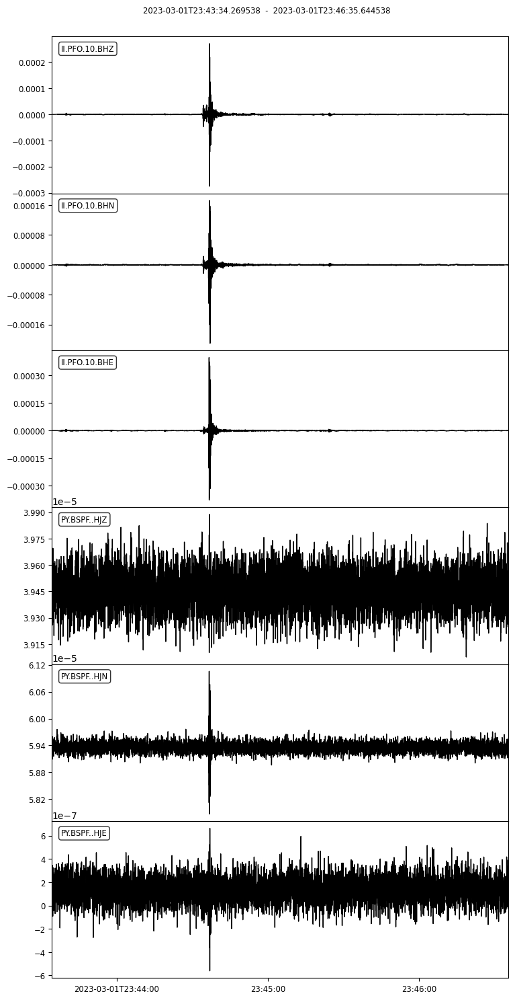


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230301T234434_raw.png ...

   -> Done

 -> 51 2023-03-05T05:10:15.644538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-05T05:09:15.647200Z - 2023-03-05T05:12:09.972200Z | 40.0 Hz, 6974 samples
PY.BSPF..HJN | 2023-03-05T05:09:15.647200Z - 2023-03-05T05:12:09.972200Z | 40.0 Hz, 6974 samples
PY.BSPF..HJZ | 2023-03-05T05:09:15.647200Z - 2023-03-05T05:12:09.972200Z | 40.0 Hz, 6974 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-05T05:09:15.647200Z - 2023-03-05T05:12:09.972200Z | 40.0 Hz, 6974 samples
PY.BSPF..HJN  | 2023-03-05T05:09:15.647200Z - 2023-03-05T05:12:09.972200Z | 40.0 Hz, 6974 samples
PY.BSPF..HJZ  | 2023-03-05T05:09:15.647200Z - 2023-03-05T05:12:09.972200Z | 40.0 Hz, 6974 samples
II.PFO.10.BHN | 2023-03-05T05:09:15.644538Z - 2023-03-05T05:12:09.994538Z | 40.0 Hz, 6975 samples
II.PFO.10.BHE | 2023-03-05T05:09:15.644538Z - 2023-03-05T05:12:09.994538Z | 40.0 Hz, 6975 samples
II.PFO.10.BHZ | 2023-03-05T05:09:15.644538Z - 2023-03-05T05:12:09.994538Z | 40.0 Hz, 6975 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-05T05:09:15.647200Z - 2023-03-05T05:12:09.972200Z | 40.0 Hz, 6974 samples
PY.BSPF..HJN  | 2023-03-05T05:09:15.647200Z - 2023-03-05T05:12:09.972200Z | 40.0 Hz, 6974 samples
PY.BSPF..HJZ  | 2023-03-05T05:09:15.647200Z - 2023-03-05T05:12:09.972200Z | 40.0 Hz, 6974 samples
II.PFO.10.BHN | 2023-03-05T05:09:15.644538Z - 2023-03-05T05:12:09.994538Z | 40.0 Hz, 6975 samples
II.PFO.10.BHE | 2023-03-05T05:09:15.644538Z - 2023-03-05T05:12:09.994538Z | 40.0 Hz, 6975 samples
II.PFO.10.BHZ | 2023-03-05T05:09:15.644538Z - 2023-03-05T05:12:09.994538Z | 40.0 Hz, 6975 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-05T05:09:15.647200Z - 2023-03-05T05:12:09.972200Z | 40.0 Hz, 6974 samples
PY.BSPF..HJN  | 2023-03-05T05:09:15.647200Z - 2023-03-05T05:12:09.972200Z | 40.0 Hz, 6974 samples
PY.BSPF..HJZ  | 2023-03-05T05:09:15.647200Z - 2023-03-05T05:12:09.972200Z | 40.0 Hz, 6974 samples
II.PFO.10.BHN | 2023-03-05T05:09:15.644538Z - 2023-03-05T05:12:09.994538Z | 40.0 Hz, 6975 samples
II.PFO.10.BHE | 2023-03-05T05:09:15.644538Z - 2023-03-05T05:12:09.994538Z | 40.0 Hz, 6975 samples
II.PFO.10.BHZ | 2023-03-05T05:09:15.644538Z - 2023-03-05T05:12:09.994538Z | 40.0 Hz, 6975 samples

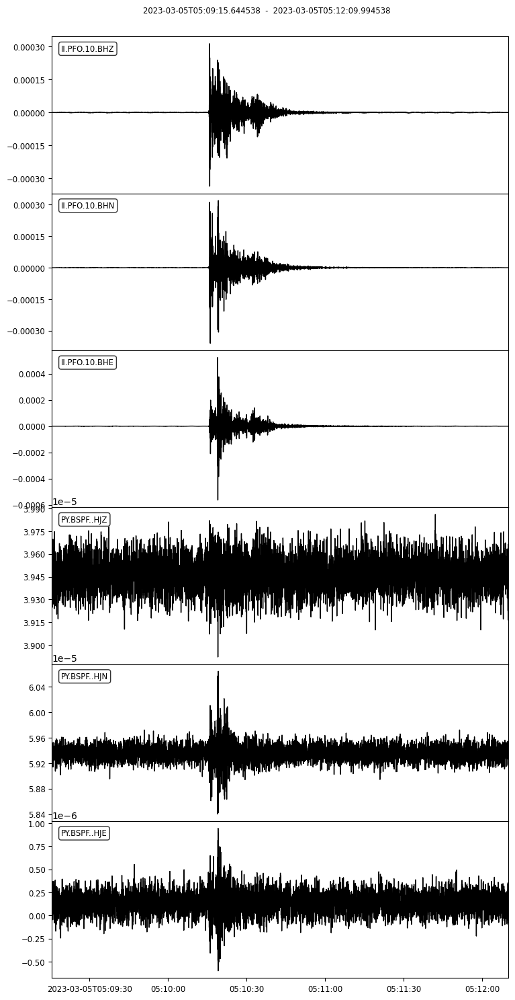


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230305T051015_raw.png ...



/home/brotzer/anaconda3/lib/python3.7/site-packages/andbro__savefig.py:67: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  figs.savefig(f"{outpath}{outname}.{mode}", dpi=dpi, facecolor='w', edgecolor='w', orientation='portrait', format='png', transparent=False , bbox_inches='tight', pad_inches=0.1)


   -> Done

 -> 52 2023-03-05T05:10:15.544538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-05T05:09:15.547200Z - 2023-03-05T05:12:20.772200Z | 40.0 Hz, 7410 samples
PY.BSPF..HJN | 2023-03-05T05:09:15.547200Z - 2023-03-05T05:12:20.772200Z | 40.0 Hz, 7410 samples
PY.BSPF..HJZ | 2023-03-05T05:09:15.547200Z - 2023-03-05T05:12:20.772200Z | 40.0 Hz, 7410 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-05T05:09:15.547200Z - 2023-03-05T05:12:20.772200Z | 40.0 Hz, 7410 samples
PY.BSPF..HJN  | 2023-03-05T05:09:15.547200Z - 2023-03-05T05:12:20.772200Z | 40.0 Hz, 7410 samples
PY.BSPF..HJZ  | 2023-03-05T05:09:15.547200Z - 2023-03-05T05:12:20.772200Z | 40.0 Hz, 7410 samples
II.PFO.10.BHN | 2023-03-05T05:09:15.544538Z - 2023-03-05T05:12:20.794538Z | 40.0 Hz, 7411 samples
II.PFO.10.BHE | 2023-03-05T05:09:15.544538Z - 2023-03-05T05:12:20.794538Z | 40.0 Hz, 7411 samples
II.PFO.10.BHZ | 2023-03-05T05:09:15.544538Z - 2023-03-05T05:12:20.794538Z | 40.0 Hz, 7411 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-05T05:09:15.547200Z - 2023-03-05T05:12:20.772200Z | 40.0 Hz, 7410 samples
PY.BSPF..HJN  | 2023-03-05T05:09:15.547200Z - 2023-03-05T05:12:20.772200Z | 40.0 Hz, 7410 samples
PY.BSPF..HJZ  | 2023-03-05T05:09:15.547200Z - 2023-03-05T05:12:20.772200Z | 40.0 Hz, 7410 samples
II.PFO.10.BHN | 2023-03-05T05:09:15.544538Z - 2023-03-05T05:12:20.794538Z | 40.0 Hz, 7411 samples
II.PFO.10.BHE | 2023-03-05T05:09:15.544538Z - 2023-03-05T05:12:20.794538Z | 40.0 Hz, 7411 samples
II.PFO.10.BHZ | 2023-03-05T05:09:15.544538Z - 2023-03-05T05:12:20.794538Z | 40.0 Hz, 7411 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-05T05:09:15.547200Z - 2023-03-05T05:12:20.772200Z | 40.0 Hz, 7410 samples
PY.BSPF..HJN  | 2023-03-05T05:09:15.547200Z - 2023-03-05T05:12:20.772200Z | 40.0 Hz, 7410 samples
PY.BSPF..HJZ  | 2023-03-05T05:09:15.547200Z - 2023-03-05T05:12:20.772200Z | 40.0 Hz, 7410 samples
II.PFO.10.BHN | 2023-03-05T05:09:15.544538Z - 2023-03-05T05:12:20.794538Z | 40.0 Hz, 7411 samples
II.PFO.10.BHE | 2023-03-05T05:09:15.544538Z - 2023-03-05T05:12:20.794538Z | 40.0 Hz, 7411 samples
II.PFO.10.BHZ | 2023-03-05T05:09:15.544538Z - 2023-03-05T05:12:20.794538Z | 40.0 Hz, 7411 samples

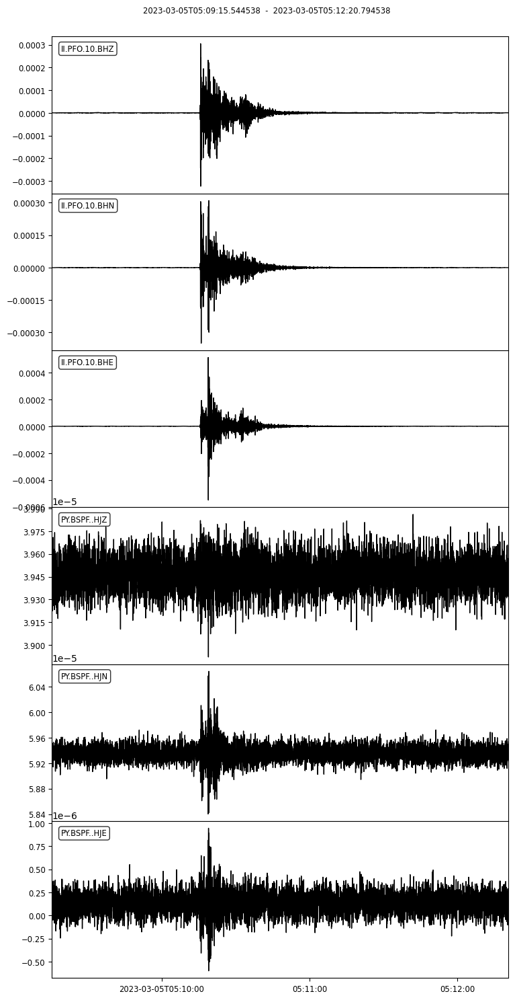


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230305T051015_raw.png ...

   -> Done

 -> 53 2023-03-08T04:07:41.094538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-08T04:06:41.096900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7494 samples
PY.BSPF..HJN | 2023-03-08T04:06:41.096900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7494 samples
PY.BSPF..HJZ | 2023-03-08T04:06:41.096900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7494 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-08T04:06:41.096900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7494 samples
PY.BSPF..HJN  | 2023-03-08T04:06:41.096900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7494 samples
PY.BSPF..HJZ  | 2023-03-08T04:06:41.096900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7494 samples
II.PFO.10.BHN | 2023-03-08T04:06:41.094538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7495 samples
II.PFO.10.BHE | 2023-03-08T04:06:41.094538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7495 samples
II.PFO.10.BHZ | 2023-03-08T04:06:41.094538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7495 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-08T04:06:41.096900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7494 samples
PY.BSPF..HJN  | 2023-03-08T04:06:41.096900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7494 samples
PY.BSPF..HJZ  | 2023-03-08T04:06:41.096900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7494 samples
II.PFO.10.BHN | 2023-03-08T04:06:41.094538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7495 samples
II.PFO.10.BHE | 2023-03-08T04:06:41.094538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7495 samples
II.PFO.10.BHZ | 2023-03-08T04:06:41.094538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7495 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-08T04:06:41.096900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7494 samples
PY.BSPF..HJN  | 2023-03-08T04:06:41.096900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7494 samples
PY.BSPF..HJZ  | 2023-03-08T04:06:41.096900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7494 samples
II.PFO.10.BHN | 2023-03-08T04:06:41.094538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7495 samples
II.PFO.10.BHE | 2023-03-08T04:06:41.094538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7495 samples
II.PFO.10.BHZ | 2023-03-08T04:06:41.094538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7495 samples

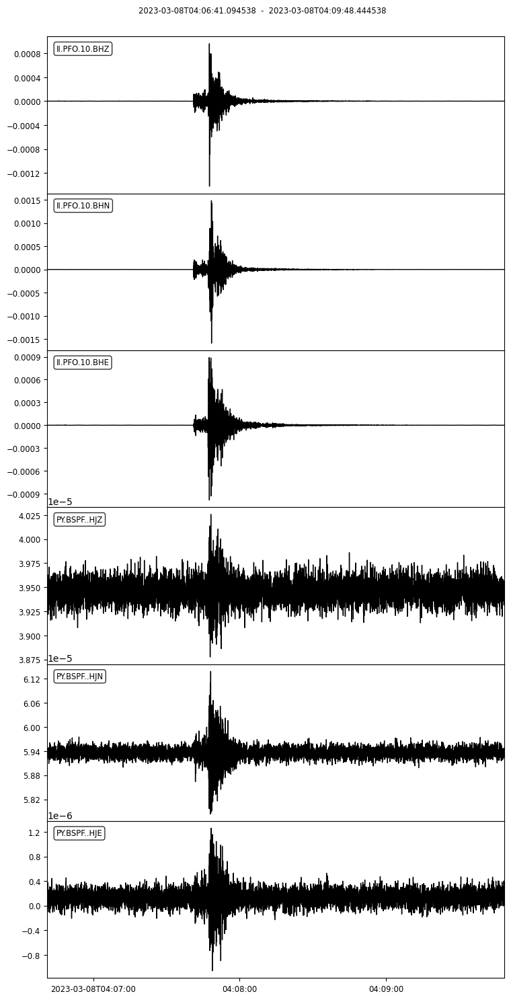


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230308T040741_raw.png ...

   -> Done

 -> 54 2023-03-08T04:07:41.069538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-08T04:06:41.071900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJN | 2023-03-08T04:06:41.071900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJZ | 2023-03-08T04:06:41.071900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7495 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-08T04:06:41.071900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJN  | 2023-03-08T04:06:41.071900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJZ  | 2023-03-08T04:06:41.071900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7495 samples
II.PFO.10.BHN | 2023-03-08T04:06:41.069538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHE | 2023-03-08T04:06:41.069538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHZ | 2023-03-08T04:06:41.069538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7496 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-08T04:06:41.071900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJN  | 2023-03-08T04:06:41.071900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJZ  | 2023-03-08T04:06:41.071900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7495 samples
II.PFO.10.BHN | 2023-03-08T04:06:41.069538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHE | 2023-03-08T04:06:41.069538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHZ | 2023-03-08T04:06:41.069538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7496 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-08T04:06:41.071900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJN  | 2023-03-08T04:06:41.071900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7495 samples
PY.BSPF..HJZ  | 2023-03-08T04:06:41.071900Z - 2023-03-08T04:09:48.421900Z | 40.0 Hz, 7495 samples
II.PFO.10.BHN | 2023-03-08T04:06:41.069538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHE | 2023-03-08T04:06:41.069538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7496 samples
II.PFO.10.BHZ | 2023-03-08T04:06:41.069538Z - 2023-03-08T04:09:48.444538Z | 40.0 Hz, 7496 samples

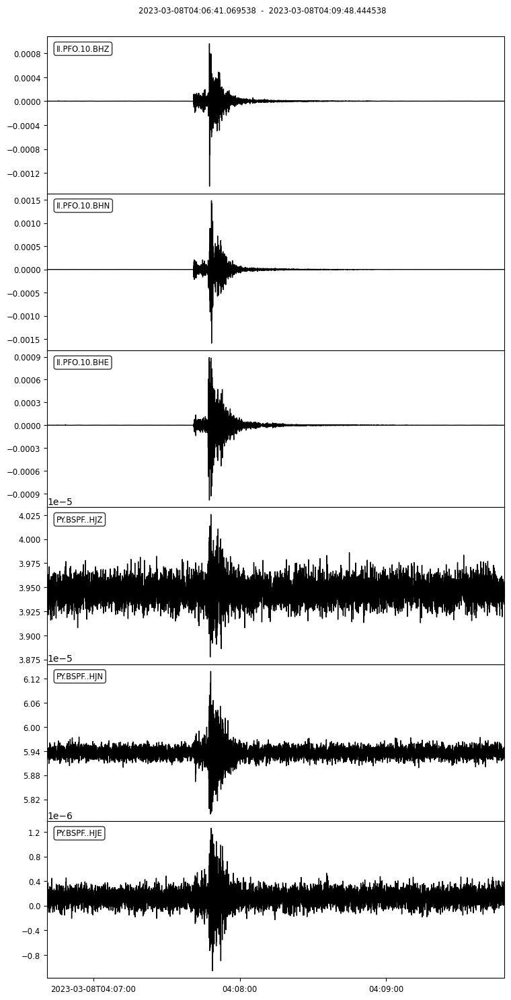


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230308T040741_raw.png ...

   -> Done

 -> 55 2023-03-09T10:33:39.069538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-09T10:32:39.071900Z - 2023-03-09T10:35:42.496900Z | 40.0 Hz, 7338 samples
PY.BSPF..HJN | 2023-03-09T10:32:39.071900Z - 2023-03-09T10:35:42.496900Z | 40.0 Hz, 7338 samples
PY.BSPF..HJZ | 2023-03-09T10:32:39.071900Z - 2023-03-09T10:35:42.496900Z | 40.0 Hz, 7338 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-09T10:32:39.071900Z - 2023-03-09T10:35:42.496900Z | 40.0 Hz, 7338 samples
PY.BSPF..HJN  | 2023-03-09T10:32:39.071900Z - 2023-03-09T10:35:42.496900Z | 40.0 Hz, 7338 samples
PY.BSPF..HJZ  | 2023-03-09T10:32:39.071900Z - 2023-03-09T10:35:42.496900Z | 40.0 Hz, 7338 samples
II.PFO.10.BHN | 2023-03-09T10:32:39.069538Z - 2023-03-09T10:35:42.519538Z | 40.0 Hz, 7339 samples
II.PFO.10.BHE | 2023-03-09T10:32:39.069538Z - 2023-03-09T10:35:42.519538Z | 40.0 Hz, 7339 samples
II.PFO.10.BHZ | 2023-03-09T10:32:39.069538Z - 2023-03-09T10:35:42.519538Z | 40.0 Hz, 7339 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-09T10:32:39.071900Z - 2023-03-09T10:35:42.496900Z | 40.0 Hz, 7338 samples
PY.BSPF..HJN  | 2023-03-09T10:32:39.071900Z - 2023-03-09T10:35:42.496900Z | 40.0 Hz, 7338 samples
PY.BSPF..HJZ  | 2023-03-09T10:32:39.071900Z - 2023-03-09T10:35:42.496900Z | 40.0 Hz, 7338 samples
II.PFO.10.BHN | 2023-03-09T10:32:39.069538Z - 2023-03-09T10:35:42.519538Z | 40.0 Hz, 7339 samples
II.PFO.10.BHE | 2023-03-09T10:32:39.069538Z - 2023-03-09T10:35:42.519538Z | 40.0 Hz, 7339 samples
II.PFO.10.BHZ | 2023-03-09T10:32:39.069538Z - 2023-03-09T10:35:42.519538Z | 40.0 Hz, 7339 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-09T10:32:39.071900Z - 2023-03-09T10:35:42.496900Z | 40.0 Hz, 7338 samples
PY.BSPF..HJN  | 2023-03-09T10:32:39.071900Z - 2023-03-09T10:35:42.496900Z | 40.0 Hz, 7338 samples
PY.BSPF..HJZ  | 2023-03-09T10:32:39.071900Z - 2023-03-09T10:35:42.496900Z | 40.0 Hz, 7338 samples
II.PFO.10.BHN | 2023-03-09T10:32:39.069538Z - 2023-03-09T10:35:42.519538Z | 40.0 Hz, 7339 samples
II.PFO.10.BHE | 2023-03-09T10:32:39.069538Z - 2023-03-09T10:35:42.519538Z | 40.0 Hz, 7339 samples
II.PFO.10.BHZ | 2023-03-09T10:32:39.069538Z - 2023-03-09T10:35:42.519538Z | 40.0 Hz, 7339 samples

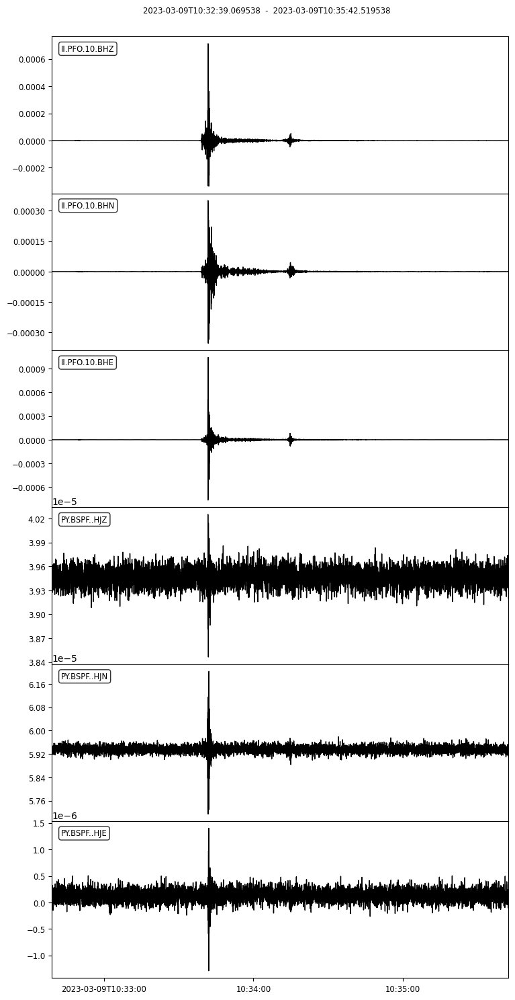


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230309T103339_raw.png ...

   -> Done

 -> 56 2023-03-10T01:13:33.244538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-10T01:12:33.246800Z - 2023-03-10T01:15:35.546800Z | 40.0 Hz, 7293 samples
PY.BSPF..HJN | 2023-03-10T01:12:33.246800Z - 2023-03-10T01:15:35.546800Z | 40.0 Hz, 7293 samples
PY.BSPF..HJZ | 2023-03-10T01:12:33.246800Z - 2023-03-10T01:15:35.546800Z | 40.0 Hz, 7293 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T01:12:33.246800Z - 2023-03-10T01:15:35.546800Z | 40.0 Hz, 7293 samples
PY.BSPF..HJN  | 2023-03-10T01:12:33.246800Z - 2023-03-10T01:15:35.546800Z | 40.0 Hz, 7293 samples
PY.BSPF..HJZ  | 2023-03-10T01:12:33.246800Z - 2023-03-10T01:15:35.546800Z | 40.0 Hz, 7293 samples
II.PFO.10.BHN | 2023-03-10T01:12:33.244539Z - 2023-03-10T01:15:35.569539Z | 40.0 Hz, 7294 samples
II.PFO.10.BHE | 2023-03-10T01:12:33.244539Z - 2023-03-10T01:15:35.569539Z | 40.0 Hz, 7294 samples
II.PFO.10.BHZ | 2023-03-10T01:12:33.244538Z - 2023-03-10T01:15:35.569538Z | 40.0 Hz, 7294 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T01:12:33.246800Z - 2023-03-10T01:15:35.546800Z | 40.0 Hz, 7293 samples
PY.BSPF..HJN  | 2023-03-10T01:12:33.246800Z - 2023-03-10T01:15:35.546800Z | 40.0 Hz, 7293 samples
PY.BSPF..HJZ  | 2023-03-10T01:12:33.246800Z - 2023-03-10T01:15:35.546800Z | 40.0 Hz, 7293 samples
II.PFO.10.BHN | 2023-03-10T01:12:33.244539Z - 2023-03-10T01:15:35.569539Z | 40.0 Hz, 7294 samples
II.PFO.10.BHE | 2023-03-10T01:12:33.244539Z - 2023-03-10T01:15:35.569539Z | 40.0 Hz, 7294 samples
II.PFO.10.BHZ | 2023-03-10T01:12:33.244538Z - 2023-03-10T01:15:35.569538Z | 40.0 Hz, 7294 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T01:12:33.246800Z - 2023-03-10T01:15:35.546800Z | 40.0 Hz, 7293 samples
PY.BSPF..HJN  | 2023-03-10T01:12:33.246800Z - 2023-03-10T01:15:35.546800Z | 40.0 Hz, 7293 samples
PY.BSPF..HJZ  | 2023-03-10T01:12:33.246800Z - 2023-03-10T01:15:35.546800Z | 40.0 Hz, 7293 samples
II.PFO.10.BHN | 2023-03-10T01:12:33.244539Z - 2023-03-10T01:15:35.569539Z | 40.0 Hz, 7294 samples
II.PFO.10.BHE | 2023-03-10T01:12:33.244539Z - 2023-03-10T01:15:35.569539Z | 40.0 Hz, 7294 samples
II.PFO.10.BHZ | 2023-03-10T01:12:33.244538Z - 2023-03-10T01:15:35.569538Z | 40.0 Hz, 7294 samples

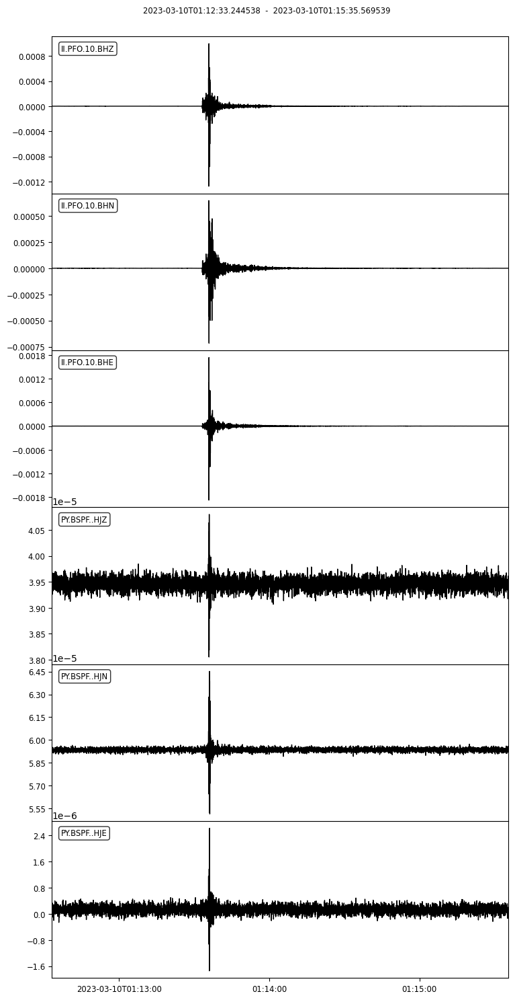


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230310T011333_raw.png ...

   -> Done

 -> 57 2023-03-10T06:49:42.844538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-10T06:48:42.846800Z - 2023-03-10T06:51:46.971800Z | 40.0 Hz, 7366 samples
PY.BSPF..HJN | 2023-03-10T06:48:42.846800Z - 2023-03-10T06:51:46.971800Z | 40.0 Hz, 7366 samples
PY.BSPF..HJZ | 2023-03-10T06:48:42.846800Z - 2023-03-10T06:51:46.971800Z | 40.0 Hz, 7366 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T06:48:42.846800Z - 2023-03-10T06:51:46.971800Z | 40.0 Hz, 7366 samples
PY.BSPF..HJN  | 2023-03-10T06:48:42.846800Z - 2023-03-10T06:51:46.971800Z | 40.0 Hz, 7366 samples
PY.BSPF..HJZ  | 2023-03-10T06:48:42.846800Z - 2023-03-10T06:51:46.971800Z | 40.0 Hz, 7366 samples
II.PFO.10.BHN | 2023-03-10T06:48:42.844538Z - 2023-03-10T06:51:46.994538Z | 40.0 Hz, 7367 samples
II.PFO.10.BHE | 2023-03-10T06:48:42.844538Z - 2023-03-10T06:51:46.994538Z | 40.0 Hz, 7367 samples
II.PFO.10.BHZ | 2023-03-10T06:48:42.844538Z - 2023-03-10T06:51:46.994538Z | 40.0 Hz, 7367 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T06:48:42.846800Z - 2023-03-10T06:51:46.971800Z | 40.0 Hz, 7366 samples
PY.BSPF..HJN  | 2023-03-10T06:48:42.846800Z - 2023-03-10T06:51:46.971800Z | 40.0 Hz, 7366 samples
PY.BSPF..HJZ  | 2023-03-10T06:48:42.846800Z - 2023-03-10T06:51:46.971800Z | 40.0 Hz, 7366 samples
II.PFO.10.BHN | 2023-03-10T06:48:42.844538Z - 2023-03-10T06:51:46.994538Z | 40.0 Hz, 7367 samples
II.PFO.10.BHE | 2023-03-10T06:48:42.844538Z - 2023-03-10T06:51:46.994538Z | 40.0 Hz, 7367 samples
II.PFO.10.BHZ | 2023-03-10T06:48:42.844538Z - 2023-03-10T06:51:46.994538Z | 40.0 Hz, 7367 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T06:48:42.846800Z - 2023-03-10T06:51:46.971800Z | 40.0 Hz, 7366 samples
PY.BSPF..HJN  | 2023-03-10T06:48:42.846800Z - 2023-03-10T06:51:46.971800Z | 40.0 Hz, 7366 samples
PY.BSPF..HJZ  | 2023-03-10T06:48:42.846800Z - 2023-03-10T06:51:46.971800Z | 40.0 Hz, 7366 samples
II.PFO.10.BHN | 2023-03-10T06:48:42.844538Z - 2023-03-10T06:51:46.994538Z | 40.0 Hz, 7367 samples
II.PFO.10.BHE | 2023-03-10T06:48:42.844538Z - 2023-03-10T06:51:46.994538Z | 40.0 Hz, 7367 samples
II.PFO.10.BHZ | 2023-03-10T06:48:42.844538Z - 2023-03-10T06:51:46.994538Z | 40.0 Hz, 7367 samples

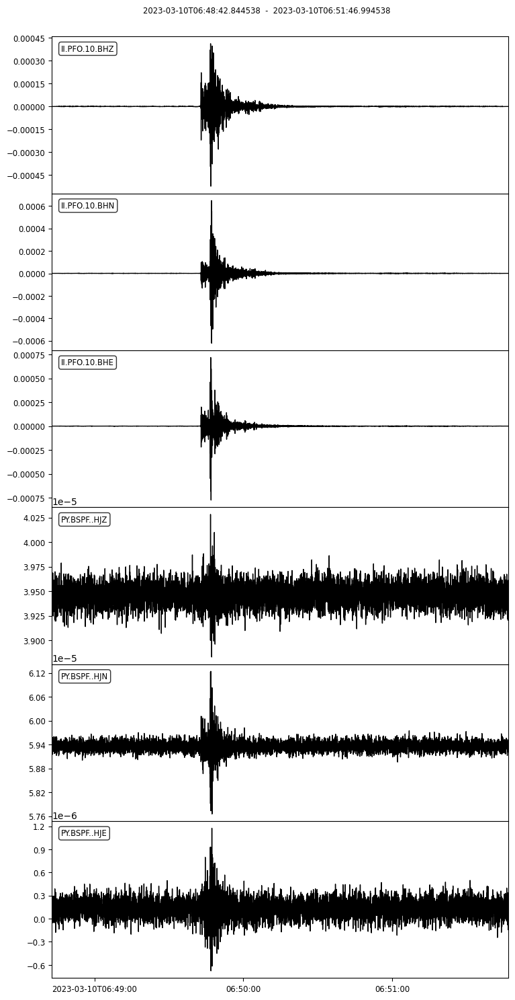


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230310T064942_raw.png ...

   -> Done

 -> 58 2023-03-10T14:32:15.144538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-10T14:31:15.146800Z - 2023-03-10T14:34:17.796800Z | 40.0 Hz, 7307 samples
PY.BSPF..HJN | 2023-03-10T14:31:15.146800Z - 2023-03-10T14:34:17.796800Z | 40.0 Hz, 7307 samples
PY.BSPF..HJZ | 2023-03-10T14:31:15.146800Z - 2023-03-10T14:34:17.796800Z | 40.0 Hz, 7307 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T14:31:15.146800Z - 2023-03-10T14:34:17.796800Z | 40.0 Hz, 7307 samples
PY.BSPF..HJN  | 2023-03-10T14:31:15.146800Z - 2023-03-10T14:34:17.796800Z | 40.0 Hz, 7307 samples
PY.BSPF..HJZ  | 2023-03-10T14:31:15.146800Z - 2023-03-10T14:34:17.796800Z | 40.0 Hz, 7307 samples
II.PFO.10.BHN | 2023-03-10T14:31:15.144538Z - 2023-03-10T14:34:17.819538Z | 40.0 Hz, 7308 samples
II.PFO.10.BHE | 2023-03-10T14:31:15.144538Z - 2023-03-10T14:34:17.819538Z | 40.0 Hz, 7308 samples
II.PFO.10.BHZ | 2023-03-10T14:31:15.144538Z - 2023-03-10T14:34:17.819538Z | 40.0 Hz, 7308 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T14:31:15.146800Z - 2023-03-10T14:34:17.796800Z | 40.0 Hz, 7307 samples
PY.BSPF..HJN  | 2023-03-10T14:31:15.146800Z - 2023-03-10T14:34:17.796800Z | 40.0 Hz, 7307 samples
PY.BSPF..HJZ  | 2023-03-10T14:31:15.146800Z - 2023-03-10T14:34:17.796800Z | 40.0 Hz, 7307 samples
II.PFO.10.BHN | 2023-03-10T14:31:15.144538Z - 2023-03-10T14:34:17.819538Z | 40.0 Hz, 7308 samples
II.PFO.10.BHE | 2023-03-10T14:31:15.144538Z - 2023-03-10T14:34:17.819538Z | 40.0 Hz, 7308 samples
II.PFO.10.BHZ | 2023-03-10T14:31:15.144538Z - 2023-03-10T14:34:17.819538Z | 40.0 Hz, 7308 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T14:31:15.146800Z - 2023-03-10T14:34:17.796800Z | 40.0 Hz, 7307 samples
PY.BSPF..HJN  | 2023-03-10T14:31:15.146800Z - 2023-03-10T14:34:17.796800Z | 40.0 Hz, 7307 samples
PY.BSPF..HJZ  | 2023-03-10T14:31:15.146800Z - 2023-03-10T14:34:17.796800Z | 40.0 Hz, 7307 samples
II.PFO.10.BHN | 2023-03-10T14:31:15.144538Z - 2023-03-10T14:34:17.819538Z | 40.0 Hz, 7308 samples
II.PFO.10.BHE | 2023-03-10T14:31:15.144538Z - 2023-03-10T14:34:17.819538Z | 40.0 Hz, 7308 samples
II.PFO.10.BHZ | 2023-03-10T14:31:15.144538Z - 2023-03-10T14:34:17.819538Z | 40.0 Hz, 7308 samples

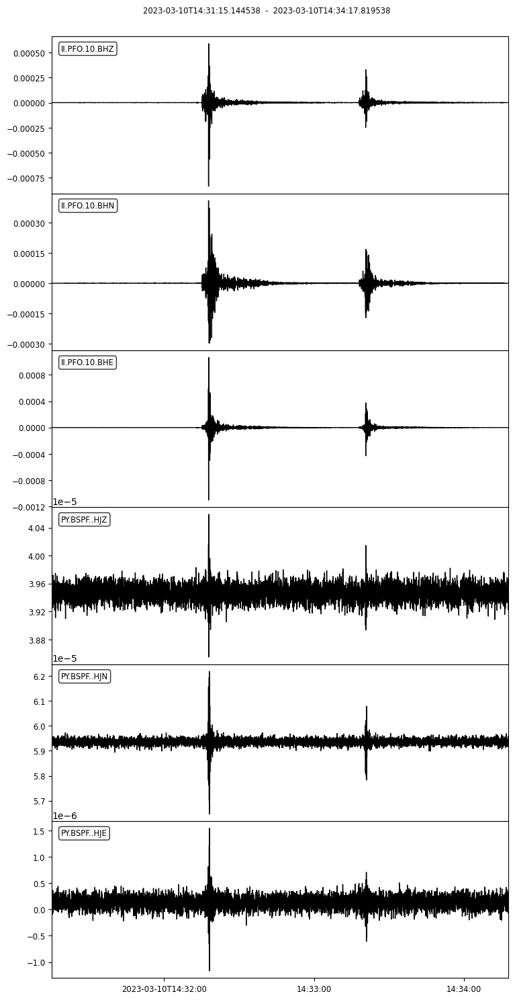


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230310T143215_raw.png ...

   -> Done

 -> 59 2023-03-10T15:02:35.944538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-10T15:01:35.946800Z - 2023-03-10T15:04:39.746800Z | 40.0 Hz, 7353 samples
PY.BSPF..HJN | 2023-03-10T15:01:35.946800Z - 2023-03-10T15:04:39.746800Z | 40.0 Hz, 7353 samples
PY.BSPF..HJZ | 2023-03-10T15:01:35.946800Z - 2023-03-10T15:04:39.746800Z | 40.0 Hz, 7353 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T15:01:35.946800Z - 2023-03-10T15:04:39.746800Z | 40.0 Hz, 7353 samples
PY.BSPF..HJN  | 2023-03-10T15:01:35.946800Z - 2023-03-10T15:04:39.746800Z | 40.0 Hz, 7353 samples
PY.BSPF..HJZ  | 2023-03-10T15:01:35.946800Z - 2023-03-10T15:04:39.746800Z | 40.0 Hz, 7353 samples
II.PFO.10.BHN | 2023-03-10T15:01:35.944538Z - 2023-03-10T15:04:39.769538Z | 40.0 Hz, 7354 samples
II.PFO.10.BHE | 2023-03-10T15:01:35.944538Z - 2023-03-10T15:04:39.769538Z | 40.0 Hz, 7354 samples
II.PFO.10.BHZ | 2023-03-10T15:01:35.944538Z - 2023-03-10T15:04:39.769538Z | 40.0 Hz, 7354 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T15:01:35.946800Z - 2023-03-10T15:04:39.746800Z | 40.0 Hz, 7353 samples
PY.BSPF..HJN  | 2023-03-10T15:01:35.946800Z - 2023-03-10T15:04:39.746800Z | 40.0 Hz, 7353 samples
PY.BSPF..HJZ  | 2023-03-10T15:01:35.946800Z - 2023-03-10T15:04:39.746800Z | 40.0 Hz, 7353 samples
II.PFO.10.BHN | 2023-03-10T15:01:35.944538Z - 2023-03-10T15:04:39.769538Z | 40.0 Hz, 7354 samples
II.PFO.10.BHE | 2023-03-10T15:01:35.944538Z - 2023-03-10T15:04:39.769538Z | 40.0 Hz, 7354 samples
II.PFO.10.BHZ | 2023-03-10T15:01:35.944538Z - 2023-03-10T15:04:39.769538Z | 40.0 Hz, 7354 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T15:01:35.946800Z - 2023-03-10T15:04:39.746800Z | 40.0 Hz, 7353 samples
PY.BSPF..HJN  | 2023-03-10T15:01:35.946800Z - 2023-03-10T15:04:39.746800Z | 40.0 Hz, 7353 samples
PY.BSPF..HJZ  | 2023-03-10T15:01:35.946800Z - 2023-03-10T15:04:39.746800Z | 40.0 Hz, 7353 samples
II.PFO.10.BHN | 2023-03-10T15:01:35.944538Z - 2023-03-10T15:04:39.769538Z | 40.0 Hz, 7354 samples
II.PFO.10.BHE | 2023-03-10T15:01:35.944538Z - 2023-03-10T15:04:39.769538Z | 40.0 Hz, 7354 samples
II.PFO.10.BHZ | 2023-03-10T15:01:35.944538Z - 2023-03-10T15:04:39.769538Z | 40.0 Hz, 7354 samples

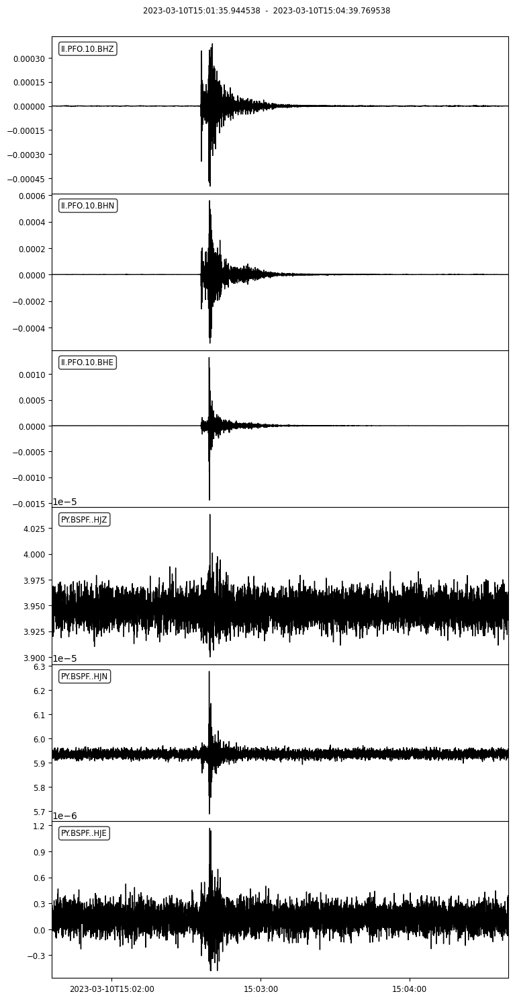


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230310T150235_raw.png ...

   -> Done

 -> 60 2023-03-10T15:02:35.844538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-10T15:01:35.846800Z - 2023-03-10T15:04:39.821800Z | 40.0 Hz, 7360 samples
PY.BSPF..HJN | 2023-03-10T15:01:35.846800Z - 2023-03-10T15:04:39.821800Z | 40.0 Hz, 7360 samples
PY.BSPF..HJZ | 2023-03-10T15:01:35.846800Z - 2023-03-10T15:04:39.821800Z | 40.0 Hz, 7360 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T15:01:35.846800Z - 2023-03-10T15:04:39.821800Z | 40.0 Hz, 7360 samples
PY.BSPF..HJN  | 2023-03-10T15:01:35.846800Z - 2023-03-10T15:04:39.821800Z | 40.0 Hz, 7360 samples
PY.BSPF..HJZ  | 2023-03-10T15:01:35.846800Z - 2023-03-10T15:04:39.821800Z | 40.0 Hz, 7360 samples
II.PFO.10.BHN | 2023-03-10T15:01:35.844538Z - 2023-03-10T15:04:39.844538Z | 40.0 Hz, 7361 samples
II.PFO.10.BHE | 2023-03-10T15:01:35.844538Z - 2023-03-10T15:04:39.844538Z | 40.0 Hz, 7361 samples
II.PFO.10.BHZ | 2023-03-10T15:01:35.844538Z - 2023-03-10T15:04:39.844538Z | 40.0 Hz, 7361 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T15:01:35.846800Z - 2023-03-10T15:04:39.821800Z | 40.0 Hz, 7360 samples
PY.BSPF..HJN  | 2023-03-10T15:01:35.846800Z - 2023-03-10T15:04:39.821800Z | 40.0 Hz, 7360 samples
PY.BSPF..HJZ  | 2023-03-10T15:01:35.846800Z - 2023-03-10T15:04:39.821800Z | 40.0 Hz, 7360 samples
II.PFO.10.BHN | 2023-03-10T15:01:35.844538Z - 2023-03-10T15:04:39.844538Z | 40.0 Hz, 7361 samples
II.PFO.10.BHE | 2023-03-10T15:01:35.844538Z - 2023-03-10T15:04:39.844538Z | 40.0 Hz, 7361 samples
II.PFO.10.BHZ | 2023-03-10T15:01:35.844538Z - 2023-03-10T15:04:39.844538Z | 40.0 Hz, 7361 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-10T15:01:35.846800Z - 2023-03-10T15:04:39.821800Z | 40.0 Hz, 7360 samples
PY.BSPF..HJN  | 2023-03-10T15:01:35.846800Z - 2023-03-10T15:04:39.821800Z | 40.0 Hz, 7360 samples
PY.BSPF..HJZ  | 2023-03-10T15:01:35.846800Z - 2023-03-10T15:04:39.821800Z | 40.0 Hz, 7360 samples
II.PFO.10.BHN | 2023-03-10T15:01:35.844538Z - 2023-03-10T15:04:39.844538Z | 40.0 Hz, 7361 samples
II.PFO.10.BHE | 2023-03-10T15:01:35.844538Z - 2023-03-10T15:04:39.844538Z | 40.0 Hz, 7361 samples
II.PFO.10.BHZ | 2023-03-10T15:01:35.844538Z - 2023-03-10T15:04:39.844538Z | 40.0 Hz, 7361 samples

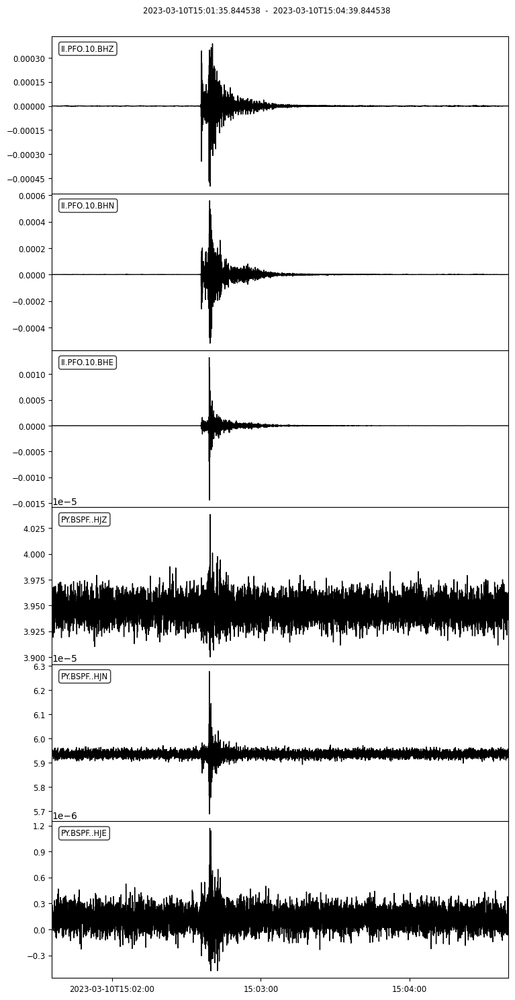


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230310T150235_raw.png ...

   -> Done

 -> 61 2023-03-12T03:39:17.944539Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-12T03:38:17.947100Z - 2023-03-12T03:41:25.097100Z | 40.0 Hz, 7487 samples
PY.BSPF..HJN | 2023-03-12T03:38:17.947100Z - 2023-03-12T03:41:25.097100Z | 40.0 Hz, 7487 samples
PY.BSPF..HJZ | 2023-03-12T03:38:17.947100Z - 2023-03-12T03:41:25.097100Z | 40.0 Hz, 7487 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-12T03:38:17.947100Z - 2023-03-12T03:41:25.097100Z | 40.0 Hz, 7487 samples
PY.BSPF..HJN  | 2023-03-12T03:38:17.947100Z - 2023-03-12T03:41:25.097100Z | 40.0 Hz, 7487 samples
PY.BSPF..HJZ  | 2023-03-12T03:38:17.947100Z - 2023-03-12T03:41:25.097100Z | 40.0 Hz, 7487 samples
II.PFO.10.BHN | 2023-03-12T03:38:17.969538Z - 2023-03-12T03:41:25.119538Z | 40.0 Hz, 7487 samples
II.PFO.10.BHE | 2023-03-12T03:38:17.969538Z - 2023-03-12T03:41:25.119538Z | 40.0 Hz, 7487 samples
II.PFO.10.BHZ | 2023-03-12T03:38:17.969538Z - 2023-03-12T03:41:25.119538Z | 40.0 Hz, 7487 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-12T03:38:17.947100Z - 2023-03-12T03:41:25.097100Z | 40.0 Hz, 7487 samples
PY.BSPF..HJN  | 2023-03-12T03:38:17.947100Z - 2023-03-12T03:41:25.097100Z | 40.0 Hz, 7487 samples
PY.BSPF..HJZ  | 2023-03-12T03:38:17.947100Z - 2023-03-12T03:41:25.097100Z | 40.0 Hz, 7487 samples
II.PFO.10.BHN | 2023-03-12T03:38:17.969538Z - 2023-03-12T03:41:25.119538Z | 40.0 Hz, 7487 samples
II.PFO.10.BHE | 2023-03-12T03:38:17.969538Z - 2023-03-12T03:41:25.119538Z | 40.0 Hz, 7487 samples
II.PFO.10.BHZ | 2023-03-12T03:38:17.969538Z - 2023-03-12T03:41:25.119538Z | 40.0 Hz, 7487 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-12T03:38:17.947100Z - 2023-03-12T03:41:25.097100Z | 40.0 Hz, 7487 samples
PY.BSPF..HJN  | 2023-03-12T03:38:17.947100Z - 2023-03-12T03:41:25.097100Z | 40.0 Hz, 7487 samples
PY.BSPF..HJZ  | 2023-03-12T03:38:17.947100Z - 2023-03-12T03:41:25.097100Z | 40.0 Hz, 7487 samples
II.PFO.10.BHN | 2023-03-12T03:38:17.969538Z - 2023-03-12T03:41:25.119538Z | 40.0 Hz, 7487 samples
II.PFO.10.BHE | 2023-03-12T03:38:17.969538Z - 2023-03-12T03:41:25.119538Z | 40.0 Hz, 7487 samples
II.PFO.10.BHZ | 2023-03-12T03:38:17.969538Z - 2023-03-12T03:41:25.119538Z | 40.0 Hz, 7487 samples

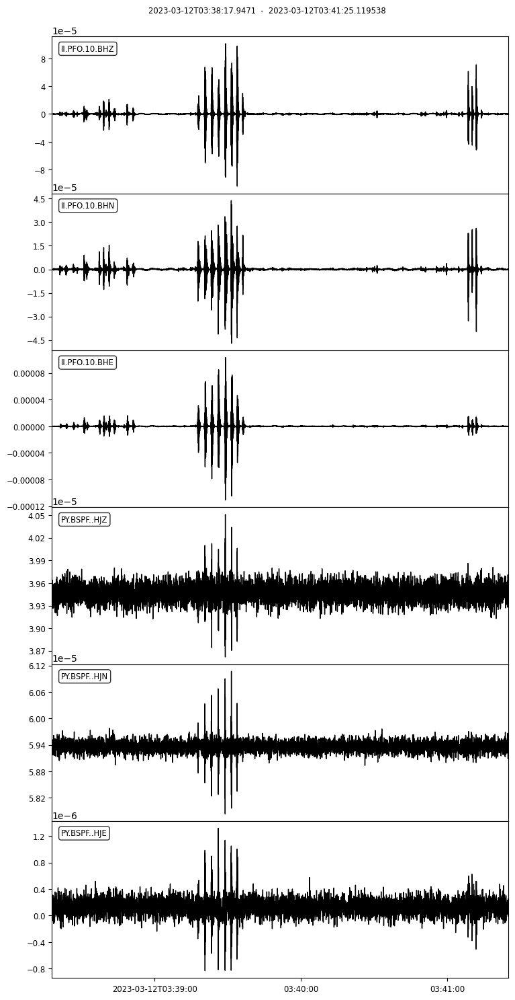


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230312T033917_raw.png ...

   -> Done

 -> 62 2023-03-18T16:52:19.094538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-18T16:51:19.096600Z - 2023-03-18T16:54:29.471600Z | 40.0 Hz, 7616 samples
PY.BSPF..HJN | 2023-03-18T16:51:19.096600Z - 2023-03-18T16:54:29.471600Z | 40.0 Hz, 7616 samples
PY.BSPF..HJZ | 2023-03-18T16:51:19.096600Z - 2023-03-18T16:54:29.471600Z | 40.0 Hz, 7616 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-18T16:51:19.096600Z - 2023-03-18T16:54:29.471600Z | 40.0 Hz, 7616 samples
PY.BSPF..HJN  | 2023-03-18T16:51:19.096600Z - 2023-03-18T16:54:29.471600Z | 40.0 Hz, 7616 samples
PY.BSPF..HJZ  | 2023-03-18T16:51:19.096600Z - 2023-03-18T16:54:29.471600Z | 40.0 Hz, 7616 samples
II.PFO.10.BHN | 2023-03-18T16:51:19.094538Z - 2023-03-18T16:54:29.494538Z | 40.0 Hz, 7617 samples
II.PFO.10.BHE | 2023-03-18T16:51:19.094538Z - 2023-03-18T16:54:29.494538Z | 40.0 Hz, 7617 samples
II.PFO.10.BHZ | 2023-03-18T16:51:19.094538Z - 2023-03-18T16:54:29.494538Z | 40.0 Hz, 7617 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-18T16:51:19.096600Z - 2023-03-18T16:54:29.471600Z | 40.0 Hz, 7616 samples
PY.BSPF..HJN  | 2023-03-18T16:51:19.096600Z - 2023-03-18T16:54:29.471600Z | 40.0 Hz, 7616 samples
PY.BSPF..HJZ  | 2023-03-18T16:51:19.096600Z - 2023-03-18T16:54:29.471600Z | 40.0 Hz, 7616 samples
II.PFO.10.BHN | 2023-03-18T16:51:19.094538Z - 2023-03-18T16:54:29.494538Z | 40.0 Hz, 7617 samples
II.PFO.10.BHE | 2023-03-18T16:51:19.094538Z - 2023-03-18T16:54:29.494538Z | 40.0 Hz, 7617 samples
II.PFO.10.BHZ | 2023-03-18T16:51:19.094538Z - 2023-03-18T16:54:29.494538Z | 40.0 Hz, 7617 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-18T16:51:19.096600Z - 2023-03-18T16:54:29.471600Z | 40.0 Hz, 7616 samples
PY.BSPF..HJN  | 2023-03-18T16:51:19.096600Z - 2023-03-18T16:54:29.471600Z | 40.0 Hz, 7616 samples
PY.BSPF..HJZ  | 2023-03-18T16:51:19.096600Z - 2023-03-18T16:54:29.471600Z | 40.0 Hz, 7616 samples
II.PFO.10.BHN | 2023-03-18T16:51:19.094538Z - 2023-03-18T16:54:29.494538Z | 40.0 Hz, 7617 samples
II.PFO.10.BHE | 2023-03-18T16:51:19.094538Z - 2023-03-18T16:54:29.494538Z | 40.0 Hz, 7617 samples
II.PFO.10.BHZ | 2023-03-18T16:51:19.094538Z - 2023-03-18T16:54:29.494538Z | 40.0 Hz, 7617 samples

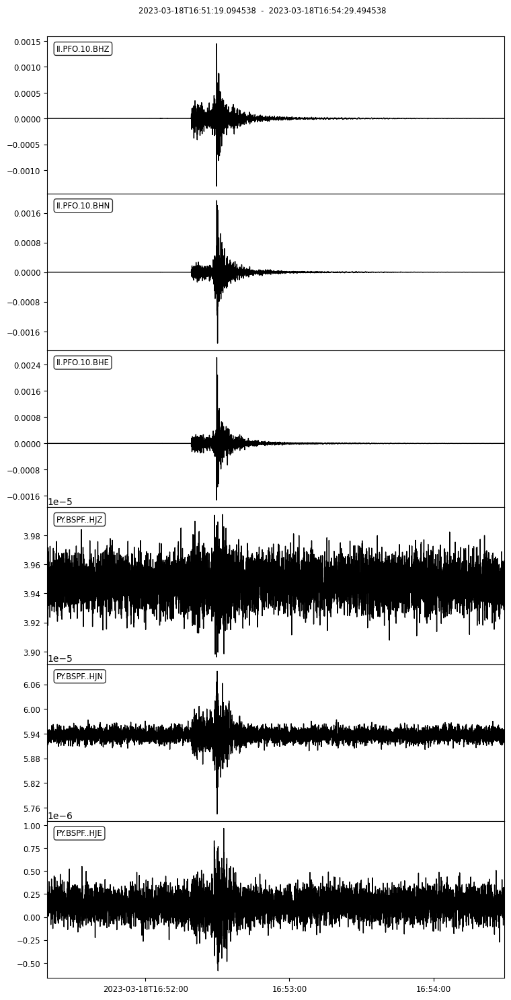


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230318T165219_raw.png ...

   -> Done

 -> 63 2023-03-18T17:19:45.419538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-18T17:18:45.421600Z - 2023-03-18T17:21:54.921600Z | 40.0 Hz, 7581 samples
PY.BSPF..HJN | 2023-03-18T17:18:45.421600Z - 2023-03-18T17:21:54.921600Z | 40.0 Hz, 7581 samples
PY.BSPF..HJZ | 2023-03-18T17:18:45.421600Z - 2023-03-18T17:21:54.921600Z | 40.0 Hz, 7581 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-18T17:18:45.421600Z - 2023-03-18T17:21:54.921600Z | 40.0 Hz, 7581 samples
PY.BSPF..HJN  | 2023-03-18T17:18:45.421600Z - 2023-03-18T17:21:54.921600Z | 40.0 Hz, 7581 samples
PY.BSPF..HJZ  | 2023-03-18T17:18:45.421600Z - 2023-03-18T17:21:54.921600Z | 40.0 Hz, 7581 samples
II.PFO.10.BHN | 2023-03-18T17:18:45.444536Z - 2023-03-18T17:21:54.944536Z | 40.0 Hz, 7581 samples
II.PFO.10.BHE | 2023-03-18T17:18:45.444536Z - 2023-03-18T17:21:54.944536Z | 40.0 Hz, 7581 samples
II.PFO.10.BHZ | 2023-03-18T17:18:45.444536Z - 2023-03-18T17:21:54.944536Z | 40.0 Hz, 7581 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-18T17:18:45.421600Z - 2023-03-18T17:21:54.921600Z | 40.0 Hz, 7581 samples
PY.BSPF..HJN  | 2023-03-18T17:18:45.421600Z - 2023-03-18T17:21:54.921600Z | 40.0 Hz, 7581 samples
PY.BSPF..HJZ  | 2023-03-18T17:18:45.421600Z - 2023-03-18T17:21:54.921600Z | 40.0 Hz, 7581 samples
II.PFO.10.BHN | 2023-03-18T17:18:45.444536Z - 2023-03-18T17:21:54.944536Z | 40.0 Hz, 7581 samples
II.PFO.10.BHE | 2023-03-18T17:18:45.444536Z - 2023-03-18T17:21:54.944536Z | 40.0 Hz, 7581 samples
II.PFO.10.BHZ | 2023-03-18T17:18:45.444536Z - 2023-03-18T17:21:54.944536Z | 40.0 Hz, 7581 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-18T17:18:45.421600Z - 2023-03-18T17:21:54.921600Z | 40.0 Hz, 7581 samples
PY.BSPF..HJN  | 2023-03-18T17:18:45.421600Z - 2023-03-18T17:21:54.921600Z | 40.0 Hz, 7581 samples
PY.BSPF..HJZ  | 2023-03-18T17:18:45.421600Z - 2023-03-18T17:21:54.921600Z | 40.0 Hz, 7581 samples
II.PFO.10.BHN | 2023-03-18T17:18:45.444536Z - 2023-03-18T17:21:54.944536Z | 40.0 Hz, 7581 samples
II.PFO.10.BHE | 2023-03-18T17:18:45.444536Z - 2023-03-18T17:21:54.944536Z | 40.0 Hz, 7581 samples
II.PFO.10.BHZ | 2023-03-18T17:18:45.444536Z - 2023-03-18T17:21:54.944536Z | 40.0 Hz, 7581 samples

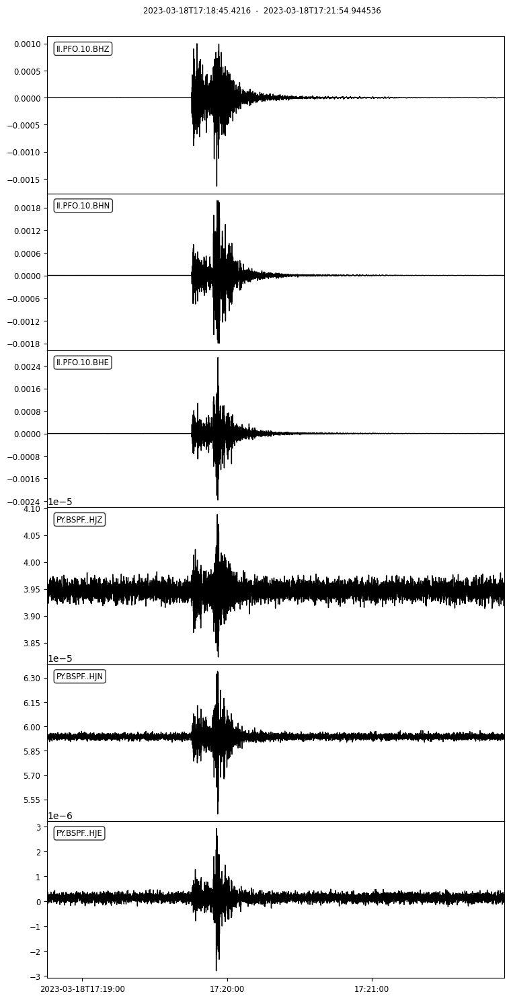


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230318T171945_raw.png ...

   -> Done

 -> 64 2023-03-21T04:13:20.119538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-21T04:12:20.122800Z - 2023-03-21T04:15:21.847800Z | 40.0 Hz, 7270 samples
PY.BSPF..HJN | 2023-03-21T04:12:20.122800Z - 2023-03-21T04:15:21.847800Z | 40.0 Hz, 7270 samples
PY.BSPF..HJZ | 2023-03-21T04:12:20.122800Z - 2023-03-21T04:15:21.847800Z | 40.0 Hz, 7270 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-21T04:12:20.122800Z - 2023-03-21T04:15:21.847800Z | 40.0 Hz, 7270 samples
PY.BSPF..HJN  | 2023-03-21T04:12:20.122800Z - 2023-03-21T04:15:21.847800Z | 40.0 Hz, 7270 samples
PY.BSPF..HJZ  | 2023-03-21T04:12:20.122800Z - 2023-03-21T04:15:21.847800Z | 40.0 Hz, 7270 samples
II.PFO.10.BHN | 2023-03-21T04:12:20.119538Z - 2023-03-21T04:15:21.869538Z | 40.0 Hz, 7271 samples
II.PFO.10.BHE | 2023-03-21T04:12:20.119538Z - 2023-03-21T04:15:21.869538Z | 40.0 Hz, 7271 samples
II.PFO.10.BHZ | 2023-03-21T04:12:20.119538Z - 2023-03-21T04:15:21.869538Z | 40.0 Hz, 7271 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-21T04:12:20.122800Z - 2023-03-21T04:15:21.847800Z | 40.0 Hz, 7270 samples
PY.BSPF..HJN  | 2023-03-21T04:12:20.122800Z - 2023-03-21T04:15:21.847800Z | 40.0 Hz, 7270 samples
PY.BSPF..HJZ  | 2023-03-21T04:12:20.122800Z - 2023-03-21T04:15:21.847800Z | 40.0 Hz, 7270 samples
II.PFO.10.BHN | 2023-03-21T04:12:20.119538Z - 2023-03-21T04:15:21.869538Z | 40.0 Hz, 7271 samples
II.PFO.10.BHE | 2023-03-21T04:12:20.119538Z - 2023-03-21T04:15:21.869538Z | 40.0 Hz, 7271 samples
II.PFO.10.BHZ | 2023-03-21T04:12:20.119538Z - 2023-03-21T04:15:21.869538Z | 40.0 Hz, 7271 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-21T04:12:20.122800Z - 2023-03-21T04:15:21.847800Z | 40.0 Hz, 7270 samples
PY.BSPF..HJN  | 2023-03-21T04:12:20.122800Z - 2023-03-21T04:15:21.847800Z | 40.0 Hz, 7270 samples
PY.BSPF..HJZ  | 2023-03-21T04:12:20.122800Z - 2023-03-21T04:15:21.847800Z | 40.0 Hz, 7270 samples
II.PFO.10.BHN | 2023-03-21T04:12:20.119538Z - 2023-03-21T04:15:21.869538Z | 40.0 Hz, 7271 samples
II.PFO.10.BHE | 2023-03-21T04:12:20.119538Z - 2023-03-21T04:15:21.869538Z | 40.0 Hz, 7271 samples
II.PFO.10.BHZ | 2023-03-21T04:12:20.119538Z - 2023-03-21T04:15:21.869538Z | 40.0 Hz, 7271 samples

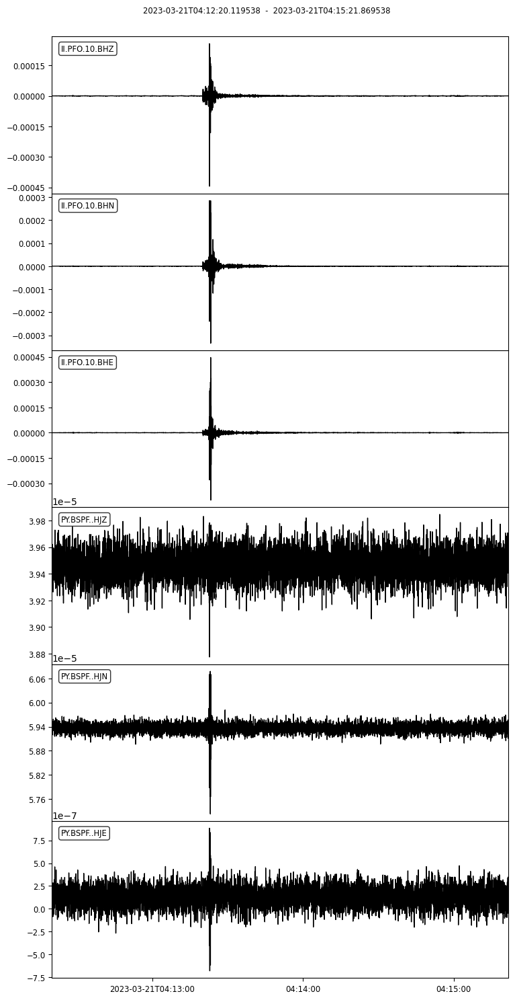


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230321T041320_raw.png ...

   -> Done

 -> 65 2023-03-22T03:21:38.494538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-22T03:20:38.497000Z - 2023-03-22T03:23:41.447000Z | 40.0 Hz, 7319 samples
PY.BSPF..HJN | 2023-03-22T03:20:38.497000Z - 2023-03-22T03:23:41.447000Z | 40.0 Hz, 7319 samples
PY.BSPF..HJZ | 2023-03-22T03:20:38.497000Z - 2023-03-22T03:23:41.447000Z | 40.0 Hz, 7319 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-22T03:20:38.497000Z - 2023-03-22T03:23:41.447000Z | 40.0 Hz, 7319 samples
PY.BSPF..HJN  | 2023-03-22T03:20:38.497000Z - 2023-03-22T03:23:41.447000Z | 40.0 Hz, 7319 samples
PY.BSPF..HJZ  | 2023-03-22T03:20:38.497000Z - 2023-03-22T03:23:41.447000Z | 40.0 Hz, 7319 samples
II.PFO.10.BHN | 2023-03-22T03:20:38.494538Z - 2023-03-22T03:23:41.469538Z | 40.0 Hz, 7320 samples
II.PFO.10.BHE | 2023-03-22T03:20:38.494538Z - 2023-03-22T03:23:41.469538Z | 40.0 Hz, 7320 samples
II.PFO.10.BHZ | 2023-03-22T03:20:38.494538Z - 2023-03-22T03:23:41.469538Z | 40.0 Hz, 7320 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-22T03:20:38.497000Z - 2023-03-22T03:23:41.447000Z | 40.0 Hz, 7319 samples
PY.BSPF..HJN  | 2023-03-22T03:20:38.497000Z - 2023-03-22T03:23:41.447000Z | 40.0 Hz, 7319 samples
PY.BSPF..HJZ  | 2023-03-22T03:20:38.497000Z - 2023-03-22T03:23:41.447000Z | 40.0 Hz, 7319 samples
II.PFO.10.BHN | 2023-03-22T03:20:38.494538Z - 2023-03-22T03:23:41.469538Z | 40.0 Hz, 7320 samples
II.PFO.10.BHE | 2023-03-22T03:20:38.494538Z - 2023-03-22T03:23:41.469538Z | 40.0 Hz, 7320 samples
II.PFO.10.BHZ | 2023-03-22T03:20:38.494538Z - 2023-03-22T03:23:41.469538Z | 40.0 Hz, 7320 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-22T03:20:38.497000Z - 2023-03-22T03:23:41.447000Z | 40.0 Hz, 7319 samples
PY.BSPF..HJN  | 2023-03-22T03:20:38.497000Z - 2023-03-22T03:23:41.447000Z | 40.0 Hz, 7319 samples
PY.BSPF..HJZ  | 2023-03-22T03:20:38.497000Z - 2023-03-22T03:23:41.447000Z | 40.0 Hz, 7319 samples
II.PFO.10.BHN | 2023-03-22T03:20:38.494538Z - 2023-03-22T03:23:41.469538Z | 40.0 Hz, 7320 samples
II.PFO.10.BHE | 2023-03-22T03:20:38.494538Z - 2023-03-22T03:23:41.469538Z | 40.0 Hz, 7320 samples
II.PFO.10.BHZ | 2023-03-22T03:20:38.494538Z - 2023-03-22T03:23:41.469538Z | 40.0 Hz, 7320 samples

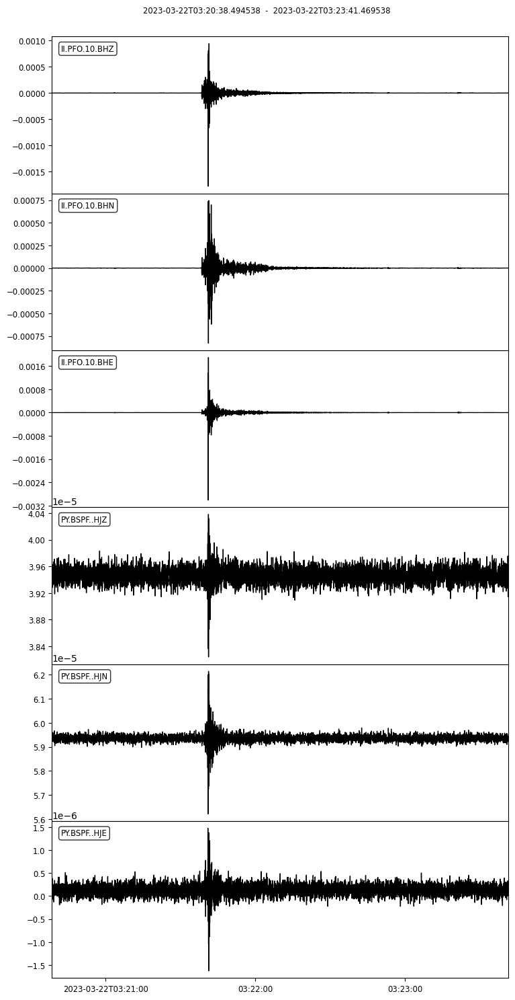


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230322T032138_raw.png ...

   -> Done

 -> 66 2023-03-24T13:45:21.569538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-24T13:44:21.572000Z - 2023-03-24T13:47:29.647000Z | 40.0 Hz, 7524 samples
PY.BSPF..HJN | 2023-03-24T13:44:21.572000Z - 2023-03-24T13:47:29.647000Z | 40.0 Hz, 7524 samples
PY.BSPF..HJZ | 2023-03-24T13:44:21.572000Z - 2023-03-24T13:47:29.647000Z | 40.0 Hz, 7524 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-24T13:44:21.572000Z - 2023-03-24T13:47:29.647000Z | 40.0 Hz, 7524 samples
PY.BSPF..HJN  | 2023-03-24T13:44:21.572000Z - 2023-03-24T13:47:29.647000Z | 40.0 Hz, 7524 samples
PY.BSPF..HJZ  | 2023-03-24T13:44:21.572000Z - 2023-03-24T13:47:29.647000Z | 40.0 Hz, 7524 samples
II.PFO.10.BHN | 2023-03-24T13:44:21.569538Z - 2023-03-24T13:47:29.669538Z | 40.0 Hz, 7525 samples
II.PFO.10.BHE | 2023-03-24T13:44:21.569538Z - 2023-03-24T13:47:29.669538Z | 40.0 Hz, 7525 samples
II.PFO.10.BHZ | 2023-03-24T13:44:21.569538Z - 2023-03-24T13:47:29.669538Z | 40.0 Hz, 7525 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-24T13:44:21.572000Z - 2023-03-24T13:47:29.647000Z | 40.0 Hz, 7524 samples
PY.BSPF..HJN  | 2023-03-24T13:44:21.572000Z - 2023-03-24T13:47:29.647000Z | 40.0 Hz, 7524 samples
PY.BSPF..HJZ  | 2023-03-24T13:44:21.572000Z - 2023-03-24T13:47:29.647000Z | 40.0 Hz, 7524 samples
II.PFO.10.BHN | 2023-03-24T13:44:21.569538Z - 2023-03-24T13:47:29.669538Z | 40.0 Hz, 7525 samples
II.PFO.10.BHE | 2023-03-24T13:44:21.569538Z - 2023-03-24T13:47:29.669538Z | 40.0 Hz, 7525 samples
II.PFO.10.BHZ | 2023-03-24T13:44:21.569538Z - 2023-03-24T13:47:29.669538Z | 40.0 Hz, 7525 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-24T13:44:21.572000Z - 2023-03-24T13:47:29.647000Z | 40.0 Hz, 7524 samples
PY.BSPF..HJN  | 2023-03-24T13:44:21.572000Z - 2023-03-24T13:47:29.647000Z | 40.0 Hz, 7524 samples
PY.BSPF..HJZ  | 2023-03-24T13:44:21.572000Z - 2023-03-24T13:47:29.647000Z | 40.0 Hz, 7524 samples
II.PFO.10.BHN | 2023-03-24T13:44:21.569538Z - 2023-03-24T13:47:29.669538Z | 40.0 Hz, 7525 samples
II.PFO.10.BHE | 2023-03-24T13:44:21.569538Z - 2023-03-24T13:47:29.669538Z | 40.0 Hz, 7525 samples
II.PFO.10.BHZ | 2023-03-24T13:44:21.569538Z - 2023-03-24T13:47:29.669538Z | 40.0 Hz, 7525 samples

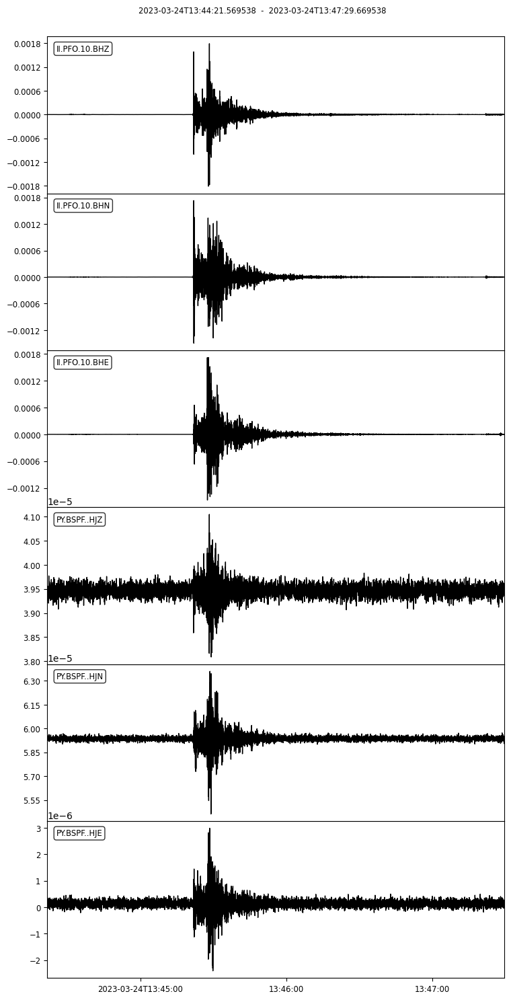


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230324T134521_raw.png ...

   -> Done

 -> 67 2023-03-24T15:04:12.119538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJN | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJZ | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJN  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJZ  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
II.PFO.10.BHN | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples
II.PFO.10.BHE | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples
II.PFO.10.BHZ | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJN  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJZ  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
II.PFO.10.BHN | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples
II.PFO.10.BHE | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples
II.PFO.10.BHZ | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJN  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJZ  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
II.PFO.10.BHN | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples
II.PFO.10.BHE | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples
II.PFO.10.BHZ | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples

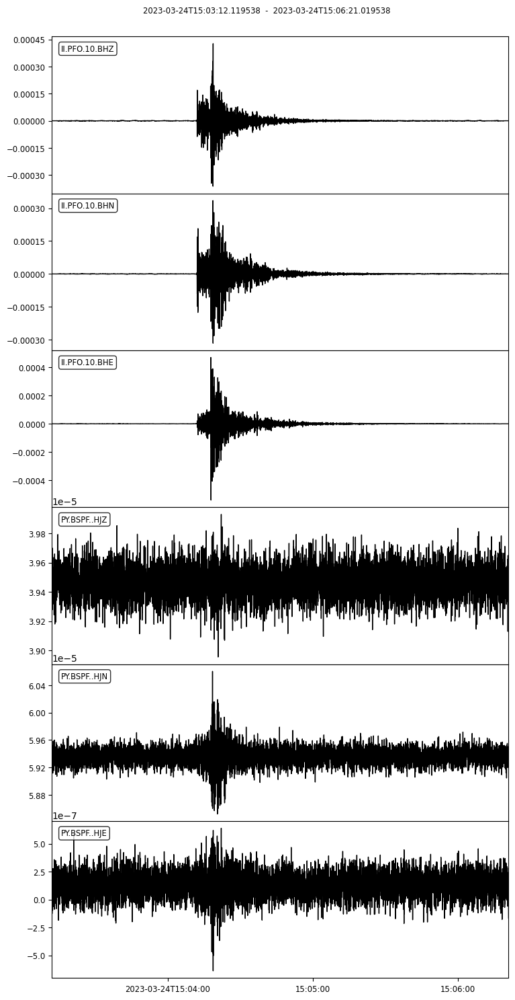


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230324T150412_raw.png ...

   -> Done

 -> 68 2023-03-24T15:04:12.119538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJN | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJZ | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJN  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJZ  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
II.PFO.10.BHN | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples
II.PFO.10.BHE | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples
II.PFO.10.BHZ | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJN  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJZ  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
II.PFO.10.BHN | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples
II.PFO.10.BHE | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples
II.PFO.10.BHZ | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJN  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
PY.BSPF..HJZ  | 2023-03-24T15:03:12.122000Z - 2023-03-24T15:06:20.997000Z | 40.0 Hz, 7556 samples
II.PFO.10.BHN | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples
II.PFO.10.BHE | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples
II.PFO.10.BHZ | 2023-03-24T15:03:12.119538Z - 2023-03-24T15:06:21.019538Z | 40.0 Hz, 7557 samples

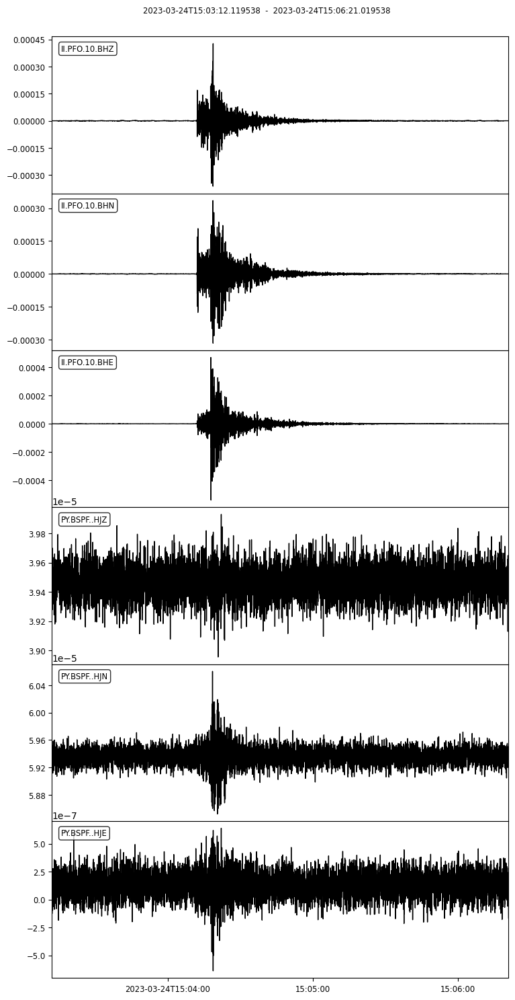


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230324T150412_raw.png ...

   -> Done

 -> 69 2023-03-27T09:29:03.444538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-27T09:28:03.448100Z - 2023-03-27T09:31:10.398100Z | 40.0 Hz, 7479 samples
PY.BSPF..HJN | 2023-03-27T09:28:03.448100Z - 2023-03-27T09:31:10.398100Z | 40.0 Hz, 7479 samples
PY.BSPF..HJZ | 2023-03-27T09:28:03.448100Z - 2023-03-27T09:31:10.398100Z | 40.0 Hz, 7479 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-27T09:28:03.448100Z - 2023-03-27T09:31:10.398100Z | 40.0 Hz, 7479 samples
PY.BSPF..HJN  | 2023-03-27T09:28:03.448100Z - 2023-03-27T09:31:10.398100Z | 40.0 Hz, 7479 samples
PY.BSPF..HJZ  | 2023-03-27T09:28:03.448100Z - 2023-03-27T09:31:10.398100Z | 40.0 Hz, 7479 samples
II.PFO.10.BHN | 2023-03-27T09:28:03.444538Z - 2023-03-27T09:31:10.419538Z | 40.0 Hz, 7480 samples
II.PFO.10.BHE | 2023-03-27T09:28:03.444538Z - 2023-03-27T09:31:10.419538Z | 40.0 Hz, 7480 samples
II.PFO.10.BHZ | 2023-03-27T09:28:03.444538Z - 2023-03-27T09:31:10.419538Z | 40.0 Hz, 7480 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-27T09:28:03.448100Z - 2023-03-27T09:31:10.398100Z | 40.0 Hz, 7479 samples
PY.BSPF..HJN  | 2023-03-27T09:28:03.448100Z - 2023-03-27T09:31:10.398100Z | 40.0 Hz, 7479 samples
PY.BSPF..HJZ  | 2023-03-27T09:28:03.448100Z - 2023-03-27T09:31:10.398100Z | 40.0 Hz, 7479 samples
II.PFO.10.BHN | 2023-03-27T09:28:03.444538Z - 2023-03-27T09:31:10.419538Z | 40.0 Hz, 7480 samples
II.PFO.10.BHE | 2023-03-27T09:28:03.444538Z - 2023-03-27T09:31:10.419538Z | 40.0 Hz, 7480 samples
II.PFO.10.BHZ | 2023-03-27T09:28:03.444538Z - 2023-03-27T09:31:10.419538Z | 40.0 Hz, 7480 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-27T09:28:03.448100Z - 2023-03-27T09:31:10.398100Z | 40.0 Hz, 7479 samples
PY.BSPF..HJN  | 2023-03-27T09:28:03.448100Z - 2023-03-27T09:31:10.398100Z | 40.0 Hz, 7479 samples
PY.BSPF..HJZ  | 2023-03-27T09:28:03.448100Z - 2023-03-27T09:31:10.398100Z | 40.0 Hz, 7479 samples
II.PFO.10.BHN | 2023-03-27T09:28:03.444538Z - 2023-03-27T09:31:10.419538Z | 40.0 Hz, 7480 samples
II.PFO.10.BHE | 2023-03-27T09:28:03.444538Z - 2023-03-27T09:31:10.419538Z | 40.0 Hz, 7480 samples
II.PFO.10.BHZ | 2023-03-27T09:28:03.444538Z - 2023-03-27T09:31:10.419538Z | 40.0 Hz, 7480 samples

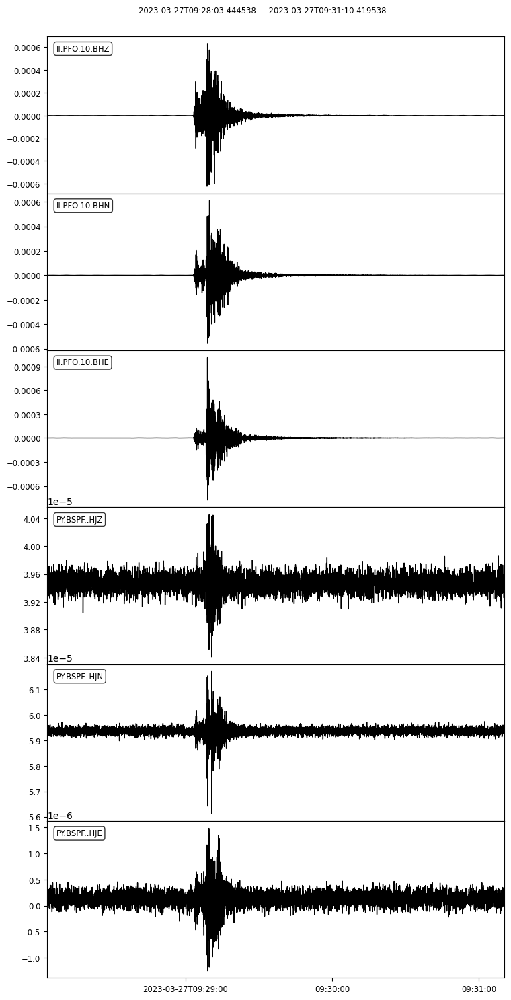


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230327T092903_raw.png ...

   -> Done

 -> 70 2023-03-31T12:05:42.244538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJN | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJZ | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJN  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJZ  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
II.PFO.10.BHN | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples
II.PFO.10.BHE | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples
II.PFO.10.BHZ | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJN  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJZ  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
II.PFO.10.BHN | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples
II.PFO.10.BHE | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples
II.PFO.10.BHZ | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJN  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJZ  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
II.PFO.10.BHN | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples
II.PFO.10.BHE | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples
II.PFO.10.BHZ | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples

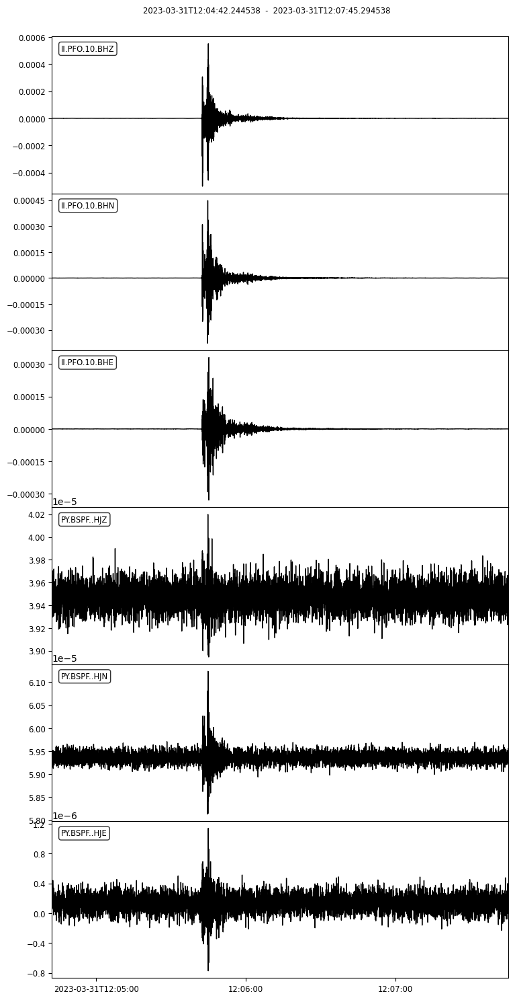


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230331T120542_raw.png ...

   -> Done

 -> 71 2023-03-31T12:05:42.244538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJN | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJZ | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJN  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJZ  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
II.PFO.10.BHN | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples
II.PFO.10.BHE | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples
II.PFO.10.BHZ | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJN  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJZ  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
II.PFO.10.BHN | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples
II.PFO.10.BHE | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples
II.PFO.10.BHZ | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJN  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
PY.BSPF..HJZ  | 2023-03-31T12:04:42.248200Z - 2023-03-31T12:07:45.273200Z | 40.0 Hz, 7322 samples
II.PFO.10.BHN | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples
II.PFO.10.BHE | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples
II.PFO.10.BHZ | 2023-03-31T12:04:42.244538Z - 2023-03-31T12:07:45.294538Z | 40.0 Hz, 7323 samples

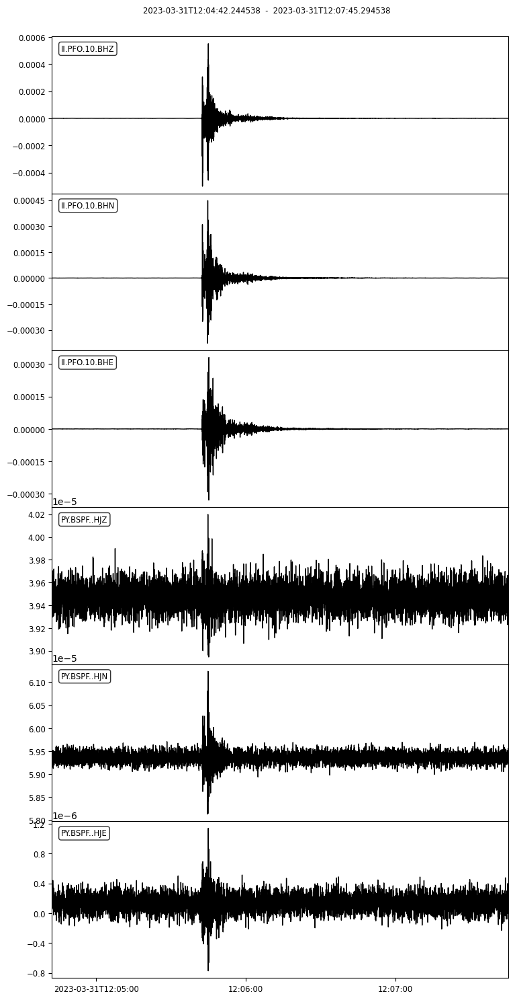


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230331T120542_raw.png ...

   -> Done

 -> 72 2023-03-31T13:37:05.019538Z 
 -> sensitivity removed!
 -> response removed!


3 Trace(s) in Stream:
PY.BSPF..HJE | 2023-03-31T13:36:05.023200Z - 2023-03-31T13:39:12.948200Z | 40.0 Hz, 7518 samples
PY.BSPF..HJN | 2023-03-31T13:36:05.023200Z - 2023-03-31T13:39:12.948200Z | 40.0 Hz, 7518 samples
PY.BSPF..HJZ | 2023-03-31T13:36:05.023200Z - 2023-03-31T13:39:12.948200Z | 40.0 Hz, 7518 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-31T13:36:05.023200Z - 2023-03-31T13:39:12.948200Z | 40.0 Hz, 7518 samples
PY.BSPF..HJN  | 2023-03-31T13:36:05.023200Z - 2023-03-31T13:39:12.948200Z | 40.0 Hz, 7518 samples
PY.BSPF..HJZ  | 2023-03-31T13:36:05.023200Z - 2023-03-31T13:39:12.948200Z | 40.0 Hz, 7518 samples
II.PFO.10.BHN | 2023-03-31T13:36:05.019538Z - 2023-03-31T13:39:12.969538Z | 40.0 Hz, 7519 samples
II.PFO.10.BHE | 2023-03-31T13:36:05.019538Z - 2023-03-31T13:39:12.969538Z | 40.0 Hz, 7519 samples
II.PFO.10.BHZ | 2023-03-31T13:36:05.019538Z - 2023-03-31T13:39:12.969538Z | 40.0 Hz, 7519 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-31T13:36:05.023200Z - 2023-03-31T13:39:12.948200Z | 40.0 Hz, 7518 samples
PY.BSPF..HJN  | 2023-03-31T13:36:05.023200Z - 2023-03-31T13:39:12.948200Z | 40.0 Hz, 7518 samples
PY.BSPF..HJZ  | 2023-03-31T13:36:05.023200Z - 2023-03-31T13:39:12.948200Z | 40.0 Hz, 7518 samples
II.PFO.10.BHN | 2023-03-31T13:36:05.019538Z - 2023-03-31T13:39:12.969538Z | 40.0 Hz, 7519 samples
II.PFO.10.BHE | 2023-03-31T13:36:05.019538Z - 2023-03-31T13:39:12.969538Z | 40.0 Hz, 7519 samples
II.PFO.10.BHZ | 2023-03-31T13:36:05.019538Z - 2023-03-31T13:39:12.969538Z | 40.0 Hz, 7519 samples

6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-03-31T13:36:05.023200Z - 2023-03-31T13:39:12.948200Z | 40.0 Hz, 7518 samples
PY.BSPF..HJN  | 2023-03-31T13:36:05.023200Z - 2023-03-31T13:39:12.948200Z | 40.0 Hz, 7518 samples
PY.BSPF..HJZ  | 2023-03-31T13:36:05.023200Z - 2023-03-31T13:39:12.948200Z | 40.0 Hz, 7518 samples
II.PFO.10.BHN | 2023-03-31T13:36:05.019538Z - 2023-03-31T13:39:12.969538Z | 40.0 Hz, 7519 samples
II.PFO.10.BHE | 2023-03-31T13:36:05.019538Z - 2023-03-31T13:39:12.969538Z | 40.0 Hz, 7519 samples
II.PFO.10.BHZ | 2023-03-31T13:36:05.019538Z - 2023-03-31T13:39:12.969538Z | 40.0 Hz, 7519 samples

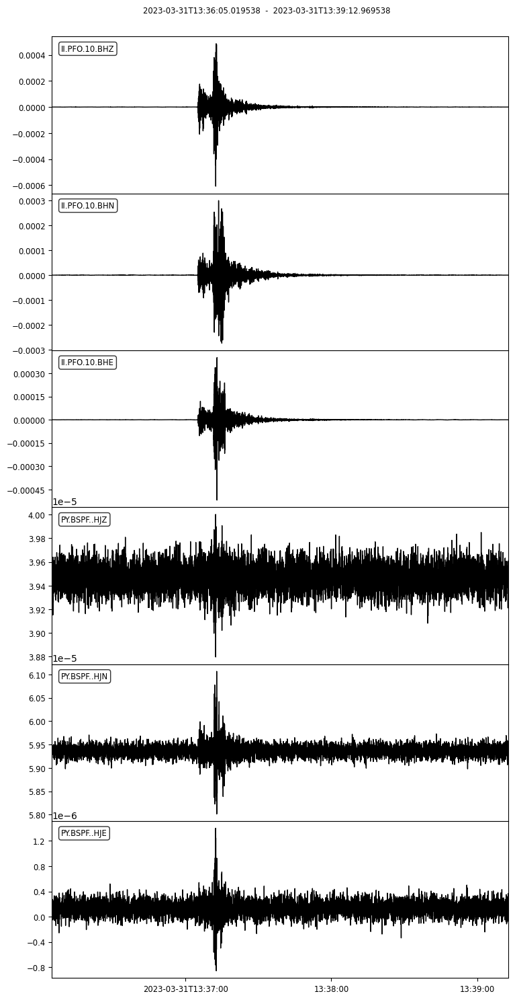


   -> saving /import/kilauea-data/BSPF/figures/triggered2/raw/20230331T133705_raw.png ...

   -> Done



TypeError: 'module' object is not callable

In [57]:

errors = []
details = False

for jj, ev in enumerate(tqdm(events.index)):
# for jj, ev in enumerate([0,1]):
    
    print(f" -> {jj} {events.origin[jj]} ")
    
    ## configurations
    config['title'] = f"{events.origin[jj]} UTC"
    config['tbeg'] = obs.UTCDateTime(str(events.origin[jj]))
    config['fmin'], config['fmax'] = 0.02, 18.0
    
    config['tend'] = obs.UTCDateTime(events.origin[jj]) + events.duration[jj] + 10
    
    ## load and process blueSeis data
    try:
        py_bspf0, py_bspf_inv = __request_data(config['seed_blueseis'], config['tbeg'], config['tend'])
        
    except Exception as e:
        print(e) if details else None
        print(f" -> failed to request blueseis for event: {ev}") if details else None
        errors.append(f" -> failed to request blueseis for event: {ev}")
        continue
        
        
    ## load and process seismometer data
    try:        
        ii_pfo0, ii_pfo_inv = __request_data(config['seed_seismometer'], config['tbeg'], config['tend'])
        
    except Exception as e:
        print(e) if details else None
        print(f" -> failed to request seismometer for event: {ev}") if details else None
        errors.append(f" -> failed to request seismometer for event: {ev}")
        continue


    if py_bspf0 is None or ii_pfo0 is None:
        continue
        
        
    ## processing data
#     py_bspf = __process_bspf(config, py_bspf0, py_bspf_inv)
#     ii_pfo = __process_xpfo(config, ii_pfo0, ii_pfo_inv)

    py_bspf0.resample(40)
    
    ## joining data
    
    st0 = py_bspf0
    st0 += ii_pfo0    
    
    st = st0.copy() 
    st.detrend("linear")
    st.taper(0.01)
    st.filter("bandpass", freqmin=config['fmin'], freqmax=config['fmax'], corners=4, zerophase=True)
    
    event_name = str(events.origin[jj]).replace("-","").replace(":","").replace(" ", "_").split(".")[0]
    
    ## plotting
    
    fig = st0.plot(equal_scale=False);

#     fig1 = __makeplot(config, st)

#     fig2 = __makeplotStreamSpectra2(st, config, fscale="linlin");
    
    ## saving figures
    __savefig(fig, outpath=config['outpath_figs']+"raw/", outname=f"{event_name}_raw", mode="png")        
    
#     __savefig(fig1, outpath=config['outpath_figs']+"filtered/", outname=f"{event_name}_traces", mode="png")
    
#     __savefig(fig2, outpath=config['outpath_figs']+"spectra/", outname=f"{event_name}_spectra", mode="png")

pprint.pprint(errors)